# Preparation

## Import Libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
from sklearn import tree
from sklearn.metrics import accuracy_score

from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

    
matplotlib.rcParams['axes.unicode_minus'] = False   
#그래프에서 마이너스 기호가 표시되도록 하는 설정입니다.

In [2]:
import matplotlib as mpl
import matplotlib.ticker as ticker
from scipy.stats import pearsonr, spearmanr, chi2_contingency, ttest_ind, mannwhitneyu, norm, normaltest, shapiro, anderson
from matplotlib import font_manager, rc

import platform
import math
import operator
from IPython.display import HTML, display
sns.set(rc={'figure.figsize':(10,5)})
sns.set_style('whitegrid')
%matplotlib inline


In [3]:
pd.set_option('display.max_row', 500)
pd.set_option('display.max_columns', 100)

## Dataset

In [5]:
drug = pd.read_csv("C:/Users/yujinjeong/Desktop/drug_consumption.csv")

In [6]:
drug

,ID,Age,Gender,Education,Country,Ethnicity,Nscore,Escore,Oscore,Ascore,Cscore,Impulsive,SS,Alcohol,Amphet,Amyl,Benzos,Caff,Cannabis,Choc,Coke,Crack,Ecstasy,Heroin,Ketamine,Legalh,LSD,Meth,Mushrooms,Nicotine,Semer,VSA
0,1,0.49788,0.48246,-0.05921,0.96082,0.12600,0.31287,-0.57545,-0.58331,-0.91699,-0.00665,-0.21712,-1.18084,CL5,CL2,CL0,CL2,CL6,CL0,CL5,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL2,CL0,CL0
1,2,-0.07854,-0.48246,1.98437,0.96082,-0.31685,-0.67825,1.93886,1.43533,0.76096,-0.14277,-0.71126,-0.21575,CL5,CL2,CL2,CL0,CL6,CL4,CL6,CL3,CL0,CL4,CL0,CL2,CL0,CL2,CL3,CL0,CL4,CL0,CL0
2,3,0.49788,-0.48246,-0.05921,0.96082,-0.31685,-0.46725,0.80523,-0.84732,-1.62090,-1.01450,-1.37983,0.40148,CL6,CL0,CL0,CL0,CL6,CL3,CL4,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL1,CL0,CL0,CL0
3,4,-0.95197,0.48246,1.16365,0.96082,-0.31685,-0.14882,-0.80615,-0.01928,0.59042,0.58489,-1.37983,-1.18084,CL4,CL0,CL0,CL3,CL5,CL2,CL4,CL2,CL0,CL0,CL0,CL2,CL0,CL0,CL0,CL0,CL2,CL0,CL0
4,5,0.49788,0.48246,1.98437,0.96082,-0.31685,0.73545,-1.63340,-0.45174,-0.30172,1.30612,-0.21712,-0.21575,CL4,CL1,CL1,CL0,CL6,CL3,CL6,CL0,CL0,CL1,CL0,CL0,CL1,CL0,CL0,CL2,CL2,CL0,CL0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1880,1884,-0.95197,0.48246,-0.61113,-0.57009,-0.31685,-1.19430,1.74091,1.88511,0.76096,-1.13788,0.88113,1.92173,CL5,CL0,CL0,CL0,CL4,CL5,CL4,CL0,CL0,CL0,CL0,CL0,CL3,CL3,CL0,CL0,CL0,CL0,CL5
1881,1885,-0.95197,-0.48246,-0.61113,-0.57009,-0.31685,-0.24649,1.74091,0.58331,0.76096,-1.51840,0.88113,0.76540,CL5,CL0,CL0,CL0,CL5,CL3,CL4,CL0,CL0,CL2,CL0,CL0,CL3,CL5,CL4,CL4,CL5,CL0,CL0
1882,1886,-0.07854,0.48246,0.45468,-0.57009,-0.31685,1.13281,-1.37639,-1.27553,-1.77200,-1.38502,0.52975,-0.52593,CL4,CL6,CL5,CL5,CL6,CL6,CL6,CL4,CL0,CL4,CL0,CL2,CL0,CL2,CL0,CL2,CL6,CL0,CL0
1883,1887,-0.95197,0.48246,-0.61113,-0.57009,-0.31685,0.91093,-1.92173,0.29338,-1.62090,-2.57309,1.29221,1.22470,CL5,CL0,CL0,CL0,CL6,CL6,CL5,CL0,CL0,CL3,CL0,CL0,CL3,CL3,CL0,CL3,CL4,CL0,CL0


### Dataset columns

drug(1885x32)  
ID column  
5 demographic columns  
7 personality traits(Big5 + Impulsiveness, Sensation)  

target ; 18 drugs with their usage frequency  
*Seremon* ; fake drug to capture over-claimers 

일단 나라와 인종은 안 바꿨음!!  

**Country and Ethnicity**

In [7]:
drug.columns

Index(['ID', 'Age', 'Gender', 'Education', 'Country', 'Ethnicity', 'Nscore',
       'Escore', 'Oscore', 'Ascore', 'Cscore', 'Impulsive', 'SS', 'Alcohol',
       'Amphet', 'Amyl', 'Benzos', 'Caff', 'Cannabis', 'Choc', 'Coke', 'Crack',
       'Ecstasy', 'Heroin', 'Ketamine', 'Legalh', 'LSD', 'Meth', 'Mushrooms',
       'Nicotine', 'Semer', 'VSA'],
      dtype='object')

In [8]:
demographic_columns = [
    'Age', 
    'Gender', 
    'Education', 
    'Country',
    'Ethnicity',
]

personality_columns = [
    'Nscore',
    'Escore',
    'Oscore',
    'Ascore',
    'Cscore',
    'Impulsive',
    'SS'
]

feature_columns = demographic_columns + personality_columns

drugs_columns = [
    'Alcohol',
    'Amphet',
    'Amyl',
    'Benzos',
    'Caff',
    'Cannabis',
    'Choc',
    'Coke',
    'Crack',
    'Ecstasy',
    'Heroin',
    'Ketamine',
    'Legalh',
    'LSD',
    'Meth',
    'Mushrooms',
    'Nicotine',
    'Semer',
    'VSA'
]

drugs_legal = ['Alcohol consumption', 'Caffeine consumption', 'Chocolate consumption', 'Nicotine consumption']

drugs_illegal = [drug for drug in drugs_columns if drug not in drugs_legal]

all_columns = feature_columns + drugs_columns

### Dataset trim

*Set ID column as row index*

In [9]:
drug1 = drug.set_index("ID")

In [10]:
drug1.head()

,Age,Gender,Education,Country,Ethnicity,Nscore,Escore,Oscore,Ascore,Cscore,Impulsive,SS,Alcohol,Amphet,Amyl,Benzos,Caff,Cannabis,Choc,Coke,Crack,Ecstasy,Heroin,Ketamine,Legalh,LSD,Meth,Mushrooms,Nicotine,Semer,VSA
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,0.49788,0.48246,-0.05921,0.96082,0.12600,0.31287,-0.57545,-0.58331,-0.91699,-0.00665,-0.21712,-1.18084,CL5,CL2,CL0,CL2,CL6,CL0,CL5,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL2,CL0,CL0
2,-0.07854,-0.48246,1.98437,0.96082,-0.31685,-0.67825,1.93886,1.43533,0.76096,-0.14277,-0.71126,-0.21575,CL5,CL2,CL2,CL0,CL6,CL4,CL6,CL3,CL0,CL4,CL0,CL2,CL0,CL2,CL3,CL0,CL4,CL0,CL0
3,0.49788,-0.48246,-0.05921,0.96082,-0.31685,-0.46725,0.80523,-0.84732,-1.62090,-1.01450,-1.37983,0.40148,CL6,CL0,CL0,CL0,CL6,CL3,CL4,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL1,CL0,CL0,CL0
4,-0.95197,0.48246,1.16365,0.96082,-0.31685,-0.14882,-0.80615,-0.01928,0.59042,0.58489,-1.37983,-1.18084,CL4,CL0,CL0,CL3,CL5,CL2,CL4,CL2,CL0,CL0,CL0,CL2,CL0,CL0,CL0,CL0,CL2,CL0,CL0
5,0.49788,0.48246,1.98437,0.96082,-0.31685,0.73545,-1.63340,-0.45174,-0.30172,1.30612,-0.21712,-0.21575,CL4,CL1,CL1,CL0,CL6,CL3,CL6,CL0,CL0,CL1,CL0,CL0,CL1,CL0,CL0,CL2,CL2,CL0,CL0


In [11]:
drug1.isnull().values.any()

False

### Drug ; Nominal to ordinal

Since our targets are nominal data, turn them into ordinal data

In [12]:
for i in drugs_columns:
    drug1[i] = drug1[i].map({'CL0': 0, 'CL1': 1, 'CL2': 2, 'CL3': 3, 'CL4': 4, 'CL5': 5, 'CL6': 6})

### Check over-claimers

In [13]:
semerons = drug1[drug1['Semer']!=0]
semerons

,Age,Gender,Education,Country,Ethnicity,Nscore,Escore,Oscore,Ascore,Cscore,Impulsive,SS,Alcohol,Amphet,Amyl,Benzos,Caff,Cannabis,Choc,Coke,Crack,Ecstasy,Heroin,Ketamine,Legalh,LSD,Meth,Mushrooms,Nicotine,Semer,VSA
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
730,-0.07854,0.48246,-1.73790,-0.09765,-0.31685,-0.58016,0.32197,0.14143,-0.60633,0.12331,1.29221,0.76540,6,2,2,2,6,6,5,2,2,2,2,2,0,4,2,6,6,2,2
821,-0.95197,-0.48246,-0.61113,-0.09765,-0.50212,-0.67825,1.74091,0.72330,0.13136,0.41594,0.88113,1.92173,3,0,0,0,6,4,5,0,0,3,0,0,0,5,0,5,4,3,0
1520,-0.95197,-0.48246,-0.61113,-0.57009,-0.31685,-0.24649,-0.80615,-1.27553,-1.34289,-1.92173,-0.71126,0.07987,0,2,3,2,3,4,1,3,2,1,2,1,2,1,2,4,2,3,1
1537,-0.95197,0.48246,-0.61113,-0.57009,0.11440,-0.46725,0.80523,0.29338,2.03972,1.81175,-1.37983,-0.21575,5,6,0,4,6,3,6,4,0,4,0,4,3,2,0,3,4,4,3
1702,0.49788,0.48246,0.45468,-0.57009,-0.31685,1.98437,-0.80615,2.15324,0.76096,-0.00665,1.29221,1.92173,6,0,0,3,5,6,4,2,0,2,0,2,2,2,0,2,6,2,0
1773,-0.95197,-0.48246,-1.22751,-0.57009,-0.22166,-0.34799,1.28610,1.06238,-0.01729,-0.52745,0.52975,1.22470,4,3,0,3,6,6,6,0,0,3,0,4,3,6,3,3,3,1,3
1810,-0.95197,0.48246,-1.43719,-0.57009,-0.31685,1.23461,1.11406,1.06238,-1.47955,0.12331,0.88113,1.92173,4,3,0,2,6,6,3,5,2,4,2,1,4,1,0,1,6,1,2
1827,-0.95197,0.48246,0.45468,-0.57009,-0.31685,0.22393,-0.30033,0.88309,1.28610,-0.00665,0.88113,0.07987,4,0,0,2,5,6,5,2,0,0,0,0,2,3,0,3,5,2,0


**!!! Should we just remove these data ??**  
Yes...maybe..
Let's reduce these 8 people.

In [14]:
drug1 = drug1[drug1['Semer'] == 0]
# Removing it from drug lists
drugs_columns.remove('Semer')
drugs_illegal.remove('Semer')
#Dropping the column from the drug1
drug1.drop(columns='Semer')
drug1.shape


(1877, 31)

### create sum without semeron

In [93]:
drug2 = drug1.copy()

In [94]:
drug2["sum"] = drug2.sum(axis=1)

<AxesSubplot:xlabel='Age', ylabel='sum'>

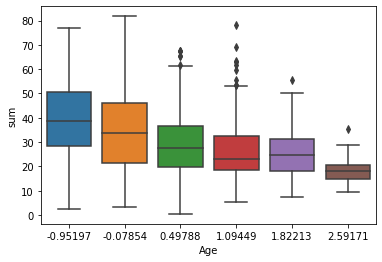

In [96]:
sns.boxplot(x='Age',y='sum',data=drug2)

<AxesSubplot:xlabel='Gender', ylabel='sum'>

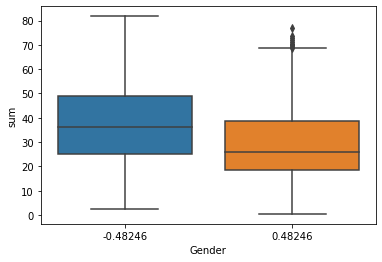

In [98]:
sns.boxplot(x='Gender',y='sum',data=drug2)


<AxesSubplot:xlabel='Education', ylabel='sum'>

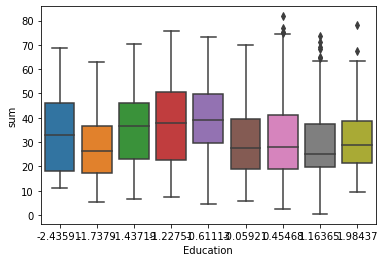

In [99]:
sns.boxplot(data=drug2, x='Education', y='sum' )


<AxesSubplot:xlabel='Country', ylabel='sum'>

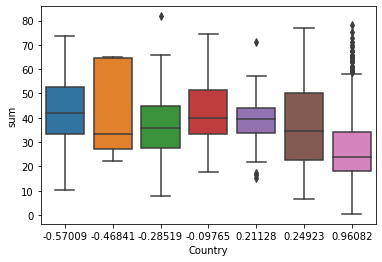

In [100]:
sns.boxplot(data=drug2, x='Country', y='sum' )


<AxesSubplot:xlabel='Ethnicity', ylabel='sum'>

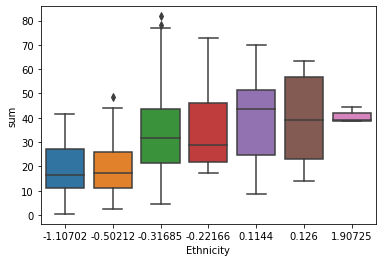

In [101]:
sns.boxplot(data=drug2, x='Ethnicity', y='sum' )


<AxesSubplot:xlabel='Nscore', ylabel='sum'>

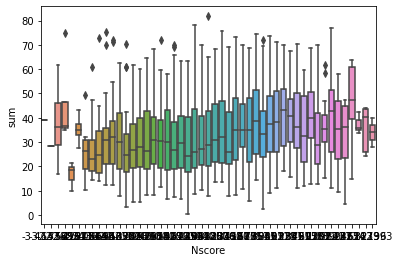

In [102]:
sns.boxplot(data=drug2, x='Nscore', y='sum' )


<AxesSubplot:xlabel='Nscore', ylabel='sum'>

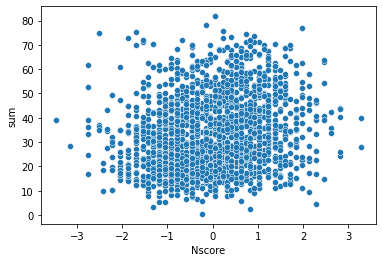

In [103]:
sns.scatterplot(data=drug2,x='Nscore',y='sum')


<AxesSubplot:xlabel='Escore', ylabel='sum'>

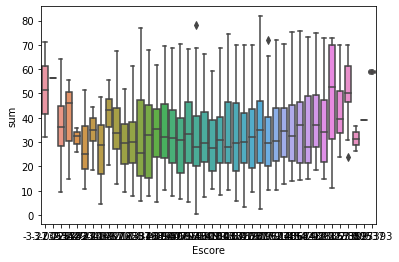

In [104]:
sns.boxplot(data=drug2, x='Escore', y='sum' )


<AxesSubplot:xlabel='Escore', ylabel='sum'>

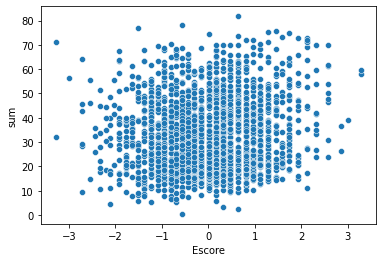

In [105]:
sns.scatterplot(data=drug2, x='Escore', y='sum' )


<AxesSubplot:xlabel='Oscore', ylabel='sum'>

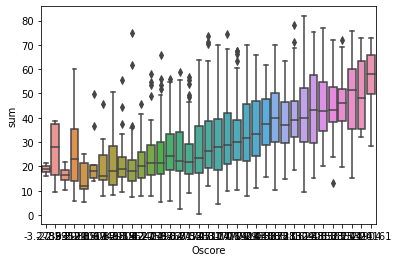

In [106]:
sns.boxplot(data=drug2, x='Oscore', y='sum' )


<AxesSubplot:xlabel='Oscore', ylabel='sum'>

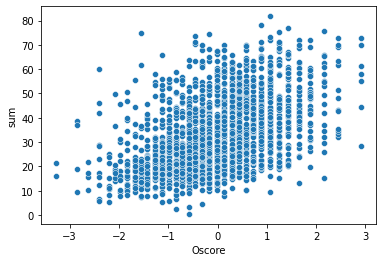

In [107]:
sns.scatterplot(data=drug2,x='Oscore',y='sum')


<AxesSubplot:xlabel='Ascore', ylabel='sum'>

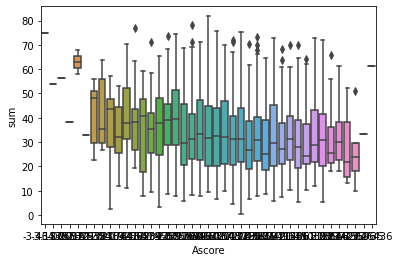

In [108]:
sns.boxplot(data=drug2, x='Ascore', y='sum' )


<AxesSubplot:xlabel='Ascore', ylabel='sum'>

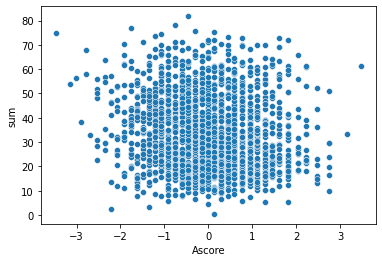

In [109]:
sns.scatterplot(data=drug2, x='Ascore', y='sum' )


<AxesSubplot:xlabel='Cscore', ylabel='sum'>

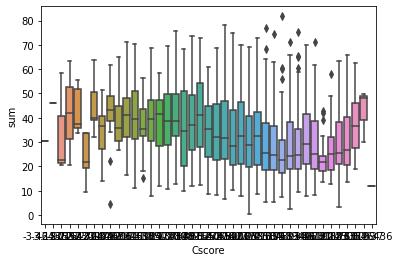

In [110]:
sns.boxplot(data=drug2, x='Cscore', y='sum' )


<AxesSubplot:xlabel='Cscore', ylabel='sum'>

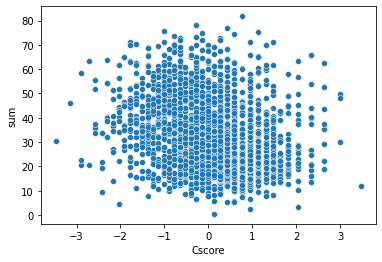

In [111]:
sns.scatterplot(data=drug2, x='Cscore', y='sum' )


<AxesSubplot:xlabel='Impulsive', ylabel='sum'>

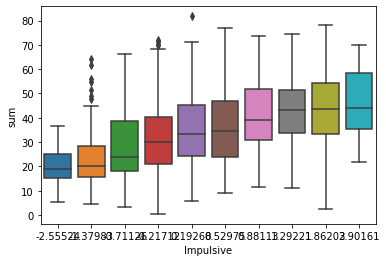

In [112]:
sns.boxplot(data=drug2, x='Impulsive', y='sum')


<AxesSubplot:xlabel='Impulsive', ylabel='sum'>

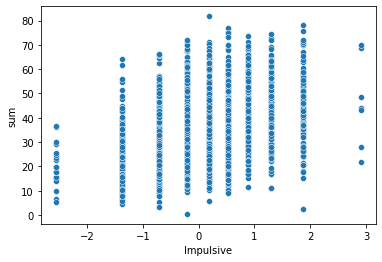

In [113]:
sns.scatterplot(data=drug2, x='Impulsive', y='sum' )


<AxesSubplot:xlabel='SS', ylabel='sum'>

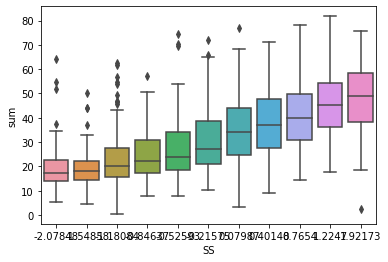

In [114]:
sns.boxplot(data=drug2, x='SS', y='sum' )


<AxesSubplot:xlabel='SS', ylabel='sum'>

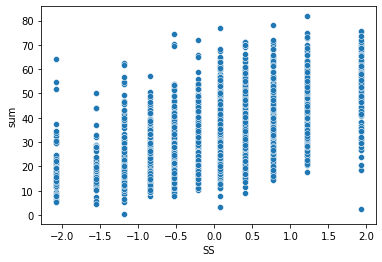

In [115]:
sns.scatterplot(data=drug2, x='SS', y='sum' )


# EDA & Visualization

In [17]:
dataset = drug1

In [18]:
dataset.describe()

,Age,Gender,Education,Country,Ethnicity,Nscore,Escore,Oscore,Ascore,Cscore,Impulsive,SS,Alcohol,Amphet,Amyl,Benzos,Caff,Cannabis,Choc,Coke,Crack,Ecstasy,Heroin,Ketamine,Legalh,LSD,Meth,Mushrooms,Nicotine,Semer,VSA
count,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.0,1877.000000
mean,0.037577,-0.000771,-0.000984,0.358984,-0.309728,-0.000551,-0.001951,-0.003224,-0.000657,-0.000394,0.005293,-0.007408,4.637720,1.337773,0.606819,1.461907,5.484283,2.980288,5.109750,1.156633,0.295685,1.309536,0.372403,0.564198,1.353223,1.053277,0.826319,1.177944,3.194992,0.0,0.429409
std,0.878387,0.482588,0.949831,0.699707,0.166220,0.998442,0.997418,0.995691,0.996689,0.997657,0.954148,0.962074,1.328234,1.782384,1.064005,1.869193,1.115119,2.286778,1.085716,1.510791,0.835925,1.647373,1.034761,1.216341,1.790881,1.484582,1.648379,1.459212,2.415814,0.0,0.959160
min,-0.951970,-0.482460,-2.435910,-0.570090,-1.107020,-3.464360,-3.273930,-3.273930,-3.464360,-3.464360,-2.555240,-2.078480,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
25%,-0.951970,-0.482460,-0.611130,-0.570090,-0.316850,-0.678250,-0.695090,-0.717270,-0.606330,-0.652530,-0.711260,-0.525930,4.000000,0.000000,0.000000,0.000000,5.000000,1.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.0,0.000000
50%,-0.078540,-0.482460,-0.059210,0.960820,-0.316850,0.042570,0.003320,-0.019280,-0.017290,-0.006650,-0.217120,0.079870,5.000000,0.000000,0.000000,0.000000,6.000000,3.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,0.0,0.000000
75%,0.497880,0.482460,0.454680,0.960820,-0.316850,0.629670,0.637790,0.723300,0.760960,0.584890,0.529750,0.765400,6.000000,2.000000,1.000000,3.000000,6.000000,5.000000,6.000000,2.000000,0.000000,3.000000,0.000000,0.000000,3.000000,2.000000,0.000000,2.000000,6.000000,0.0,0.000000
max,2.591710,0.482460,1.984370,0.960820,1.907250,3.273930,3.273930,2.901610,3.464360,3.464360,2.901610,1.921730,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,0.0,6.000000


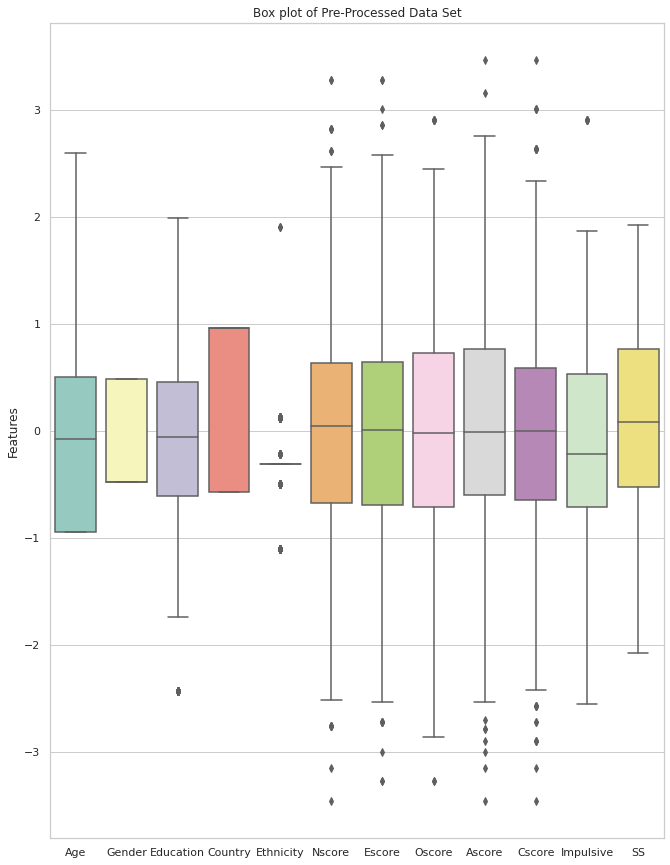

In [19]:
fig, ax = plt.subplots(figsize=(11,15))
plt.ylabel("Features")
plt.title("Box plot of Pre-Processed Data Set")
ax = sns.boxplot(data = dataset[feature_columns], orient="v", palette="Set3")
sns.reset_orig()

*5 demographic features and 7 personality traits' boxplots*  
Keep the current encoding? It seems that all the features are centered near zero properly..

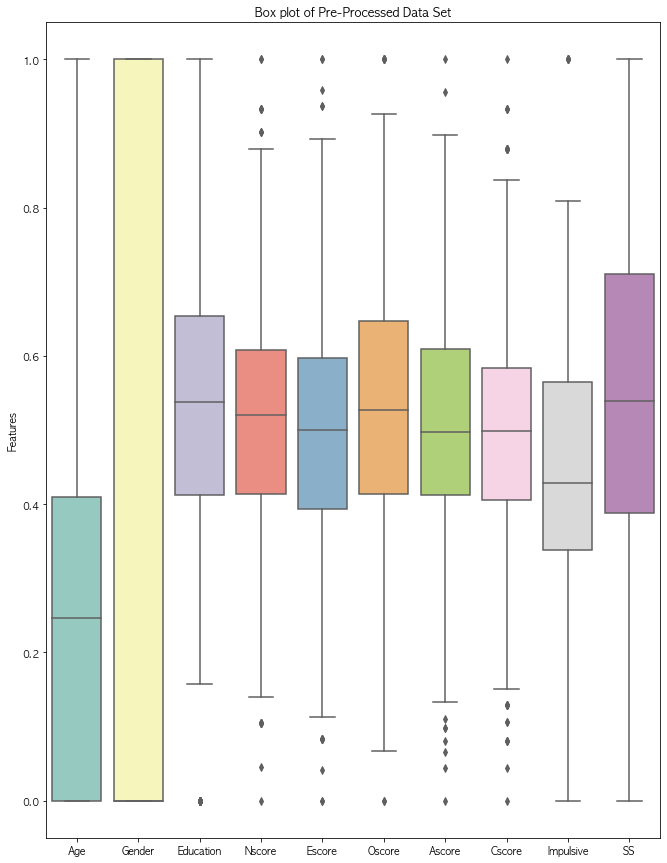
이전 minmax scaling 한 것으로 boxplot 그리면 이렇게 되는데 어떤 거로 할지 결정해야 할 듯 합니다!

## Demographic Features analysis

일단 기존 description에 있던 정보로 바꿔서 분석 진행

In [20]:
demo = dataset.copy()

In [21]:
demo

,Age,Gender,Education,Country,Ethnicity,Nscore,Escore,Oscore,Ascore,Cscore,Impulsive,SS,Alcohol,Amphet,Amyl,Benzos,Caff,Cannabis,Choc,Coke,Crack,Ecstasy,Heroin,Ketamine,Legalh,LSD,Meth,Mushrooms,Nicotine,Semer,VSA
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,0.49788,0.48246,-0.05921,0.96082,0.12600,0.31287,-0.57545,-0.58331,-0.91699,-0.00665,-0.21712,-1.18084,5,2,0,2,6,0,5,0,0,0,0,0,0,0,0,0,2,0,0
2,-0.07854,-0.48246,1.98437,0.96082,-0.31685,-0.67825,1.93886,1.43533,0.76096,-0.14277,-0.71126,-0.21575,5,2,2,0,6,4,6,3,0,4,0,2,0,2,3,0,4,0,0
3,0.49788,-0.48246,-0.05921,0.96082,-0.31685,-0.46725,0.80523,-0.84732,-1.62090,-1.01450,-1.37983,0.40148,6,0,0,0,6,3,4,0,0,0,0,0,0,0,0,1,0,0,0
4,-0.95197,0.48246,1.16365,0.96082,-0.31685,-0.14882,-0.80615,-0.01928,0.59042,0.58489,-1.37983,-1.18084,4,0,0,3,5,2,4,2,0,0,0,2,0,0,0,0,2,0,0
5,0.49788,0.48246,1.98437,0.96082,-0.31685,0.73545,-1.63340,-0.45174,-0.30172,1.30612,-0.21712,-0.21575,4,1,1,0,6,3,6,0,0,1,0,0,1,0,0,2,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1884,-0.95197,0.48246,-0.61113,-0.57009,-0.31685,-1.19430,1.74091,1.88511,0.76096,-1.13788,0.88113,1.92173,5,0,0,0,4,5,4,0,0,0,0,0,3,3,0,0,0,0,5
1885,-0.95197,-0.48246,-0.61113,-0.57009,-0.31685,-0.24649,1.74091,0.58331,0.76096,-1.51840,0.88113,0.76540,5,0,0,0,5,3,4,0,0,2,0,0,3,5,4,4,5,0,0
1886,-0.07854,0.48246,0.45468,-0.57009,-0.31685,1.13281,-1.37639,-1.27553,-1.77200,-1.38502,0.52975,-0.52593,4,6,5,5,6,6,6,4,0,4,0,2,0,2,0,2,6,0,0


In [22]:
age = ['18-24' if a == -0.95197 else 
       '25-34' if a == -0.07854 else 
       '35-44' if a == 0.49788 else  
       '45-54' if a == 1.09449 else  
       '55-64' if a == 1.82213 else  
       '65+' 
       for a in demo['Age']]



gender = ['Female' if g > 0 else 
			'Male' 
			for g in demo['Gender']]


education  = ['Left school before 16 years' if e <-2 else 
             'Left school at 16 years' if e > -2 and e < -1.5 else 
             'Left school at 17 years' if e > -1.5 and e < -1.4 else 
             'Left school at 18 years' if e > -1.4 and e < -1 else 
             'Some college or university, no certificate or degree' if e > -1 and e < -0.5 else 
             'Professional certificate/ diploma' if e > -0.5 and e < 0 else 
             'University degree' if e > 0 and e < 0.5 else 
             'Masters degree' if e > 0.5 and e < 1.5 else 
             'Doctorate degree' 
             for e in demo['Education']]


country = ['USA' if c < -0.5 else 
           'New Zealand' if c > -0.5 and c < -0.4 else 
           'Other' if c > -0.4 and c < -0.2 else 
           'Australia' if c > -0.2 and c < 0 else 
           'Ireland' if c > 0 and c < 0.23 else 
           'Canada' if c > 0.23 and c < 0.9 else 
           'UK' 
           for c in demo['Country']]


ethnicity = ['Black' if e < -1 else 
             'Asian' if e > -1 and e < -0.4 else 
             'White' if e > -0.4 and e < -0.25 else 
             'Mixed-White/Black' if e >= -0.25 and e < 0.11 else 
             'Mixed-White/Asian' if e > 0.12 and e < 1 else 
             'Mixed-Black/Asian' if e > 1.9 else 
             'Other' 
             for e in demo['Ethnicity']]


demo['Age'] = age
demo['Gender'] = gender
demo['Education'] = education
demo['Country'] = country
demo['Ethnicity'] = ethnicity

In [23]:
demo

,Age,Gender,Education,Country,Ethnicity,Nscore,Escore,Oscore,Ascore,Cscore,Impulsive,SS,Alcohol,Amphet,Amyl,Benzos,Caff,Cannabis,Choc,Coke,Crack,Ecstasy,Heroin,Ketamine,Legalh,LSD,Meth,Mushrooms,Nicotine,Semer,VSA
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,35-44,Female,Professional certificate/ diploma,UK,Mixed-White/Asian,0.31287,-0.57545,-0.58331,-0.91699,-0.00665,-0.21712,-1.18084,5,2,0,2,6,0,5,0,0,0,0,0,0,0,0,0,2,0,0
2,25-34,Male,Doctorate degree,UK,White,-0.67825,1.93886,1.43533,0.76096,-0.14277,-0.71126,-0.21575,5,2,2,0,6,4,6,3,0,4,0,2,0,2,3,0,4,0,0
3,35-44,Male,Professional certificate/ diploma,UK,White,-0.46725,0.80523,-0.84732,-1.62090,-1.01450,-1.37983,0.40148,6,0,0,0,6,3,4,0,0,0,0,0,0,0,0,1,0,0,0
4,18-24,Female,Masters degree,UK,White,-0.14882,-0.80615,-0.01928,0.59042,0.58489,-1.37983,-1.18084,4,0,0,3,5,2,4,2,0,0,0,2,0,0,0,0,2,0,0
5,35-44,Female,Doctorate degree,UK,White,0.73545,-1.63340,-0.45174,-0.30172,1.30612,-0.21712,-0.21575,4,1,1,0,6,3,6,0,0,1,0,0,1,0,0,2,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1884,18-24,Female,"Some college or university, no certificate or ...",USA,White,-1.19430,1.74091,1.88511,0.76096,-1.13788,0.88113,1.92173,5,0,0,0,4,5,4,0,0,0,0,0,3,3,0,0,0,0,5
1885,18-24,Male,"Some college or university, no certificate or ...",USA,White,-0.24649,1.74091,0.58331,0.76096,-1.51840,0.88113,0.76540,5,0,0,0,5,3,4,0,0,2,0,0,3,5,4,4,5,0,0
1886,25-34,Female,University degree,USA,White,1.13281,-1.37639,-1.27553,-1.77200,-1.38502,0.52975,-0.52593,4,6,5,5,6,6,6,4,0,4,0,2,0,2,0,2,6,0,0


In [24]:
demo[demographic_columns]

,Age,Gender,Education,Country,Ethnicity
ID,,,,,
1,35-44,Female,Professional certificate/ diploma,UK,Mixed-White/Asian
2,25-34,Male,Doctorate degree,UK,White
3,35-44,Male,Professional certificate/ diploma,UK,White
4,18-24,Female,Masters degree,UK,White
5,35-44,Female,Doctorate degree,UK,White
...,...,...,...,...,...
1884,18-24,Female,"Some college or university, no certificate or ...",USA,White
1885,18-24,Male,"Some college or university, no certificate or ...",USA,White
1886,25-34,Female,University degree,USA,White


### Proportion Analysis

Some useful functions to analyze proportion.  
It can be important to check that the data is whether imbalanced or balanced..

In [25]:
def plot_density(dataset, col, ax, plot_gaussian = True, color="Blue"):
    '''
    Extension of the seaborn histogram that plots, for a given column, an estimated normal distribution (if requested) on top of the fitted data distribution.
    '''
    ncount = len(dataset)
    
    if plot_gaussian:
        std = dataset[col].std()
        mean = dataset[col].mean()
    
    #plot histogram using seaborn
    ax = sns.histplot(dataset[col], ax=ax, color=color, kde=True, stat="probability", kde_kws={"bw_adjust":3})
    
    if plot_gaussian:
        # Limiting our gaussian to the limits from the above plot
        xmin, xmax = ax.get_xlim()
        xnorm = np.arange(xmin, xmax, 0.001)
        ynorm = norm.pdf(xnorm, mean, std)
        ax.plot(xnorm, ynorm, 'r', lw=2)
        ax.legend(["data distribution", "estimated normal distribution"], loc="upper center", bbox_to_anchor=(0.5, -0.05), fancybox=True, shadow=True, ncol=2)
    
    ax.set_title(col)
    ax.set_xlabel("")

In [26]:
def plot_pie(dataset, col, ax):  
    '''
    Pandas' pie plot wrapper
    '''
    ax = dataset[col].value_counts().plot(kind='pie', ax=ax)
    ax.set_title(col)
    ax.set_ylabel("")

In [27]:
def plot_count(dataset, col, ax, order = None, show_percent=True, rotate_label = True, add_args={"palette": "Set2"}):
    '''
    Extending the seaorn countplot to get frequencies and counts in a pretty way. 
    '''
    
    ncount = len(dataset)
    
    if order is None:
        order = np.sort(dataset[col].unique())
    
    # plot seaborn countplot
    ax = sns.countplot(data=dataset, x=col, ax=ax, order=order, **add_args)
    
    # Get y limit (number of elements)
    _ ,max_nb = ax.get_ylim()
    # Transform this limit into a frequency in [0, 100]
    freq_lim = (max_nb * 100/ ncount)
    
    # Duplicate the ax
    ax2 = ax.twinx()
    
    #Move duplicate y axis ticks to the left
    ax2.yaxis.tick_left()
    
    #Move original y axis ticks to the right
    ax.yaxis.tick_right()
    
    # Swap the label positions to match the ticks
    ax.yaxis.set_label_position('right')
    ax2.yaxis.set_label_position('left')
    ax2.set_ylabel('Frequency [%]')

    # We want to write the frequency on top of each bar
    if show_percent:
        # for every bar
        for p in ax.patches:
            x=p.get_bbox().get_points()[:,0]
            y=p.get_bbox().get_points()[1,1]
            if not math.isnan(x.mean()) and not math.isnan(y):
                # Write frequency at an x and y coordinate
                ax.text(x.mean(), y, '{:.1f}%'.format(100.*y/ncount), 
                    ha='center', va='bottom')

    # Set y axis limit for counts and frequencies
    ax2.set_ylim(0,freq_lim)
    ax.set_ylim(0,max_nb)

    # set ticks for count
    ax.yaxis.set_major_locator(ticker.LinearLocator(11))
    ax.yaxis.set_tick_params(which="major")

    # set ticks for frequencies
    ax2.yaxis.set_major_locator(ticker.MultipleLocator(freq_lim/10))
    ax2.yaxis.set_tick_params(which="major")

    # remove grid for ax 2 (keep only ax)
    ax2.grid(False)
    ax.grid(False)
    ax.set_xlabel("")
    if rotate_label:
        # rotate tick labels on the x axis / / /
        _ = ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
    ax.set_title(col)

In [28]:
def plot(kind, dataset, columns=None, fig_title="Count/Frequency plots", fontsizes = 20, **kwargs):
    '''
    Wrapper function that takes care of plot wise sizes and calling the wanted procedure
    '''
    
    # plot choices
    kind_dict = {
        'pie': plot_pie,
        'count': plot_count,
        'density': plot_density}
    
    if kind not in kind_dict:
        raise ValueError(f"{kind} is not a valid kind, has to be one of {kind_dict.keys()}")
    
    if columns is None:
        # us all dataset columns
        columns = list(dataset.columns)
    
    fig = None
    
    # Setting font sizes
    plt.rc('xtick', labelsize=fontsizes*1.5)
    plt.rc('ytick', labelsize=fontsizes*1.5)
    plt.rc('axes', labelsize=fontsizes*2)
    plt.rc('legend', fontsize=fontsizes*1.5, title_fontsize=0)
    plt.rc('axes', titlesize=2*fontsizes)
    plt.rc('font', size=1.7*fontsizes)
    
    # Scale of the figure in ax (to be used later)
    figsize_scale = fontsizes
    
    if not isinstance(columns, list):
        # columns has to be a list
        if isinstance(columns, str):
            columns = [columns]
        else:
            columns = list(columns)
    
    if len(columns) == 1: # Only variable to plot
        ncols, nrows = 1, 1
        figsize_scale *= 2 # double figsize
    else:
        ncols, nrows = 2, math.ceil(len(columns) / 2)
     
    fig, axes = plt.subplots(figsize=(figsize_scale*ncols, figsize_scale*nrows), nrows=nrows, ncols=ncols)
    
    if ncols == 1 and nrows == 1:
        # We need a list of axes
        axes = np.array([axes])
    
    # Plot
    do_plots(dataset, columns, axes, kind_dict[kind], **kwargs)
    
    fig.suptitle(fig_title + "\n\n", fontsize=fontsizes*2.5)
    plt.tight_layout()
    #Reset plot setting to original
    sns.reset_orig()
    
def do_plots(dataset, columns, axes, plot_func, **kwargs):
    '''
    Calls the plotting function on every axis and removes unused axes.
    '''
    axes = axes.flat
    
    #plot every variable
    for index, col in enumerate(columns):
        plot_func(dataset, col, axes[index], **kwargs)

    # remove empty axes
    for empty in range(len(columns), len(axes)):
        axes[empty].axis("off")

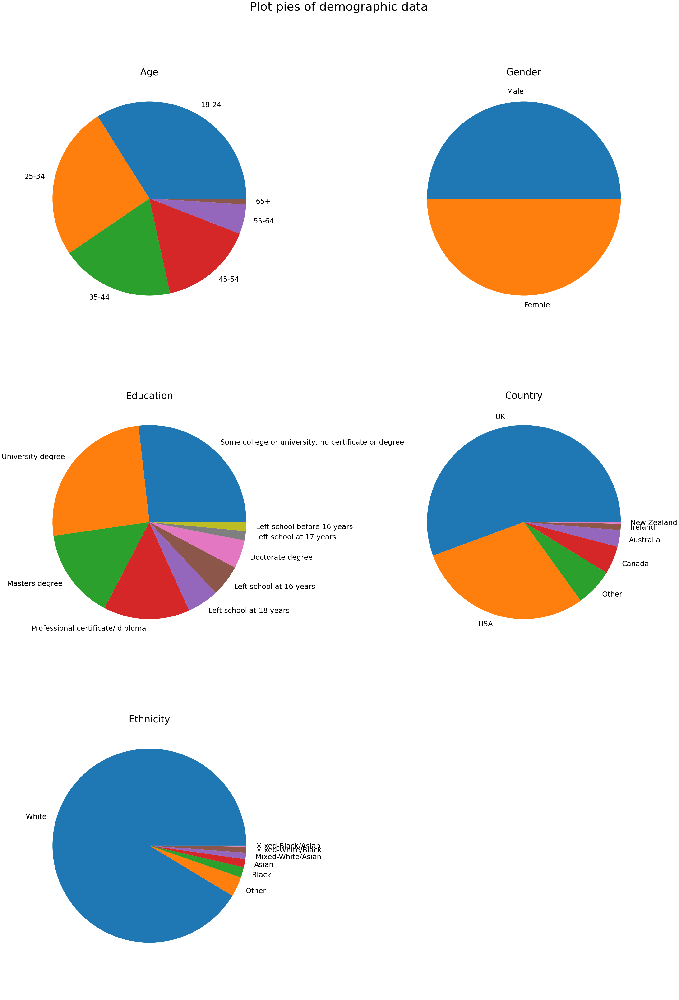

In [29]:
plot("pie", demo, demographic_columns, fig_title="Plot pies of demographic data")


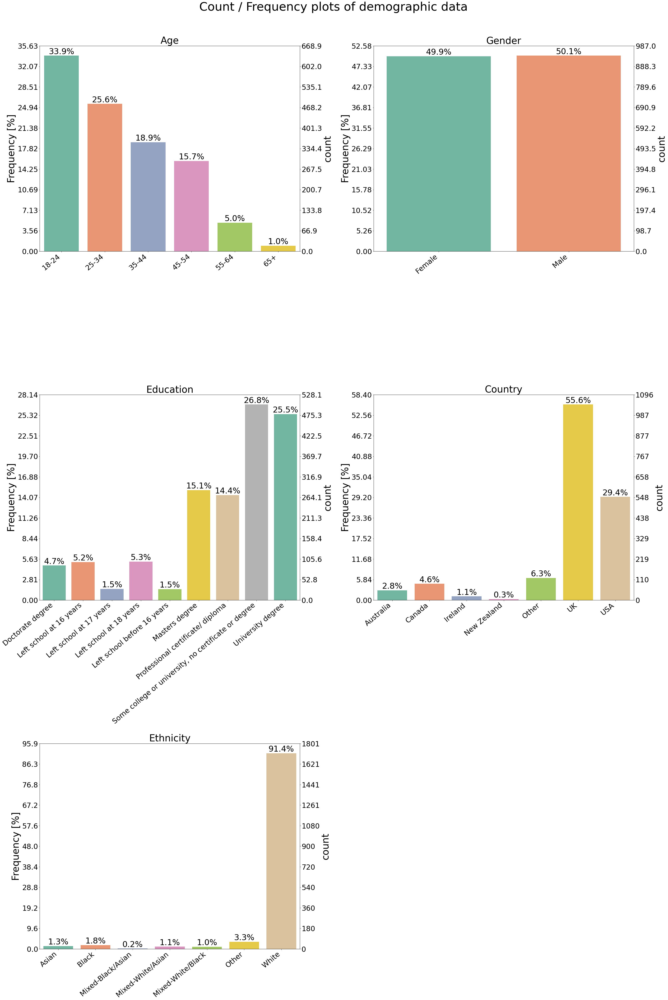

In [30]:
plot("count", demo, demographic_columns, fig_title="Count / Frequency plots of demographic data")


Education  
- certificate : 증명서, 증명;(학위 없는 과정의) 수료[이수] 증명서, 면허증 / 일정기간 교육을 수료하면 나오는 이수증

- diploma : 졸업증서, 수료증

- associate : 2년제 학위, 보통 Community College 등에서 2년을 전공하고 나면 주어지는 학위

- Bachelor : 4년제 학위, 학사

- Master : 석사

- Doctor : 박사

석사가 되게.. 높네요

#### Age

In [31]:
def value_counts_percentage(dataset, column):
    ''' value.counts() method extended by displaying percentage '''
    
    a = dataset[column].value_counts()
    b = dataset[column].value_counts(normalize=True) * 100
    
    return pd.concat([a,b.round(2)], axis=1, keys=['N', '%'])

In [32]:
value_counts_percentage(demo, 'Age')


,N,%
18-24,637,33.94
25-34,480,25.57
35-44,355,18.91
45-54,294,15.66
55-64,93,4.95
65+,18,0.96


18-24 Group represents about 1/3 of the whole data.  
We can say that this Feature is imbalnced and not representative

#### Gender

In [33]:
value_counts_percentage(demo, 'Gender')

,N,%
Male,940,50.08
Female,937,49.92


Highly balanced and representative

#### Education

In [34]:
value_counts_percentage(demo, 'Education')

,N,%
"Some college or university, no certificate or degree",503,26.80
University degree,478,25.47
Masters degree,283,15.08
Professional certificate/ diploma,270,14.38
Left school at 18 years,99,5.27
Left school at 16 years,98,5.22
Doctorate degree,89,4.74
Left school at 17 years,29,1.55
Left school before 16 years,28,1.49


85% 정도가 college 이상 level  
UK나 미국의 전체 인구를 대변한다고 볼 수 있나?
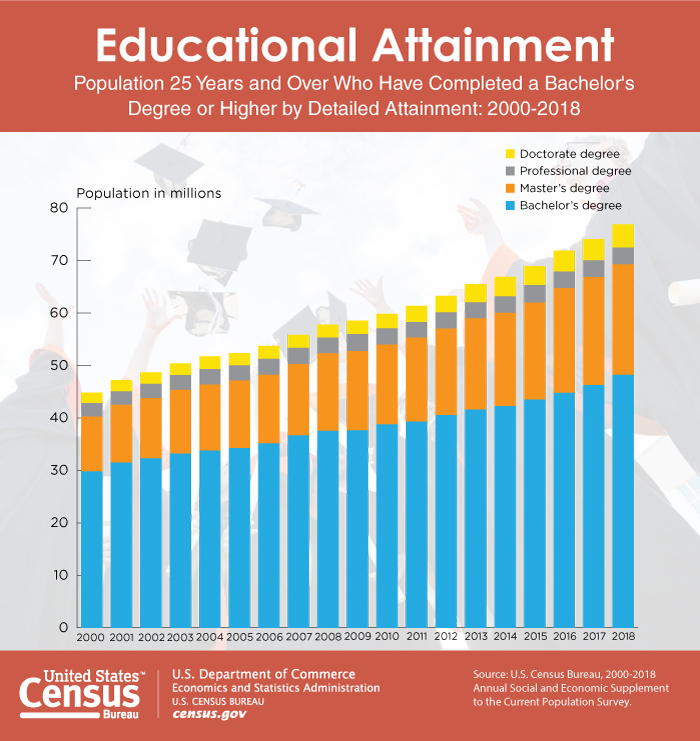
꽤나 비슷한듯..!!(85%)

#### Country

In [35]:
value_counts_percentage(demo, 'Country')

,N,%
UK,1044,55.62
USA,551,29.36
Other,118,6.29
Canada,87,4.64
Australia,52,2.77
Ireland,20,1.07
New Zealand,5,0.27


영어권 국가들이 80% 이상! -> 동양권 문화는 약간 다를 수도 있을 것 같다.

#### Ethnicity

In [36]:
value_counts_percentage(demo, 'Ethnicity')

,N,%
White,1715,91.37
Other,62,3.30
Black,33,1.76
Asian,25,1.33
Mixed-White/Asian,20,1.07
Mixed-White/Black,19,1.01
Mixed-Black/Asian,3,0.16


Highly unbalanced feature. 

#### Age-Gender

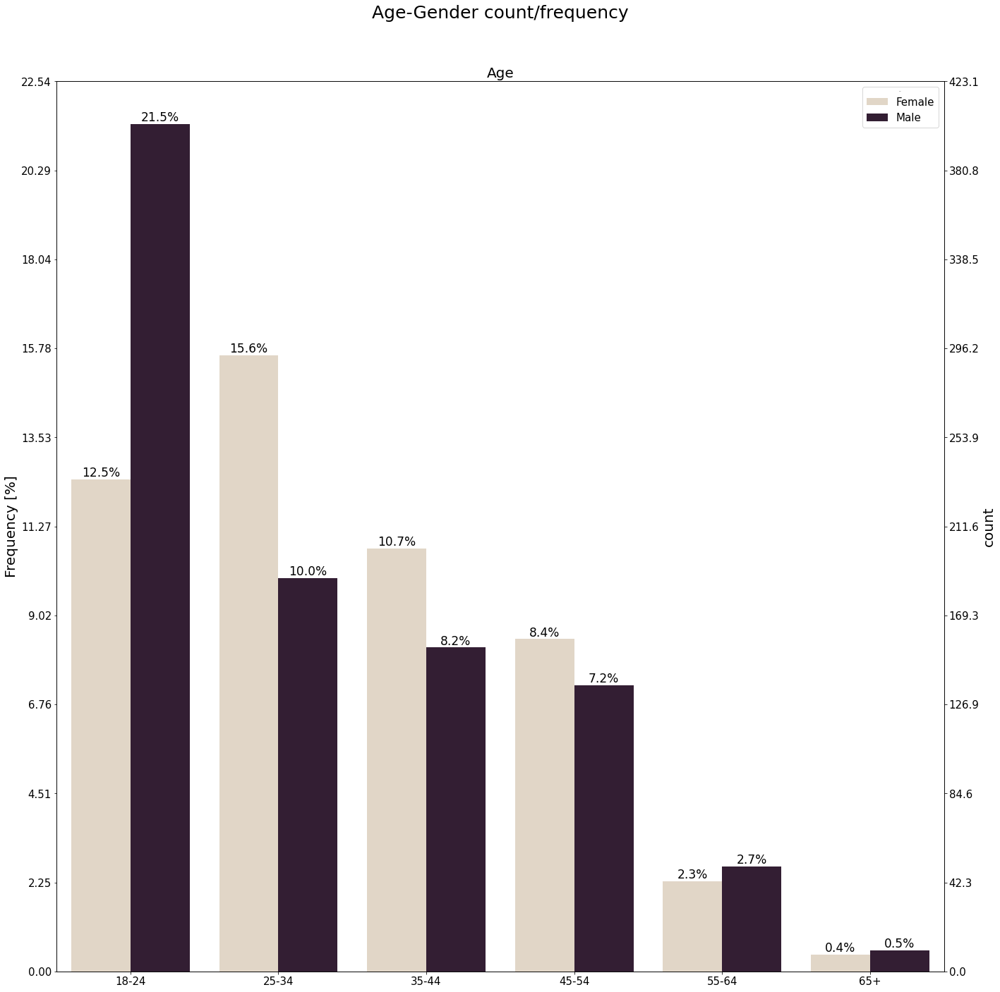

In [37]:
plot("count", demo, 'Age', fig_title="Age-Gender count/frequency", rotate_label=False, add_args={"hue":"Gender", "palette":'ch:.25'}, fontsizes=10);

남성의 경우 18-24 에 몰려있다.  
여성의 경우는 25-34 에 몰려있다.  
전체적으로 나이와 반비례하게 샘플이 줄어든다.

#### Country-Gender

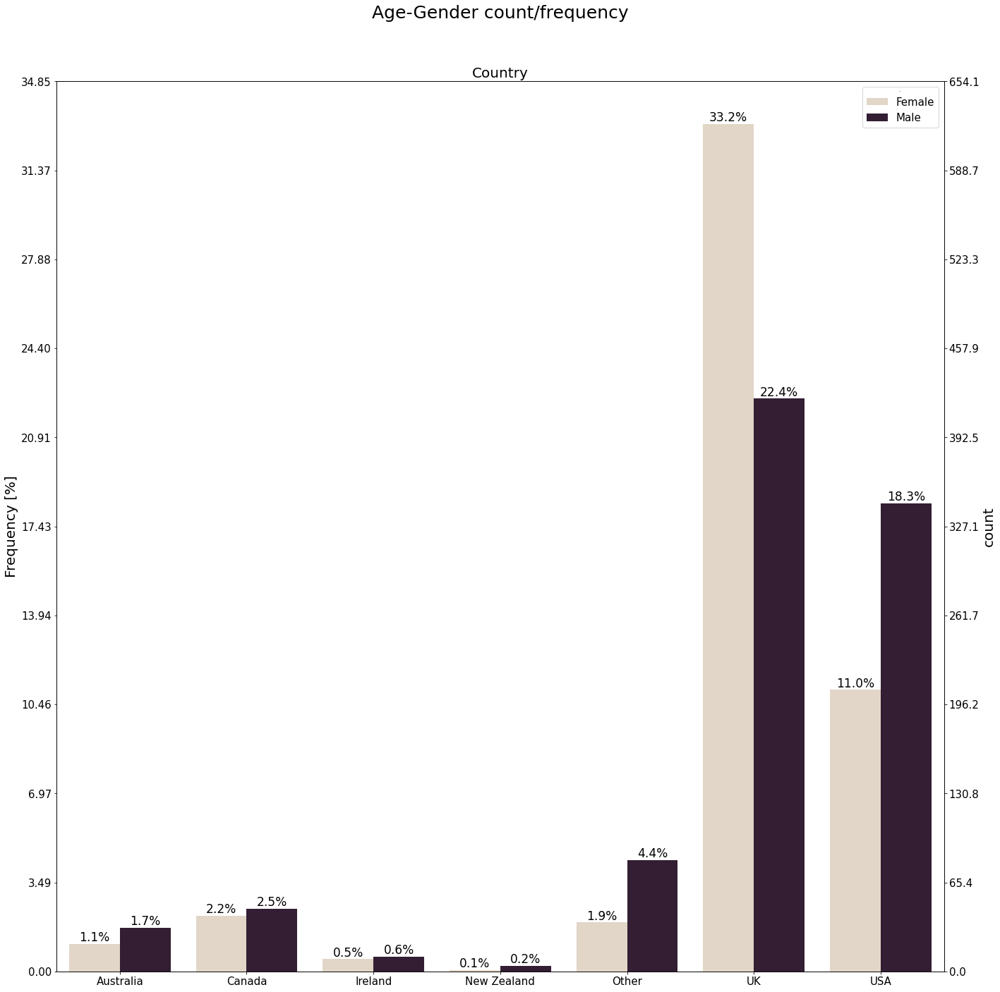

In [38]:
plot("count", demo, 'Country', fig_title="Age-Gender count/frequency", rotate_label=False, add_args={"hue":"Gender", "palette":'ch:.25'}, fontsizes=10);

UK : 여성이 더 많음  
USA : 남성이 더 많음

#### Age – Gender – Country cross table

In [39]:
pd.crosstab(demo['Age'], [demo['Gender'], demo['Country']])

Gender     Female                                                Male         \
Country Australia Canada Ireland New Zealand Other   UK USA Australia Canada   
Age                                                                            
18-24           1      7       3           0    12  112  99        20     25   
25-34          10      9       2           1    13  200  58         5      8   
35-44           4      8       3           0     7  150  29         3      7   
45-54           5      7       1           0     4  127  14         3      4   
55-64           0      7       0           0     0   29   7         1      1   
65+             0      3       0           0     0    5   0         0      1   

Gender                                       
Country Ireland New Zealand Other   UK  USA  
Age                                          
18-24         5           2    39   91  221  
25-34         3           2    26   80   63  
35-44         0           0    10  108   26  
45-54         3           0     5   99   22  
55-64         0           0     2   36   10  
65+           0           0     0    7    2

In [40]:
def catplot(data, x, hue, col, rotate_label=True, palette="ch:.25"):
    plot = sns.catplot(x=x, hue=hue, col=col, palette=palette, data=data.sort_values(by=[x]), kind="count")

    if rotate_label:
        for axes in plot.axes.flat:
            _ = axes.set_xticklabels(axes.get_xticklabels(), rotation=40, ha="right")

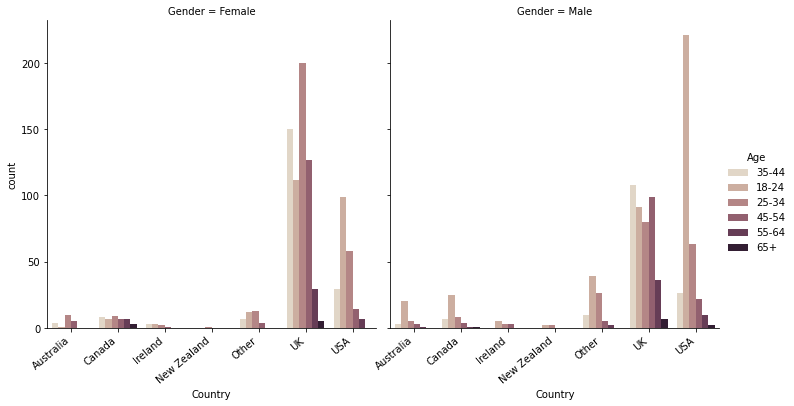

In [41]:
catplot(demo, 'Country', 'Age', 'Gender')


#### Education – Gender – Ethnicity cross table

In [42]:
demo.pivot_table(index='Education', columns=['Gender', 'Ethnicity'], aggfunc='size', fill_value=0)


Gender                                             Female        \
Ethnicity                                           Asian Black   
Education                                                         
Doctorate degree                                        1     0   
Left school at 16 years                                 0     0   
Left school at 17 years                                 0     0   
Left school at 18 years                                 0     0   
Left school before 16 years                             0     0   
Masters degree                                          4     6   
Professional certificate/ diploma                       0     3   
Some college or university, no certificate or d...      3     2   
University degree                                       7     6   

Gender                                                                \
Ethnicity                                          Mixed-Black/Asian   
Education                                                              
Doctorate degree                                                   0   
Left school at 16 years                                            0   
Left school at 17 years                                            0   
Left school at 18 years                                            0   
Left school before 16 years                                        0   
Masters degree                                                     0   
Professional certificate/ diploma                                  0   
Some college or university, no certificate or d...                 1   
University degree                                                  1   

Gender                                                                \
Ethnicity                                          Mixed-White/Asian   
Education                                                              
Doctorate degree                                                   1   
Left school at 16 years                                            0   
Left school at 17 years                                            0   
Left school at 18 years                                            0   
Left school before 16 years                                        0   
Masters degree                                                     3   
Professional certificate/ diploma                                  1   
Some college or university, no certificate or d...                 2   
University degree                                                  4   

Gender                                                                      \
Ethnicity                                          Mixed-White/Black Other   
Education                                                                    
Doctorate degree                                                   2     1   
Left school at 16 years                                            0     2   
Left school at 17 years                                            1     0   
Left school at 18 years                                            0     2   
Left school before 16 years                                        0     0   
Masters degree                                                     5     5   
Professional certificate/ diploma                                  0     2   
Some college or university, no certificate or d...                 1     8   
University degree                                                  2     8   

Gender                                                    Male        \
Ethnicity                                          White Asian Black   
Education                                                              
Doctorate degree                                      52     1     0   
Left school at 16 years                               40     0     0   
Left school at 17 years                               12     0     0   
Left school at 18 years                               35     0     1   
Left school before 16 ye

In [43]:
pd.concat([value_counts_percentage(demo[(demo['Ethnicity'] == 'White') & (demo['Gender'] == 'Male')], 'Education'),
           value_counts_percentage(demo[(demo['Ethnicity'] == 'White') & (demo['Gender'] == 'Female')], 'Education')],
           axis = 1, keys=['Male', 'Female'])

Male        Female       
                                                      N      %      N      %
Some college or university, no certificate or d...  309  35.85    153  17.94
University degree                                   171  19.84    263  30.83
Professional certificate/ diploma                   120  13.92    130  15.24
Masters degree                                       93  10.79    156  18.29
Left school at 18 years                              56   6.50     35   4.10
Left school at 16 years                              54   6.26     40   4.69
Doctorate degree                                     29   3.36     52   6.10
Left school before 16 years                          16   1.86     12   1.41
Left school at 17 years                              14   1.62     12   1.41

박사 ; 여자가 2배  
석사 ; 여자가 2배 가까움  
some college ; 남자가 2배  

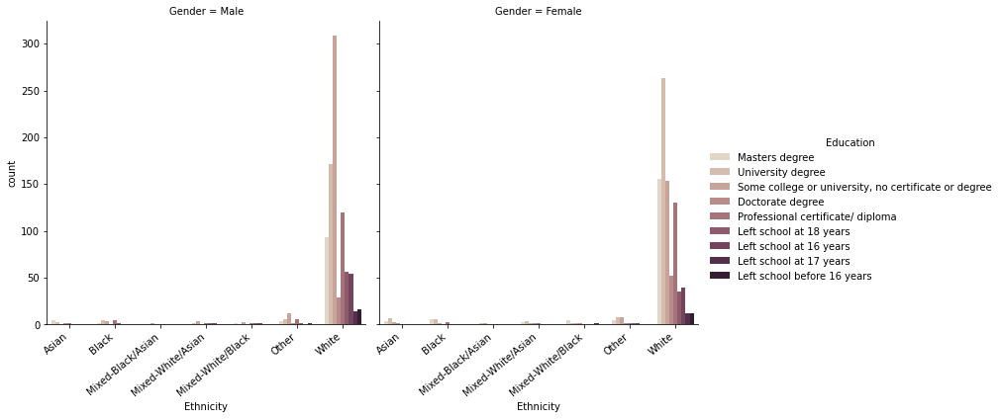

In [44]:
catplot(demo, 'Ethnicity', 'Education', 'Gender')


#### Country – Gender – Ethnicity cross table

In [45]:
pd.crosstab(demo['Country'], [demo['Gender'], demo['Ethnicity']])


Gender      Female                                            \
Ethnicity    Asian Black Mixed-Black/Asian Mixed-White/Asian   
Country                                                        
Australia        0     0                 0                 0   
Canada           0     0                 0                 2   
Ireland          0     0                 0                 0   
New Zealand      0     0                 0                 0   
Other            1     1                 0                 0   
UK              11    14                 0                 6   
USA              3     2                 2                 3   

Gender                                     Male                          \
Ethnicity   Mixed-White/Black Other White Asian Black Mixed-Black/Asian   
Country                                                                   
Australia                   0     0    20     0     0                 0   
Canada                      0     1    38     0     0                 0   
Ireland                     0     0     9     0     0                 0   
New Zealand                 0     0     1     0     0                 0   
Other                       2     2    30     1     0                 1   
UK                          9    12   571     9    11                 0   
USA                         0    13   184     0     5                 0   

Gender                                                       
Ethnicity   Mixed-White/Asian Mixed-White/Black Other White  
Country                                                      
Australia                   0                 0     0    32  
Canada                      0                 2     2    42  
Ireland                     0                 0     0    11  
New Zealand                 0                 0     0     4  
Other                       0                 1     5    74  
UK                          2                 1     4   394  
USA                         7                 4    23   305

### Correlations
Cramer's V ; measure of association between two **nominal** variables

In [46]:
def get_pval_code(pval):
    '''
    Returns a significance code string for a given p-value.
    '''
    code = ''
    if pval < 0.001:
        code = '***'
    elif pval < 0.01:
        code = '**'
    elif pval < 0.05:
        code = '*'
    elif pval < 0.1:
        code = '.'
    return code

def display_pval_codes():
    print("Significance codes: 0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1")

In [47]:
def cramers_v(crosstab):
    ''' Returns Cramer's V correlation coefficient (and statistic significance) for data 
        delivered as a crosstable. Used for nominal data.
    '''
    
    chi2 = chi2_contingency(crosstab)[0]
    n = crosstab.sum().sum()
    phi2 = chi2/n
    r,k = crosstab.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))    
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    
    return round(np.sqrt(phi2corr / min((kcorr-1), (rcorr-1))), 3), chi2_contingency(crosstab)[1]

In [48]:
def nominal_corrs(dataset, col_1_names, col_2_names, pvalues=True):
    ''' Returns Cramer's V coefficients matrix and p-value (obtained with Chi-square test of independence) matrix for the whole dataset.
    
    col_1_names, col_2_names - lists of names of columns to correlate. Function creates crosstables for every 
        columns' combination and returns a matrix with single Cramer's V coefficients of every combination;
    pvalues - if set to False, only correlation values will be returned in DataFrame 
        (without '**' marks for significant observations)
    '''
    
    corr_table = pd.DataFrame()
    pval_table = pd.DataFrame()
    for i in range(len(col_1_names)):
        for j in range(len(col_2_names)):
            crosstab = pd.crosstab(dataset[col_1_names[i]], [dataset[col_2_names[j]]])
            corr, pval = cramers_v(crosstab)
            
            v = ' '.join([str(i) for i in (corr, get_pval_code(pval))]) if pvalues else corr
            
            corr_table.loc[i, j] = v
            pval_table.loc[i,j] = pval
    corr_table.index = col_1_names
    corr_table.columns = col_2_names
    pval_table.index = col_1_names
    pval_table.columns = col_2_names
    
    return corr_table, pval_table

In [49]:
def heatmap_corr(dataset, method='spearman', ready=False, mask=True, nominal=False):
    ''' Extended sns.heatmap() method. 
    
    dataset - can be 'pure' data (without calculated correlations) or a DataFrame with already calcuateg 
        correlations (in that case attribute 'ready' should be set to True);
    method - mainly pearson or spearman; nominal correlations should be calculated externally 
        and be delivered with attribute ready=True; 
    mask - if dataset is NOT a cross-valued DataFrame of one type, mask should be set to False;
    nominal - for nominal data correlations values are in range (0, 1) instead of (-1, -1). 
        nominal=True should be folowed by ready=True 
    '''
    
    if not ready:
        corr = dataset.corr(method=method)
    elif ready:
        corr = dataset
    cmap = sns.diverging_palette(220, 10, as_cmap=True)
    vmax = corr.max().max()
    if nominal:
        center = 0.5
        cmap=None
    elif not nominal:
        center = 0
    if mask:
        mask = np.zeros_like(corr, dtype=np.bool)
        mask[np.triu_indices_from(mask)] = True
        np.fill_diagonal(corr.values, -2)
        vmax = corr.max().max()
    elif not mask:
        mask=None
    f, ax = plt.subplots(figsize=(20,9))
    return sns.heatmap(corr, cmap=cmap, mask=mask, vmax=vmax, center=center, annot=True, square=True, 
                       linewidths=0.5, cbar_kws={'shrink': 0.5})

In [50]:
corr_table_demo, pval_table_demo = nominal_corrs(demo, demographic_columns, demographic_columns)
display_pval_codes()
corr_table_demo

Significance codes: 0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1


,Age,Gender,Education,Country,Ethnicity
Age,1.0 ***,0.196 ***,0.229 ***,0.173 ***,0.014
Gender,0.196 ***,0.999 ***,0.235 ***,0.219 ***,0.0
Education,0.229 ***,0.235 ***,1.0 ***,0.2 ***,0.0
Country,0.173 ***,0.219 ***,0.2 ***,1.0 ***,0.053 **
Ethnicity,0.014,0.0,0.0,0.053 **,1.0 ***


*가 하나 이상 있으면 유의한 변수
Ethnicity 의 약한 통계적 유의성.. <- Highly Imbalanced(White) Feature?

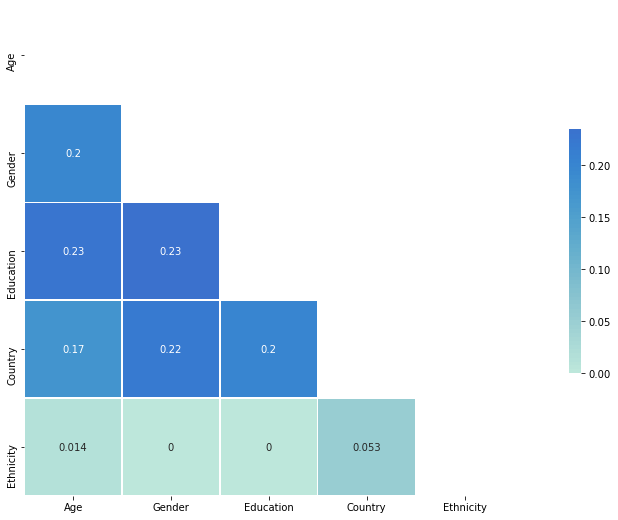

In [51]:
heatmap_corr(nominal_corrs(demo, demographic_columns, demographic_columns, pvalues=False)[0],
             nominal=True, ready=True);

약한 상관관계만 존재하는 것 같음

*약상관관계 해석*
USA와 UK 가 Female 응답자 수가 확연하게 차이가 났음  
-> weak correlation between country and gender  

imbalanced data in young age groups for gender  
-> weak correlation between age and gender  

이 데이터에는 선진국의 데이터만 존재, 전세계로 확대해석하면 안 될 듯함.

age & education ; 당연
Gender & education ; 위에서 봤듯 여성이랑 남성이 각각 education 분포가 약간 달랐음


## Personality Features Analysis

In [52]:
demo[personality_columns]

,Nscore,Escore,Oscore,Ascore,Cscore,Impulsive,SS
ID,,,,,,,
1,0.31287,-0.57545,-0.58331,-0.91699,-0.00665,-0.21712,-1.18084
2,-0.67825,1.93886,1.43533,0.76096,-0.14277,-0.71126,-0.21575
3,-0.46725,0.80523,-0.84732,-1.62090,-1.01450,-1.37983,0.40148
4,-0.14882,-0.80615,-0.01928,0.59042,0.58489,-1.37983,-1.18084
5,0.73545,-1.63340,-0.45174,-0.30172,1.30612,-0.21712,-0.21575
...,...,...,...,...,...,...,...
1884,-1.19430,1.74091,1.88511,0.76096,-1.13788,0.88113,1.92173
1885,-0.24649,1.74091,0.58331,0.76096,-1.51840,0.88113,0.76540
1886,1.13281,-1.37639,-1.27553,-1.77200,-1.38502,0.52975,-0.52593


Real range of Big 5 traits  
- Neuroticism: 12-60
- Extraversion: 16-59
- Openness to experience: 24-60
- Agreeableness: 12-60
- Conscientiousness: 17-59

적당히 scaling 되어 있는 듯함

In [53]:
pers_data = dataset[personality_columns]
pers_data.describe()

,Nscore,Escore,Oscore,Ascore,Cscore,Impulsive,SS
count,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000
mean,-0.000551,-0.001951,-0.003224,-0.000657,-0.000394,0.005293,-0.007408
std,0.998442,0.997418,0.995691,0.996689,0.997657,0.954148,0.962074
min,-3.464360,-3.273930,-3.273930,-3.464360,-3.464360,-2.555240,-2.078480
25%,-0.678250,-0.695090,-0.717270,-0.606330,-0.652530,-0.711260,-0.525930
50%,0.042570,0.003320,-0.019280,-0.017290,-0.006650,-0.217120,0.079870
75%,0.629670,0.637790,0.723300,0.760960,0.584890,0.529750,0.765400
max,3.273930,3.273930,2.901610,3.464360,3.464360,2.901610,1.921730


### Check proportions

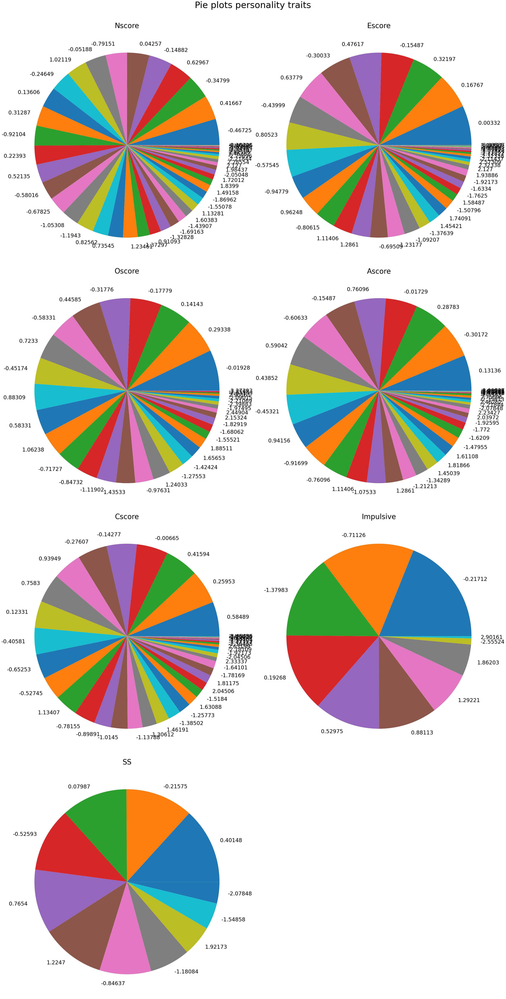

In [54]:
plot("pie", pers_data, personality_columns, fig_title="Pie plots personality traits")

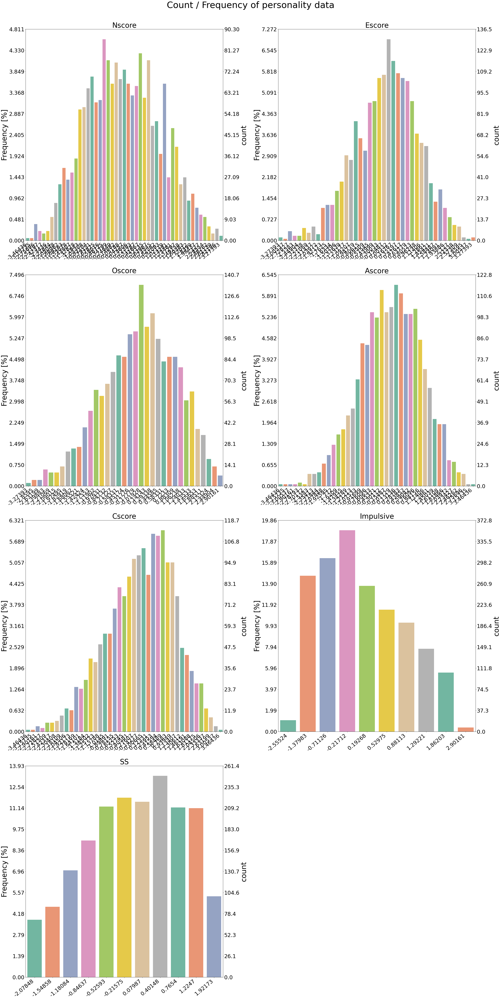

In [55]:
plot("count", pers_data, personality_columns, show_percent=False, fig_title="Count / Frequency of personality data")


Doesn't seem to have huge unbalnce


### Is density normal?

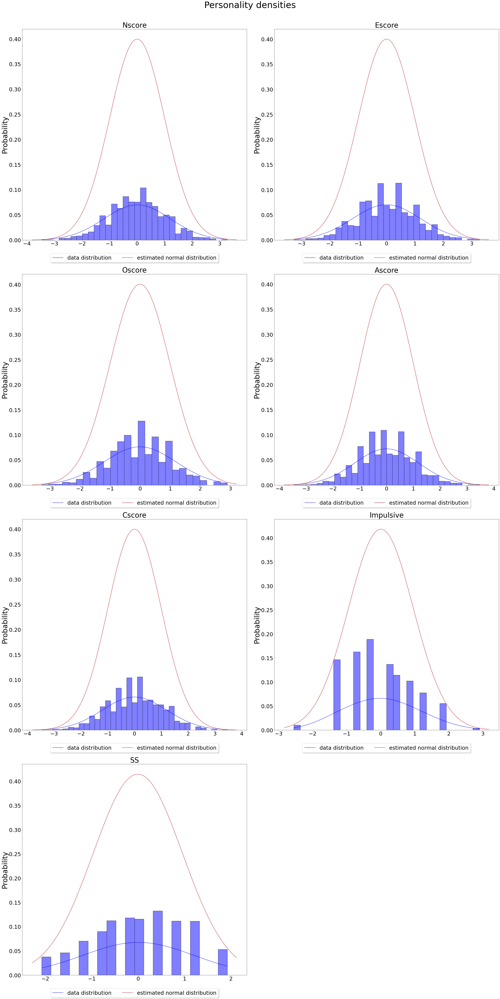

In [56]:
plot("density", pers_data, personality_columns, fig_title="Personality densities")


꽤나 종모양을 하고 있다.  
정규분포로 보기는 살짝 애매?

In [57]:
def normal_test(dataset, columns = None, alpha = 0.05):
    if columns is None:
        columns = dataset.columns
    res = pd.DataFrame()
    data = dataset[columns]
    stats, pvals = data.apply(shapiro).values
    return pd.DataFrame(data=[("Not rejected" if pval > alpha else "Rejected") + f" with alpha = {alpha}"  for pval in pvals], columns=["H0: is from normal distribution"], index=columns)

In [58]:
normal_test(pers_data)


,H0: is from normal distribution
Nscore,Not rejected with alpha = 0.05
Escore,Rejected with alpha = 0.05
Oscore,Rejected with alpha = 0.05
Ascore,Rejected with alpha = 0.05
Cscore,Rejected with alpha = 0.05
Impulsive,Rejected with alpha = 0.05
SS,Rejected with alpha = 0.05


Nscore(신경증)만 alpha=0.05에서 기각 불가.

### Correlations

In [59]:
def calculate_r(df1, df2, method='spearman', pvalues=True):
    ''' Returns correlation matrix extended by statistical significance index. Used for non-nominal data.
    
    df1, df2 - DataFrames of data to correlate;
    method - mainly pearson and spearman;
    pvalues - if set to False, only correlation values will be returned in DataFrame 
        (without '**' marks for significant observations)
    '''
    float_precision = 3
    
    data_corr_table = pd.DataFrame()
    data_pvalues = pd.DataFrame()
    for x in df1.columns:
        for y in df2.columns:
            if method == 'pearson':
                corr = pearsonr(df1[x], df2[y])
            elif method == 'spearman':
                corr = spearmanr(df1[x], df2[y])
            else:
                raise ValueError('Unknown method')
            if pvalues:
                data_corr_table.loc[x,y] = '{} {}'.format(round(corr[0], float_precision), get_pval_code(corr[1]))
            elif not pvalues:
                data_corr_table.loc[x,y] = round(corr[0], float_precision)
            data_pvalues.loc[x,y] = corr[1]
    
    return data_corr_table, data_pvalues

In [60]:
def get_ranked_corr(correlations, pvalues, pval_threshold=0.05, corr_threshold=0.5, name_transform=lambda x: x, against_itself=True, comp_corr = operator.ge, comp_pval = operator.le):
    ''' Returns the sorted top (wanted) correlations as a Dataframe
    
    correlations - the correlations dataframe.
    pvalues - The pvalues of H0: the correlation is unsignificant.
    pval_threshold - alpha to compare to pvalue
    corr_threshold - Threadshold of correlations to consider (upper or lower depending on comp_corr)
    name_transform - transform the column names before writing index.
    against_itself - True if columns and rows are the same data (if symmetric matrix)
    comp_corr - comparator to compare to the corr_threshold (default operator.ge means we want correlations >=)
    comp_pval - comparator to compare the pvalue (default operator.le meaning we want pvalues <=)
    '''
    
    columns = correlations.columns
    rows = correlations.index
    pairs=[]
    for i, row in enumerate(rows):
        for j, col in enumerate(columns[i+1:], start=i+1) if against_itself else enumerate(columns):
            corr = correlations.iloc[i, j]
            if comp_pval(pvalues.iloc[i,j], pval_threshold) and comp_corr(abs(corr), corr_threshold):
                pairs.append((name_transform(row), name_transform(col), corr))
    list.sort(pairs, key=lambda x: abs(x[2]), reverse=True)
    return pd.Series(data=[x[2] for x in pairs], index=[' / '.join((x[0], x[1])) for x in pairs], name="Correlation", dtype=np.float64).to_frame()

In [61]:
pers_data_corr_table, pers_data_pvalues = calculate_r(pers_data, pers_data, method='spearman')
pers_data_corr_table

,Nscore,Escore,Oscore,Ascore,Cscore,Impulsive,SS
Nscore,1.0 ***,-0.417 ***,0.015,-0.206 ***,-0.378 ***,0.168 ***,0.09 ***
Escore,-0.417 ***,1.0 ***,0.226 ***,0.162 ***,0.29 ***,0.119 ***,0.19 ***
Oscore,0.015,0.226 ***,1.0 ***,0.037,-0.073 **,0.27 ***,0.405 ***
Ascore,-0.206 ***,0.162 ***,0.037,1.0 ***,0.237 ***,-0.226 ***,-0.208 ***
Cscore,-0.378 ***,0.29 ***,-0.073 **,0.237 ***,1.0 ***,-0.344 ***,-0.254 ***
Impulsive,0.168 ***,0.119 ***,0.27 ***,-0.226 ***,-0.344 ***,1.0 ***,0.628 ***
SS,0.09 ***,0.19 ***,0.405 ***,-0.208 ***,-0.254 ***,0.628 ***,1.0 ***


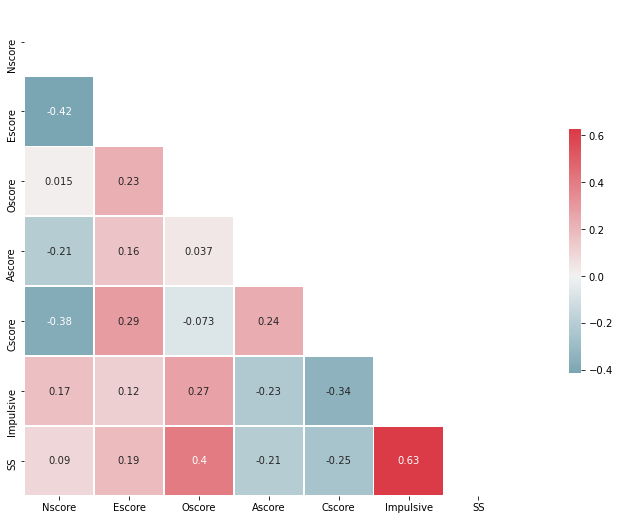

In [62]:
heatmap_corr(pers_data, method='spearman');


신경증 ; 음의 상관관계가 살짝 있는 듯함  
외향성 ; 있으면 성실성과 살짝 ?  
SS와 Impulsive가 양의 상관관계로 0.63..  
감각적인 성격과 충동성의 연관..? 감성적이라 그런가

In [63]:
pers_data_corr_table_nopval, _ = calculate_r(pers_data, pers_data, method='spearman', pvalues=False)
get_ranked_corr(pers_data_corr_table_nopval, pers_data_pvalues, corr_threshold=0.15)


,Correlation
Impulsive / SS,0.628
Nscore / Escore,-0.417
Oscore / SS,0.405
Nscore / Cscore,-0.378
Cscore / Impulsive,-0.344
Escore / Cscore,0.290
Oscore / Impulsive,0.270
Cscore / SS,-0.254
Ascore / Cscore,0.237
Escore / Oscore,0.226


상관계수 0.15 이상인 것만

## Drug consumption Analysis

0 - Never Used

1 - Used over a Decade Ago

2 - Used in the Last Decade

3 - Used in the Last Year

4 - Used in the Last Month

5 - Used in the Last Week

6 - Used in the Last Day



### Check data

In [64]:
drug_data = dataset[drugs_columns]
drug_data.describe()

,Alcohol,Amphet,Amyl,Benzos,Caff,Cannabis,Choc,Coke,Crack,Ecstasy,Heroin,Ketamine,Legalh,LSD,Meth,Mushrooms,Nicotine,VSA
count,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000,1877.000000
mean,4.637720,1.337773,0.606819,1.461907,5.484283,2.980288,5.109750,1.156633,0.295685,1.309536,0.372403,0.564198,1.353223,1.053277,0.826319,1.177944,3.194992,0.429409
std,1.328234,1.782384,1.064005,1.869193,1.115119,2.286778,1.085716,1.510791,0.835925,1.647373,1.034761,1.216341,1.790881,1.484582,1.648379,1.459212,2.415814,0.959160
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.000000,0.000000,0.000000,0.000000,5.000000,1.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
50%,5.000000,0.000000,0.000000,0.000000,6.000000,3.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,0.000000
75%,6.000000,2.000000,1.000000,3.000000,6.000000,5.000000,6.000000,2.000000,0.000000,3.000000,0.000000,0.000000,3.000000,2.000000,0.000000,2.000000,6.000000,0.000000
max,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000,6.000000


In [65]:
counts = []
proportions = []
for drug in drugs_columns:
    counts.append(drug_data[drug].value_counts())
    proportions.append(drug_data[drug].value_counts(normalize=True))

drug_table_count = pd.concat(counts, axis=1, 
          keys=drugs_columns, sort=True)
drug_table_prop = (pd.concat(proportions, axis=1, 
          keys=drugs_columns, sort=True) * 100).round(2)
drug_table = pd.concat([drug_table_count.T, drug_table_prop.T], keys=['N', '%'], axis=1)

drug_table

N                                     %                       \
              0    1    2    3    4    5     6      0      1      2      3   
Alcohol      33   34   68  197  284  758   503   1.76   1.81   3.62  10.50   
Amphet      973  230  241  196   75   61   101  51.84  12.25  12.84  10.44   
Amyl       1299  210  236   91   24   14     3  69.21  11.19  12.57   4.85   
Benzos      999  116  230  234  119   84    95  53.22   6.18  12.25  12.47   
Caff         27   10   24   59  106  271  1380   1.44   0.53   1.28   3.14   
Cannabis    413  207  266  210  138  185   458  22.00  11.03  14.17  11.19   
Choc         32    2   10   53  295  680   805   1.70   0.11   0.53   2.82   
Coke       1036  160  267  257   98   40    19  55.19   8.52  14.22  13.69   
Crack      1622   67  109   59    9    9     2  86.41   3.57   5.81   3.14   
Ecstasy    1020  112  232  275  154   63    21  54.34   5.97  12.36  14.65   
Heroin     1600   68   91   65   24   16    13  85.24   3.62   4.85   3.46   
Ketamine   1488   43  140  129   40   33     4  79.28   2.29   7.46   6.87   
Legalh     1092   29  195  321  109   64    67  58.18   1.55  10.39  17.10   
LSD        1069  257  175  213   96   55    12  56.95  13.69   9.32  11.35   
Meth       1424   39   95  148   50   48    73  75.87   2.08   5.06   7.88   
Mushrooms   982  208  259  272  114   39     3  52.32  11.08  13.80  14.49   
Nicotine    428  193  203  184  106  156   607  22.80  10.28  10.82   9.80   
VSA        1452  199  133   59   13   14     7  77.36  10.60   7.09   3.14   

                                
               4      5      6  
Alcohol    15.13  40.38  26.80  
Amphet      4.00   3.25   5.38  
Amyl        1.28   0.75   0.16  
Benzos      6.34   4.48   5.06  
Caff        5.65  14.44  73.52  
Cannabis    7.35   9.86  24.40  
Choc       15.72  36.23  42.89  
Coke        5.22   2.13   1.01  
Crack       0.48   0.48   0.11  
Ecstasy     8.20   3.36   1.12  
Heroin      1.28   0.85   0.69  
Ketamine    2.13   1.76   0.21  
Legalh      5.81   3.41   3.57  
LSD         5.11   2.93   0.64  
Meth        2.66   2.56   3.89  
Mushrooms   6.07   2.08   0.16  
Nicotine    5.65   8.31  32.34  
VSA         0.69   0.75   0.37

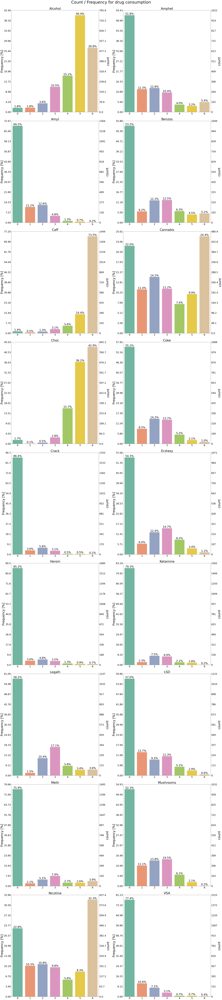

In [66]:
plot("count", drug_data, fig_title="Count / Frequency for drug consumption\n\n", rotate_label=False)


Alcohol, caffeine, chocolate ; legal stimulants  
-> consumed regularly  

Cannabis, Nicotine -> 극단값이 많음(중독성?)  

다른 약물들은 안해봄이 대부분

### Correlations

In [67]:
drug_data_corr_table, drug_data_pvalues = calculate_r(drug_data, drug_data, method='spearman')
display_pval_codes()
drug_data_corr_table

Significance codes: 0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1


,Alcohol,Amphet,Amyl,Benzos,Caff,Cannabis,Choc,Coke,Crack,Ecstasy,Heroin,Ketamine,Legalh,LSD,Meth,Mushrooms,Nicotine,VSA
Alcohol,1.0 ***,-0.019,0.076 **,-0.03,0.103 ***,0.003,0.01,0.054 *,-0.056 *,0.039 .,-0.054 *,0.048 *,0.01,-0.017,-0.08 ***,-0.0,0.043 .,-0.002
Amphet,-0.019,1.0 ***,0.365 ***,0.505 ***,0.022,0.504 ***,-0.093 ***,0.606 ***,0.338 ***,0.579 ***,0.382 ***,0.402 ***,0.481 ***,0.499 ***,0.422 ***,0.484 ***,0.395 ***,0.327 ***
Amyl,0.076 **,0.365 ***,1.0 ***,0.219 ***,0.061 **,0.217 ***,0.005,0.395 ***,0.178 ***,0.359 ***,0.169 ***,0.344 ***,0.216 ***,0.208 ***,0.078 ***,0.236 ***,0.228 ***,0.188 ***
Benzos,-0.03,0.505 ***,0.219 ***,1.0 ***,0.052 *,0.37 ***,-0.053 *,0.467 ***,0.372 ***,0.373 ***,0.437 ***,0.314 ***,0.345 ***,0.37 ***,0.515 ***,0.374 ***,0.318 ***,0.314 ***
Caff,0.103 ***,0.022,0.061 **,0.052 *,1.0 ***,-0.01,0.109 ***,0.036,0.011,-0.037,0.006,-0.033,-0.052 *,-0.038 .,0.014,-0.004,0.101 ***,0.03
Cannabis,0.003,0.504 ***,0.217 ***,0.37 ***,-0.01,1.0 ***,-0.108 ***,0.477 ***,0.24 ***,0.566 ***,0.239 ***,0.319 ***,0.578 ***,0.542 ***,0.322 ***,0.593 ***,0.515 ***,0.29 ***
Choc,0.01,-0.093 ***,0.005,-0.053 *,0.109 ***,-0.108 ***,1.0 ***,-0.088 ***,-0.126 ***,-0.091 ***,-0.083 ***,-0.053 *,-0.098 ***,-0.122 ***,-0.061 **,-0.108 ***,-0.058 *,-0.092 ***
Coke,0.054 *,0.606 ***,0.395 ***,0.467 ***,0.036,0.477 ***,-0.088 ***,1.0 ***,0.406 ***,0.631 ***,0.428 ***,0.465 ***,0.42 ***,0.464 ***,0.378 ***,0.469 ***,0.414 ***,0.322 ***
Crack,-0.056 *,0.338 ***,0.178 ***,0.372 ***,0.011,0.24 ***,-0.126 ***,0.406 ***,1.0 ***,0.26 ***,0.539 ***,0.269 ***,0.199 ***,0.308 ***,0.391 ***,0.293 ***,0.256 ***,0.305 ***
Ecstasy,0.039 .,0.579 ***,0.359 ***,0.373 ***,-0.037,0.566 ***,-0.091 ***,0.631 ***,0.26 ***,1.0 ***,0.29 ***,0.523 ***,0.57 ***,0.581 ***,0.313 ***,0.565 ***,0.392 ***,0.282 ***


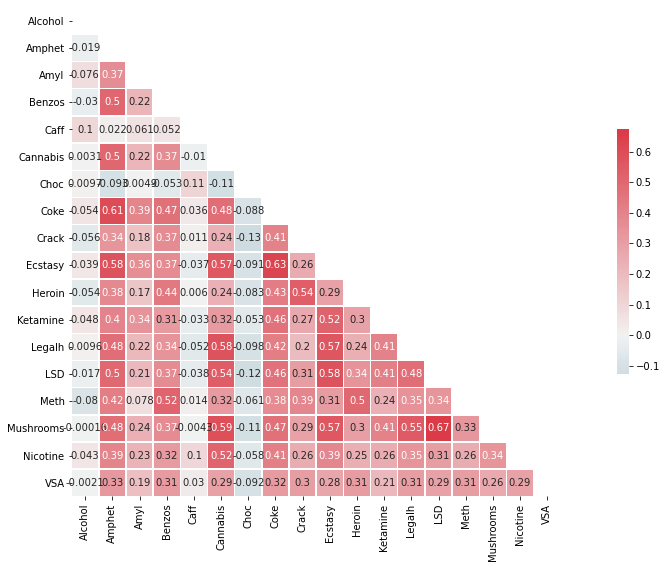

In [68]:
heatmap_corr(drug_data, method='spearman');


Legal ; Caff, Choc, Alcohol -> 다른 약물들과 상관관계가 없어 보임  


In [69]:
drug_data_corr_table_nopval, _ =  calculate_r(drug_data, drug_data, method='spearman', pvalues=False)
get_ranked_corr(drug_data_corr_table_nopval, drug_data_pvalues, corr_threshold=0, name_transform=lambda x:x.rsplit(' ', 1)[0], comp_pval= operator.gt)


,Correlation
Alcohol / Nicotine,0.043
Alcohol / Ecstasy,0.039
Caff / LSD,-0.038
Caff / Ecstasy,-0.037
Caff / Coke,0.036
Caff / Ketamine,-0.033
Alcohol / Benzos,-0.030
Caff / VSA,0.030
Amphet / Caff,0.022
Alcohol / Amphet,-0.019


In [70]:
get_ranked_corr(drug_data_corr_table_nopval, drug_data_pvalues, corr_threshold=0.3, name_transform=lambda x:x.rsplit(' ', 1)[0], comp_corr=operator.lt)


,Correlation
Heroin / Mushrooms,0.298
Heroin / Ketamine,0.297
Nicotine / VSA,0.294
Crack / Mushrooms,0.293
LSD / VSA,0.291
Cannabis / VSA,0.290
Ecstasy / Heroin,0.290
Ecstasy / VSA,0.282
Crack / Ketamine,0.269
Mushrooms / VSA,0.263


Weak correlations

In [71]:
get_ranked_corr(drug_data_corr_table_nopval, drug_data_pvalues, corr_threshold=0.5, name_transform=lambda x:x.rsplit(' ', 1)[0], comp_corr=operator.lt).query('Correlation >= 0.3').reset_index()


,index,Correlation
0,Amphet / LSD,0.499
1,Amphet / Mushrooms,0.484
2,Amphet / Legalh,0.481
3,Legalh / LSD,0.478
4,Cannabis / Coke,0.477
5,Coke / Mushrooms,0.469
6,Benzos / Coke,0.467
7,Coke / Ketamine,0.465
8,Coke / LSD,0.464
9,Benzos / Heroin,0.437


Moderate Correlations

In [72]:
get_ranked_corr(drug_data_corr_table_nopval, drug_data_pvalues, corr_threshold=0.4, name_transform=lambda x:x.rsplit(' ', 1)[0])


,Correlation
LSD / Mushrooms,0.672
Coke / Ecstasy,0.631
Amphet / Coke,0.606
Cannabis / Mushrooms,0.593
Ecstasy / LSD,0.581
Amphet / Ecstasy,0.579
Cannabis / Legalh,0.578
Ecstasy / Legalh,0.570
Cannabis / Ecstasy,0.566
Ecstasy / Mushrooms,0.565


## Correlations between personality traits and drugs

In [116]:
drug_pers_corr_table, drug_pers_pvalues = calculate_r(drug_data, pers_data, method='spearman')
drug_pers_corr_table

,Nscore,Escore,Oscore,Ascore,Cscore,Impulsive,SS
Alcohol,0.0,0.084 ***,0.032,-0.033,0.006,0.039 .,0.094 ***
Amphet,0.135 ***,-0.042 .,0.253 ***,-0.14 ***,-0.253 ***,0.294 ***,0.365 ***
Amyl,0.04 .,0.04 .,0.065 **,-0.079 ***,-0.121 ***,0.13 ***,0.189 ***
Benzos,0.266 ***,-0.096 ***,0.225 ***,-0.164 ***,-0.217 ***,0.233 ***,0.255 ***
Caff,0.022,0.013,-0.02,-0.008,0.006,0.014,-0.005
Cannabis,0.11 ***,-0.022,0.417 ***,-0.155 ***,-0.293 ***,0.313 ***,0.465 ***
Choc,0.025,0.028,-0.015,0.038,0.023,-0.015,-0.052 *
Coke,0.144 ***,0.006,0.205 ***,-0.183 ***,-0.221 ***,0.264 ***,0.34 ***
Crack,0.118 ***,-0.052 *,0.126 ***,-0.091 ***,-0.13 ***,0.19 ***,0.197 ***
Ecstasy,0.087 ***,0.056 *,0.311 ***,-0.118 ***,-0.249 ***,0.272 ***,0.405 ***


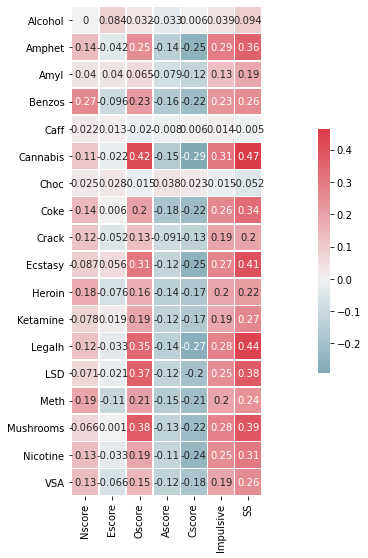

In [117]:
drug_pers_corr_table_no_pvalues, drug_pers_pvalues = calculate_r(drug_data, pers_data, pvalues=False, method='spearman')
heatmap_corr(drug_pers_corr_table_no_pvalues, ready=True, mask=False);

legal한 애들은 상관관계가 거의 없음

Escore(외향성) : 상관관계 거의 없음 : 외향성이 높으면 사교적이고, 사교적이면 에너지를 다른 데에서 찾을 필요가 없어지니까?  
원만성과 성실성은 음의 상관관계 ; 그럴듯함  
충동성과 개방성, 감각추구는 꽤나 중요한 상관관계를 보이는 듯함.
 

In [118]:
get_ranked_corr(drug_pers_corr_table_no_pvalues, drug_pers_pvalues, corr_threshold=0.3, against_itself=False)

,Correlation
Cannabis / SS,0.465
Legalh / SS,0.441
Cannabis / Oscore,0.417
Ecstasy / SS,0.405
Mushrooms / SS,0.391
LSD / SS,0.381
Mushrooms / Oscore,0.379
LSD / Oscore,0.368
Amphet / SS,0.365
Legalh / Oscore,0.347


## Nominal Correlations between demographic and drug consumption

In [120]:
demo_drug_corr_table, demo_drug_pval = nominal_corrs(dataset, demographic_columns, drugs_columns)


In [119]:
demo_drug_corr_table

,Alcohol,Amphet,Amyl,Benzos,Caff,Cannabis,Choc,Coke,Crack,Ecstasy,Heroin,Ketamine,Legalh,LSD,Meth,Mushrooms,Nicotine,VSA
Age,0.083 ***,0.196 ***,0.151 ***,0.144 ***,0.093 ***,0.24 ***,0.087 ***,0.173 ***,0.079 ***,0.203 ***,0.11 ***,0.131 ***,0.215 ***,0.233 ***,0.117 ***,0.221 ***,0.186 ***,0.156 ***
Gender,0.041,0.249 ***,0.157 ***,0.156 ***,0.0,0.309 ***,0.088 **,0.178 ***,0.151 ***,0.241 ***,0.131 ***,0.189 ***,0.327 ***,0.286 ***,0.188 ***,0.278 ***,0.193 ***,0.139 ***
Education,0.079 ***,0.122 ***,0.045 *,0.093 ***,0.033,0.166 ***,0.043 *,0.068 ***,0.082 ***,0.125 ***,0.068 ***,0.061 ***,0.144 ***,0.133 ***,0.106 ***,0.14 ***,0.131 ***,0.098 ***
Country,0.07 ***,0.184 ***,0.112 ***,0.171 ***,0.044 *,0.229 ***,0.063 ***,0.123 ***,0.117 ***,0.146 ***,0.136 ***,0.061 ***,0.183 ***,0.213 ***,0.189 ***,0.203 ***,0.136 ***,0.151 ***
Ethnicity,0.148 ***,0.047 **,0.035 .,0.046 **,0.072 ***,0.088 ***,0.023,0.047 **,0.052 **,0.029,0.0,0.0,0.049 **,0.062 ***,0.022,0.056 ***,0.063 ***,0.074 ***


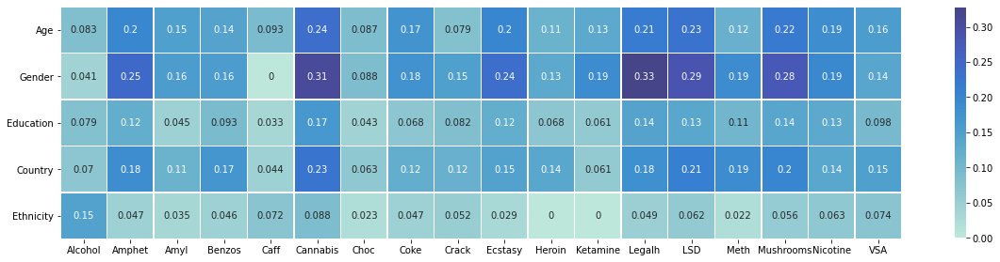

In [74]:
demo_drug_corr_table_no_pvalues, _ = nominal_corrs(dataset, demographic_columns, drugs_columns, pvalues=False)
heatmap_corr(demo_drug_corr_table_no_pvalues, ready=True, mask=False, nominal=True);

Ethnicity, Education : Very low corr  
Gender ; 그나마 약 상관관계  
0.2 이상인 것 추출

In [75]:
get_ranked_corr(demo_drug_corr_table_no_pvalues, demo_drug_pval, corr_threshold=0.2)


,Correlation
Gender / Legalh,0.327
Gender / Cannabis,0.309
Gender / LSD,0.286
Gender / Mushrooms,0.278
Gender / Ecstasy,0.241
Age / Cannabis,0.240
Age / LSD,0.233
Country / Cannabis,0.229
Age / Mushrooms,0.221
Age / Legalh,0.215


Gender & (Legalh, Cannabis, LSD, Mushrooms, Ecstasy) -> 살펴봐야 할 듯함

### Mann-Whitney U test

서로 다른 두 집단의 차이를 분석하는 T 검정과 달리, 순서형 자료의 T 검정 버전

In [76]:
def diff_test(dataset, sample_attr, diff_attr, sample_attr_split='median', diff_attr_type='ordered', split_point=None, alpha=0.05):
    ''' Difference significance test on dataset.
    Returns (p of no difference,
             the group split point,
             the group 1 central,
             the group 2 central,
             a summary). <- shouldn't be in here but whatever
    
    sample_attr - column which will be divided into two samples with median value;
    diff_attr - attribute, which value will be checked in two sample groups;
    diff_attr_type - determines type of data which medians will be compared (ordered, interval)
    '''
    # In case of big data imbalance in highest rank (contains more than half)
    # It would make an empty group when splitting futher down
    if split_point is None and sample_attr_split == "median":
        levels = dataset[sample_attr].unique()
        if not (levels > dataset[sample_attr].median()).any(): # The highest level is the same as median
            split_point = levels[-1] # Split one rank lower instead
    
    if split_point is None:
        split_point = dataset[sample_attr].median() if sample_attr_split=='median' else dataset[sample_attr].mean()

    group_1 = dataset[dataset[sample_attr] > split_point]
    group_2 = dataset[dataset[sample_attr] <= split_point]
    
    group_1_diff_attr_central = group_1[diff_attr].median() if diff_attr_type=='ordered' else group_1[diff_attr].mean()
    group_2_diff_attr_central = group_2[diff_attr].median() if diff_attr_type=='ordered' else group_2[diff_attr].mean()
    
    if diff_attr_type == 'ordered':
        diff_sign, p = mannwhitneyu(group_1[diff_attr], group_2[diff_attr])
    elif diff_attr_type == 'interval':
        diff_sign, p = ttest_ind(group_1[diff_attr], group_2[diff_attr])
    else:
        raise ValueError('diff_attr_type should be one of ordered and interval')
    are = 'are' if p < alpha else 'are not'
    sample_central = 'split point' if split_point is not None else sample_attr_split
    diff_central = 'median' if diff_attr_type=='ordered' else 'mean'
    
    return (p, split_point, group_1_diff_attr_central, group_2_diff_attr_central,
            f'First group: {sample_attr} above {sample_central} value {round(split_point, 3)}\n Second group: {sample_attr} equal or below {sample_central} value {round(split_point, 6)} \n First group {diff_attr} {diff_central}: {round(group_1_diff_attr_central, 3)} \n Second group {diff_attr} {diff_central}: {round(group_2_diff_attr_central, 3)} \n Difference significance for samples: {round(diff_sign, 3)} with p-value: {round(p, 3)} \n Samples {are} statistically different.')

In [77]:
val_between_male_female = (dataset['Gender'][demo['Gender'] == 'Male'].iloc[0] + dataset['Gender'][demo['Gender'] == 'Female'].iloc[0])/ 2


In [78]:
print(diff_test(dataset, 'Gender', 'Cannabis', split_point=val_between_male_female)[-1])


First group: Gender above split point value 0.0
 Second group: Gender equal or below split point value 0.0 
 First group Cannabis median: 2.0 
 Second group Cannabis median: 4.0 
 Difference significance for samples: 288686.5 with p-value: 0.0 
 Samples are statistically different.


In [79]:
print(diff_test(dataset, 'Gender', 'Legalh', split_point=val_between_male_female)[-1])


First group: Gender above split point value 0.0
 Second group: Gender equal or below split point value 0.0 
 First group Legalh median: 0.0 
 Second group Legalh median: 2.0 
 Difference significance for samples: 290886.5 with p-value: 0.0 
 Samples are statistically different.


Mann-Whitney U test 해석

0보다 높은 것이 여성, 낮은 것이 남성이었으니까  
First group : 여성  
Second group : 남성  
Gender 기준 두 집단 차이는 없음(남여 비율 비슷)  
남성이 여성보다 cannabis, Legalh를 많이 소비

## Nominal correlations between demographic and personality

In [80]:
demo_psycho_corr_table, demo_psycho_pvalues = nominal_corrs(dataset, demographic_columns, personality_columns)
demo_psycho_corr_table

,Nscore,Escore,Oscore,Ascore,Cscore,Impulsive,SS
Age,0.033,0.0,0.139 ***,0.0,0.095 ***,0.103 ***,0.159 ***
Gender,0.089 .,0.063,0.139 ***,0.22 ***,0.173 ***,0.19 ***,0.261 ***
Education,0.054 .,0.032,0.094 ***,0.0,0.112 ***,0.072 ***,0.096 ***
Country,0.047,0.086 ***,0.141 ***,0.036,0.105 ***,0.098 ***,0.144 ***
Ethnicity,0.0,0.0,0.04,0.0,0.0,0.045 *,0.046 *


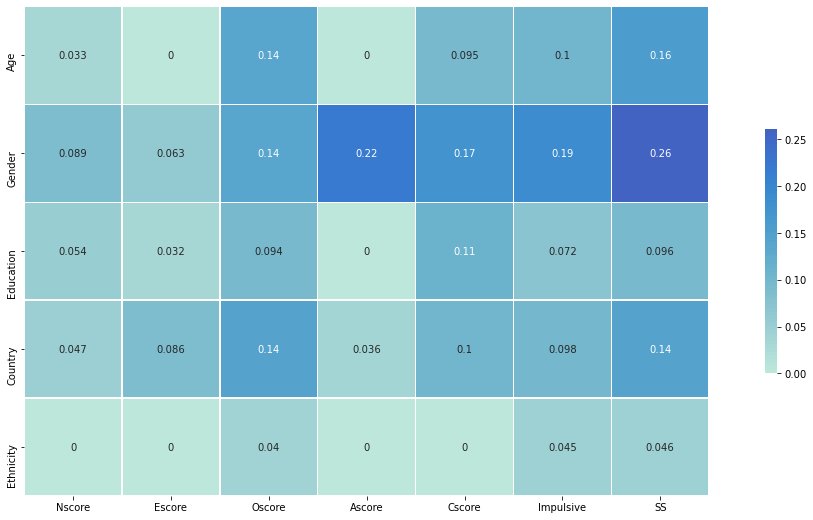

In [81]:
demo_psycho_corr_table_no_pvalues, _ = nominal_corrs(dataset, demographic_columns, personality_columns, pvalues=False)
heatmap_corr(demo_psycho_corr_table_no_pvalues, ready=True, nominal=True, mask=False);

In [82]:
get_ranked_corr(demo_psycho_corr_table_no_pvalues, demo_psycho_pvalues, corr_threshold=0.15)

,Correlation
Gender / SS,0.261
Gender / Ascore,0.220
Gender / Impulsive,0.190
Gender / Cscore,0.173
Age / SS,0.159


### Mann-Whitney U test

In [84]:
print(diff_test(dataset, 'Gender', 'Ascore', split_point=val_between_male_female)[-1])

First group: Gender above split point value 0.0
 Second group: Gender equal or below split point value 0.0 
 First group Ascore median: 0.288 
 Second group Ascore median: -0.302 
 Difference significance for samples: 327571.0 with p-value: 0.0 
 Samples are statistically different.


In [86]:
print(diff_test(dataset, 'Gender', 'SS', split_point=val_between_male_female)[-1])

First group: Gender above split point value 0.0
 Second group: Gender equal or below split point value 0.0 
 First group SS median: -0.216 
 Second group SS median: 0.401 
 Difference significance for samples: 312536.0 with p-value: 0.0 
 Samples are statistically different.


여성이 남성보다 더 원만성이 높고, 덜 sensation seeking 하다.

# Binary classification

3번의 Binary classification 결과 토대로 Random Forest 돌려서 Feature Importance로 평가해도 되지 않을까?  

Feature selection is the process of reducing the number of input variables when developing a predictive model. 

In [15]:
!pip install chart_studio

  Created wheel for retrying: filename=retrying-1.3.3-py3-none-any.whl size=11429 sha256=ae39f8eda65c905a4cbcdacc763a915835bfc2096a269baeee0a6496171b8e9d
  Stored in directory: c:\users\yujinjeong\appdata\local\pip\cache\wheels\f9\8d\8d\f6af3f7f9eea3553bc2fe6d53e4b287dad18b06a861ac56ddf
Successfully built retrying


In [16]:
import plotly.offline as pyo 
import plotly.graph_objs as go
import chart_studio.plotly as py


In [17]:
df = drug1.drop(columns='Semer')

In [18]:
df

,Age,Gender,Education,Country,Ethnicity,Nscore,Escore,Oscore,Ascore,Cscore,Impulsive,SS,Alcohol,Amphet,Amyl,Benzos,Caff,Cannabis,Choc,Coke,Crack,Ecstasy,Heroin,Ketamine,Legalh,LSD,Meth,Mushrooms,Nicotine,VSA
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,0.49788,0.48246,-0.05921,0.96082,0.12600,0.31287,-0.57545,-0.58331,-0.91699,-0.00665,-0.21712,-1.18084,5,2,0,2,6,0,5,0,0,0,0,0,0,0,0,0,2,0
2,-0.07854,-0.48246,1.98437,0.96082,-0.31685,-0.67825,1.93886,1.43533,0.76096,-0.14277,-0.71126,-0.21575,5,2,2,0,6,4,6,3,0,4,0,2,0,2,3,0,4,0
3,0.49788,-0.48246,-0.05921,0.96082,-0.31685,-0.46725,0.80523,-0.84732,-1.62090,-1.01450,-1.37983,0.40148,6,0,0,0,6,3,4,0,0,0,0,0,0,0,0,1,0,0
4,-0.95197,0.48246,1.16365,0.96082,-0.31685,-0.14882,-0.80615,-0.01928,0.59042,0.58489,-1.37983,-1.18084,4,0,0,3,5,2,4,2,0,0,0,2,0,0,0,0,2,0
5,0.49788,0.48246,1.98437,0.96082,-0.31685,0.73545,-1.63340,-0.45174,-0.30172,1.30612,-0.21712,-0.21575,4,1,1,0,6,3,6,0,0,1,0,0,1,0,0,2,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1884,-0.95197,0.48246,-0.61113,-0.57009,-0.31685,-1.19430,1.74091,1.88511,0.76096,-1.13788,0.88113,1.92173,5,0,0,0,4,5,4,0,0,0,0,0,3,3,0,0,0,5
1885,-0.95197,-0.48246,-0.61113,-0.57009,-0.31685,-0.24649,1.74091,0.58331,0.76096,-1.51840,0.88113,0.76540,5,0,0,0,5,3,4,0,0,2,0,0,3,5,4,4,5,0
1886,-0.07854,0.48246,0.45468,-0.57009,-0.31685,1.13281,-1.37639,-1.27553,-1.77200,-1.38502,0.52975,-0.52593,4,6,5,5,6,6,6,4,0,4,0,2,0,2,0,2,6,0


In [19]:
drugs_columns

['Alcohol',
 'Amphet',
 'Amyl',
 'Benzos',
 'Caff',
 'Cannabis',
 'Choc',
 'Coke',
 'Crack',
 'Ecstasy',
 'Heroin',
 'Ketamine',
 'Legalh',
 'LSD',
 'Meth',
 'Mushrooms',
 'Nicotine',
 'VSA']

In [20]:
df['Caff']

ID
1       6
2       6
3       6
4       5
5       6
       ..
1884    4
1885    5
1886    6
1887    6
1888    6
Name: Caff, Length: 1877, dtype: int64

Consumer vs. Non-Consumer 

In [21]:
cp = ['User_Alcohol','User_Amphet', 'User_Amyl', 'User_Benzos', 'User_Caff', 'User_Cannabis', 'User_Choc', 'User_Coke', 'User_Crack',
           'User_Ecstasy', 'User_Heroin', 'User_Ketamine', 'User_Legalh', 'User_LSD', 'User_Meth', 'User_Mushrooms','User_Nicotine', 'User_VSA']

In [27]:
for i in range(len(drugs_columns)):
    df.loc[((df[drugs_columns[i]]==0) | (df[drugs_columns[i]]==1)|(df[drugs_columns[i]]==2) ),cp[i]] = 'Non-user'
    df.loc[((df[drugs_columns[i]]==3) | (df[drugs_columns[i]]==4) | (df[drugs_columns[i]]==5) | (df[drugs_columns[i]]==6)),cp[i]] = 'User'

In [28]:
count_of_users = []
count_of_non_users = []

In [29]:
for i in range(len(drugs_columns)):
    s = df.groupby([cp[i]])[drugs_columns[i]].count()
    count_of_users.append(s[1])
    count_of_non_users.append(s[0])

In [69]:
trace1 = go.Bar(
    x=drugs_columns,
    y=count_of_users,
    name='User',
    marker = dict(color="rgb(117, 127, 221)")
)
trace2 = go.Bar(
    x=drugs_columns,
    y=count_of_non_users,
    name='Non-User',
    marker = dict(color="rgb(191, 221, 229)")
)


data = [trace1, trace2]
layout = go.Layout(
    title= 'Drug Vs User Or Non-user',
    yaxis=dict(title='Count', ticklen=5, gridwidth=2),
    barmode='group'
)

fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='grouped-bar')

PlotlyRequestError: Authentication credentials were not provided.

ValueError: shape mismatch: objects cannot be broadcast to a single shape

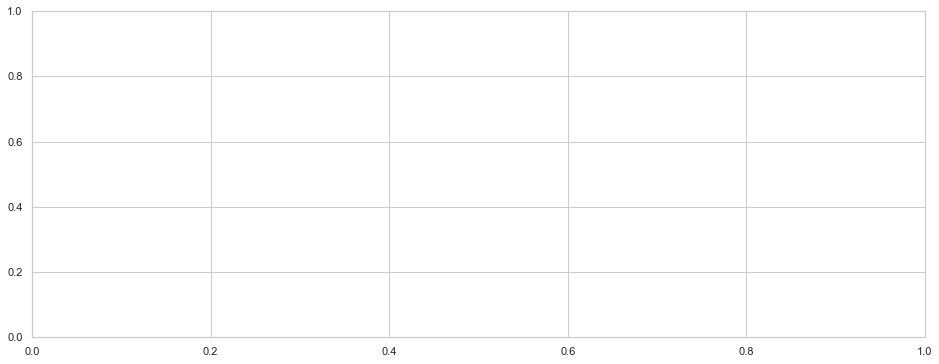

In [31]:
bins = np.arange(1,20,1)
plt.figure(figsize=(16,6))
plt.bar(bins+0,count_of_users,width=0.4,label ='Consumer')
plt.bar(bins+.30,count_of_non_users,width=0.4,label ='Non-Consumer')
plt.xticks(bins,columns,rotation=50,fontsize=13)
plt.ylabel("Count",fontsize=13)
plt.title("Consumer Vs Non-Consumer",fontsize=15)
plt.legend()

CL0 & CL1 -> Non-Consumer
Others -> Consumer

## Numerical Input, Categorical Output
This is a classification predictive modeling problem with numerical input variables.

This might be the most common example of a classification problem,

Again, the most common techniques are correlation based, although in this case, they must take the categorical target into account.

ANOVA correlation coefficient (linear).
Kendall’s rank coefficient (nonlinear).
Kendall does assume that the categorical variable is ordinal.

## Categorical Input, Categorical Output
This is a classification predictive modeling problem with categorical input variables.

The most common correlation measure for categorical data is the chi-squared test. You can also use mutual information (information gain) from the field of information theory.

Chi-Squared test (contingency tables).
Mutual Information.
In fact, mutual information is a powerful method that may prove useful for both categorical and numerical data, e.g. it is agnostic to the data types.

# Evaluation of risk

In [72]:
from sklearn.model_selection import train_test_split


In [73]:
feature_columns

['Age',
 'Gender',
 'Education',
 'Country',
 'Ethnicity',
 'Nscore',
 'Escore',
 'Oscore',
 'Ascore',
 'Cscore',
 'Impulsive',
 'SS']

In [74]:
drugs_columns

['Alcohol',
 'Amphet',
 'Amyl',
 'Benzos',
 'Caff',
 'Cannabis',
 'Choc',
 'Coke',
 'Crack',
 'Ecstasy',
 'Heroin',
 'Ketamine',
 'Legalh',
 'LSD',
 'Meth',
 'Mushrooms',
 'Nicotine',
 'VSA']

In [75]:
yp = []
for i in df['Benzos']:
    if(i==0):
        yp.append([1,0,0,0,0,0,0])
    elif(i==1):
        yp.append([0,1,0,0,0,0,0])
    elif(i==2):
        yp.append([0,0,1,0,0,0,0])
    elif(i==3):
        yp.append([0,0,0,1,0,0,0])
    elif(i==4):
        yp.append([0,0,0,0,1,0,0])
    elif(i==5):
        yp.append([0,0,0,0,0,1,0])
    elif(i==6):
        yp.append([0,0,0,0,0,0,1])
yp = np.array(yp)



In [76]:
X = df[feature_columns].values
y = df[drugs_columns].values

# Pycaret

## 3 Feature Selection Methods
1. Univariate Selection
2. Feature Importance
3. Correlation Matrix with Heatmap

In [77]:
from pycaret.classification import *

from pycaret.utils import check_metric


In [78]:
data = drug1.drop(columns='Semer')

In [80]:
data.iloc[:,0:13]

,Age,Gender,Education,Country,Ethnicity,Nscore,Escore,Oscore,Ascore,Cscore,Impulsive,SS,Alcohol
ID,,,,,,,,,,,,,
1,0.49788,0.48246,-0.05921,0.96082,0.12600,0.31287,-0.57545,-0.58331,-0.91699,-0.00665,-0.21712,-1.18084,5
2,-0.07854,-0.48246,1.98437,0.96082,-0.31685,-0.67825,1.93886,1.43533,0.76096,-0.14277,-0.71126,-0.21575,5
3,0.49788,-0.48246,-0.05921,0.96082,-0.31685,-0.46725,0.80523,-0.84732,-1.62090,-1.01450,-1.37983,0.40148,6
4,-0.95197,0.48246,1.16365,0.96082,-0.31685,-0.14882,-0.80615,-0.01928,0.59042,0.58489,-1.37983,-1.18084,4
5,0.49788,0.48246,1.98437,0.96082,-0.31685,0.73545,-1.63340,-0.45174,-0.30172,1.30612,-0.21712,-0.21575,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1884,-0.95197,0.48246,-0.61113,-0.57009,-0.31685,-1.19430,1.74091,1.88511,0.76096,-1.13788,0.88113,1.92173,5
1885,-0.95197,-0.48246,-0.61113,-0.57009,-0.31685,-0.24649,1.74091,0.58331,0.76096,-1.51840,0.88113,0.76540,5
1886,-0.07854,0.48246,0.45468,-0.57009,-0.31685,1.13281,-1.37639,-1.27553,-1.77200,-1.38502,0.52975,-0.52593,4


In [81]:
from pycaret.classification import *
setup_clf = setup(data=data.iloc[:,0:13], target = 'Alcohol')

,Description,Value
0,session_id,744
1,Target,Alcohol
2,Target Type,Multiclass
3,Label Encoded,None
4,Original Data,"(1877, 13)"
5,Missing Values,False
6,Numeric Features,11
7,Categorical Features,1
8,Ordinal Features,False
9,High Cardinality Features,False


In [ ]:
compare_models()


## Alcohol

Use all target variables as X

In [83]:
from pycaret.classification import *
setup_clf = setup(data=data, target = 'Alcohol')

,Description,Value
0,session_id,5659
1,Target,Alcohol
2,Target Type,Multiclass
3,Label Encoded,None
4,Original Data,"(1877, 30)"
5,Missing Values,False
6,Numeric Features,11
7,Categorical Features,18
8,Ordinal Features,False
9,High Cardinality Features,False


In [85]:
compare_models()


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.3907,0.5708,0.1545,0.3025,0.3024,0.0323,0.0384,0.3020
et,Extra Trees Classifier,0.3770,0.5744,0.1764,0.3045,0.3154,0.0440,0.0493,0.2810
ridge,Ridge Classifier,0.3588,0.0000,0.1509,0.2886,0.2990,0.0200,0.0238,0.0250
gbc,Gradient Boosting Classifier,0.3573,0.5724,0.1797,0.2929,0.3068,0.0333,0.0359,1.0550
lr,Logistic Regression,0.3512,0.5737,0.1724,0.2961,0.3072,0.0329,0.0359,0.1890
ada,Ada Boost Classifier,0.3495,0.5139,0.1729,0.2827,0.2737,0.0241,0.0305,0.0930
lightgbm,Light Gradient Boosting Machine,0.3473,0.5377,0.1596,0.2899,0.3046,0.0201,0.0209,0.2390
lda,Linear Discriminant Analysis,0.3336,0.5660,0.1773,0.2973,0.3005,0.0385,0.0411,0.0340
svm,SVM - Linear Kernel,0.3260,0.0000,0.1636,0.3011,0.2983,0.0332,0.0352,0.0520
knn,K Neighbors Classifier,0.3138,0.5319,0.1507,0.2952,0.2974,0.0224,0.0228,0.0900


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=5659, verbose=0,
                       warm_start=False)

## Binary(2,5) Model Pycaret
- CL0 & CL1 -> Non-user
- CL2 ~ CL6 -> User

### Alcohol

In [86]:
df_binary1 = pd.concat([df.iloc[:,0:12],df.iloc[:,30:]],axis=1)

In [87]:
df_binary1

,Age,Gender,Education,Country,Ethnicity,Nscore,Escore,Oscore,Ascore,Cscore,...,User_Crack,User_Ecstasy,User_Heroin,User_Ketamine,User_Legalh,User_LSD,User_Meth,User_Mushrooms,User_Nicotine,User_VSA
ID,,,,,,,,,,,,,,,,,,,,,
1,0.49788,0.48246,-0.05921,0.96082,0.12600,0.31287,-0.57545,-0.58331,-0.91699,-0.00665,...,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user
2,-0.07854,-0.48246,1.98437,0.96082,-0.31685,-0.67825,1.93886,1.43533,0.76096,-0.14277,...,Non-user,User,Non-user,Non-user,Non-user,Non-user,User,Non-user,User,Non-user
3,0.49788,-0.48246,-0.05921,0.96082,-0.31685,-0.46725,0.80523,-0.84732,-1.62090,-1.01450,...,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user
4,-0.95197,0.48246,1.16365,0.96082,-0.31685,-0.14882,-0.80615,-0.01928,0.59042,0.58489,...,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user
5,0.49788,0.48246,1.98437,0.96082,-0.31685,0.73545,-1.63340,-0.45174,-0.30172,1.30612,...,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1884,-0.95197,0.48246,-0.61113,-0.57009,-0.31685,-1.19430,1.74091,1.88511,0.76096,-1.13788,...,Non-user,Non-user,Non-user,Non-user,User,User,Non-user,Non-user,Non-user,User
1885,-0.95197,-0.48246,-0.61113,-0.57009,-0.31685,-0.24649,1.74091,0.58331,0.76096,-1.51840,...,Non-user,Non-user,Non-user,Non-user,User,User,User,User,User,Non-user
1886,-0.07854,0.48246,0.45468,-0.57009,-0.31685,1.13281,-1.37639,-1.27553,-1.77200,-1.38502,...,Non-user,User,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,User,Non-user


In [88]:
X = df_binary1.iloc[:,0:11]
y = df_binary1.iloc[:,12]
data = pd.concat([X,y],axis=1)

In [89]:
data.iloc[:,-1]

ID
1       User
2       User
3       User
4       User
5       User
        ... 
1884    User
1885    User
1886    User
1887    User
1888    User
Name: User_Alcohol, Length: 1877, dtype: object

In [90]:
from pycaret.classification import *
setup_clf = setup(data=data, target = data.columns[-1],feature_selection=True)

,Description,Value
0,session_id,4279
1,Target,User_Alcohol
2,Target Type,Binary
3,Label Encoded,"Non-user: 0, User: 1"
4,Original Data,"(1877, 12)"
5,Missing Values,False
6,Numeric Features,10
7,Categorical Features,1
8,Ordinal Features,False
9,High Cardinality Features,False


In [91]:
setup_clf

(False,
 <MLUsecase.CLASSIFICATION: 1>,
 [],
 {'USI',
  'X',
  'X_test',
  'X_train',
  '_all_metrics',
  '_all_models',
  '_all_models_internal',
  '_available_plots',
  '_gpu_n_jobs_param',
  '_internal_pipeline',
  '_ml_usecase',
  'create_model_container',
  'data_before_preprocess',
  'display_container',
  'exp_name_log',
  'experiment__',
  'fix_imbalance_method_param',
  'fix_imbalance_param',
  'fold_generator',
  'fold_groups_param',
  'fold_groups_param_full',
  'fold_param',
  'fold_shuffle_param',
  'gpu_param',
  'html_param',
  'imputation_classifier',
  'imputation_regressor',
  'iterative_imputation_iters_param',
  'log_plots_param',
  'logging_param',
  'master_model_container',
  'n_jobs_param',
  'prep_pipe',
  'pycaret_globals',
  'seed',
  'stratify_param',
  'target_param',
  'transform_target_method_param',
  'transform_target_param',
  'y',
  'y_test',
  'y_train'},
 True,
 'User_Alcohol',
        Oscore   Cscore   Ascore  Ethnicity  Impulsive   Escore  Country

In [92]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
ridge,Ridge Classifier,0.9223,0.0000,1.0000,0.9223,0.9596,0.0000,0.0000,0.0080
lr,Logistic Regression,0.9216,0.6705,0.9992,0.9223,0.9592,-0.0014,-0.0025,0.0270
knn,K Neighbors Classifier,0.9208,0.5504,0.9975,0.9229,0.9587,0.0128,0.0230,0.0560
lda,Linear Discriminant Analysis,0.9208,0.6750,0.9983,0.9222,0.9588,-0.0028,-0.0052,0.0110
et,Extra Trees Classifier,0.9200,0.6352,0.9950,0.9241,0.9583,0.0356,0.0405,0.2330
svm,SVM - Linear Kernel,0.9193,0.0000,0.9967,0.9221,0.9579,-0.0051,-0.0070,0.0100
rf,Random Forest Classifier,0.9177,0.6175,0.9950,0.9220,0.9571,-0.0082,-0.0137,0.2540
qda,Quadratic Discriminant Analysis,0.9132,0.6255,0.9851,0.9256,0.9544,0.0628,0.0768,0.0130
ada,Ada Boost Classifier,0.9132,0.6020,0.9876,0.9236,0.9545,0.0272,0.0344,0.0480
nb,Naive Bayes,0.9124,0.6210,0.9868,0.9235,0.9541,0.0219,0.0226,0.0240


RidgeClassifier(alpha=1.0, class_weight=None, copy_X=True, fit_intercept=True,
                max_iter=None, normalize=False, random_state=4279,
                solver='auto', tol=0.001)

In [94]:
top5 = compare_models(sort='Accuracy',n_select=5)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
ridge,Ridge Classifier,0.9223,0.0000,1.0000,0.9223,0.9596,0.0000,0.0000,0.0090
lr,Logistic Regression,0.9216,0.6705,0.9992,0.9223,0.9592,-0.0014,-0.0025,0.0260
knn,K Neighbors Classifier,0.9208,0.5504,0.9975,0.9229,0.9587,0.0128,0.0230,0.0560
lda,Linear Discriminant Analysis,0.9208,0.6750,0.9983,0.9222,0.9588,-0.0028,-0.0052,0.0080
et,Extra Trees Classifier,0.9200,0.6352,0.9950,0.9241,0.9583,0.0356,0.0405,0.2280
svm,SVM - Linear Kernel,0.9193,0.0000,0.9967,0.9221,0.9579,-0.0051,-0.0070,0.0130
rf,Random Forest Classifier,0.9177,0.6175,0.9950,0.9220,0.9571,-0.0082,-0.0137,0.2740
qda,Quadratic Discriminant Analysis,0.9132,0.6255,0.9851,0.9256,0.9544,0.0628,0.0768,0.0120
ada,Ada Boost Classifier,0.9132,0.6020,0.9876,0.9236,0.9545,0.0272,0.0344,0.0510
nb,Naive Bayes,0.9124,0.6210,0.9868,0.9235,0.9541,0.0219,0.0226,0.0210


In [95]:
tuned_top5 = [tune_model(i) for i in top5]
blender_top5 = blend_models(estimator_list=tuned_top5)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9242,0.0000,1.0000,0.9242,0.9606,0.0000,0.0000
1,0.9167,0.0000,1.0000,0.9167,0.9565,0.0000,0.0000
2,0.9167,0.0000,1.0000,0.9167,0.9565,0.0000,0.0000
3,0.9237,0.0000,1.0000,0.9237,0.9603,0.0000,0.0000
4,0.9237,0.0000,1.0000,0.9237,0.9603,0.0000,0.0000
5,0.9237,0.0000,1.0000,0.9237,0.9603,0.0000,0.0000
6,0.9237,0.0000,1.0000,0.9237,0.9603,0.0000,0.0000
7,0.9237,0.0000,1.0000,0.9237,0.9603,0.0000,0.0000
8,0.9237,0.0000,1.0000,0.9237,0.9603,0.0000,0.0000
9,0.9237,0.0000,1.0000,0.9237,0.9603,0.0000,0.0000


In [96]:
# 모델 최종 확정, 전체 데이터 학습
final_model = finalize_model(blender_top5)



In [97]:
# 테스트셋 predict
prediction = predict_model(final_model, data=data)


In [98]:
# metric 확인
check_metric(prediction[data.columns[-1]], prediction['Label'], metric = 'Accuracy')


0.9281

In [99]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9242,0.6951,1.0000,0.9242,0.9606,0.0000,0.0000
1,0.9167,0.6521,1.0000,0.9167,0.9565,0.0000,0.0000
2,0.9167,0.6446,1.0000,0.9167,0.9565,0.0000,0.0000
3,0.9237,0.7140,1.0000,0.9237,0.9603,0.0000,0.0000
4,0.9160,0.6744,0.9917,0.9231,0.9562,-0.0141,-0.0252
5,0.9237,0.7331,1.0000,0.9237,0.9603,0.0000,0.0000
6,0.9237,0.6388,1.0000,0.9237,0.9603,0.0000,0.0000
7,0.9237,0.7736,1.0000,0.9237,0.9603,0.0000,0.0000
8,0.9237,0.5653,1.0000,0.9237,0.9603,0.0000,0.0000
9,0.9237,0.6140,1.0000,0.9237,0.9603,0.0000,0.0000


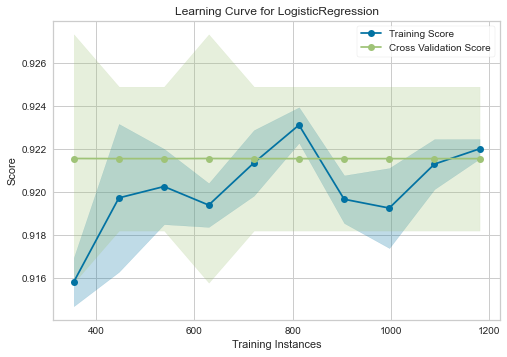

In [101]:
plot_model(lr, plot = 'learning')


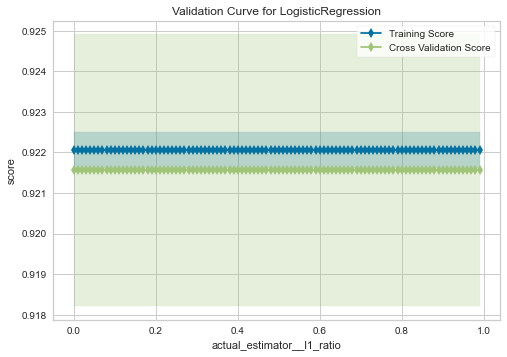

In [102]:
plot_model(lr, plot = 'vc')


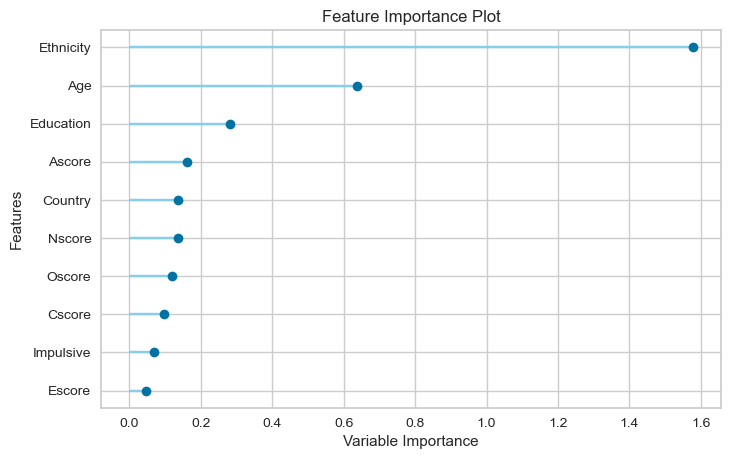

In [103]:
# feature importance
plot_model(lr,plot='feature_all')

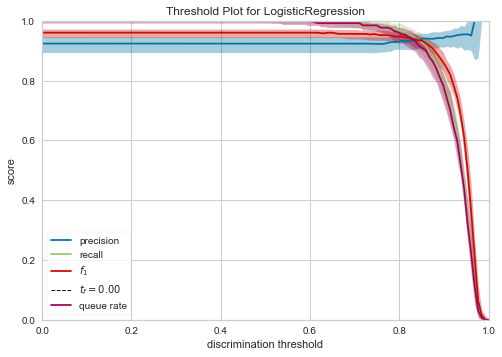

In [104]:
plot_model(lr, plot = 'threshold')


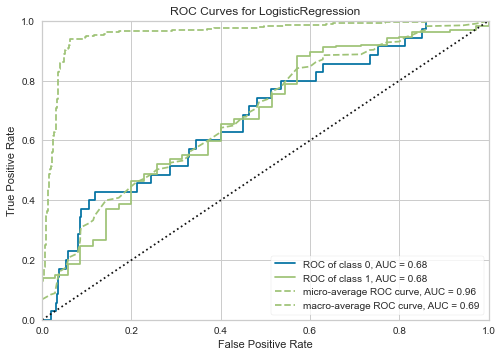

In [62]:
# AUC curve
plot_model(lr, plot = 'auc')


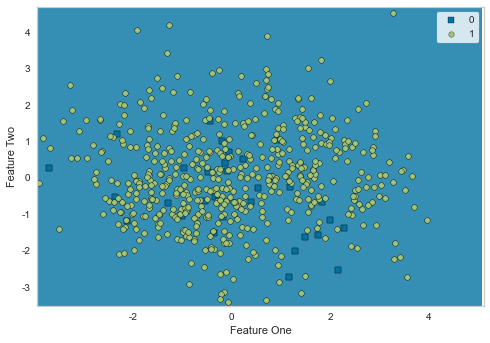

In [105]:
plot_model(lr, plot = 'boundary')


### Amphet

In [106]:
df_binary1

,Age,Gender,Education,Country,Ethnicity,Nscore,Escore,Oscore,Ascore,Cscore,...,User_Crack,User_Ecstasy,User_Heroin,User_Ketamine,User_Legalh,User_LSD,User_Meth,User_Mushrooms,User_Nicotine,User_VSA
ID,,,,,,,,,,,,,,,,,,,,,
1,0.49788,0.48246,-0.05921,0.96082,0.12600,0.31287,-0.57545,-0.58331,-0.91699,-0.00665,...,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user
2,-0.07854,-0.48246,1.98437,0.96082,-0.31685,-0.67825,1.93886,1.43533,0.76096,-0.14277,...,Non-user,User,Non-user,Non-user,Non-user,Non-user,User,Non-user,User,Non-user
3,0.49788,-0.48246,-0.05921,0.96082,-0.31685,-0.46725,0.80523,-0.84732,-1.62090,-1.01450,...,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user
4,-0.95197,0.48246,1.16365,0.96082,-0.31685,-0.14882,-0.80615,-0.01928,0.59042,0.58489,...,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user
5,0.49788,0.48246,1.98437,0.96082,-0.31685,0.73545,-1.63340,-0.45174,-0.30172,1.30612,...,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1884,-0.95197,0.48246,-0.61113,-0.57009,-0.31685,-1.19430,1.74091,1.88511,0.76096,-1.13788,...,Non-user,Non-user,Non-user,Non-user,User,User,Non-user,Non-user,Non-user,User
1885,-0.95197,-0.48246,-0.61113,-0.57009,-0.31685,-0.24649,1.74091,0.58331,0.76096,-1.51840,...,Non-user,Non-user,Non-user,Non-user,User,User,User,User,User,Non-user
1886,-0.07854,0.48246,0.45468,-0.57009,-0.31685,1.13281,-1.37639,-1.27553,-1.77200,-1.38502,...,Non-user,User,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,User,Non-user


In [107]:
X = df_binary1.iloc[:,0:11]
y = df_binary1.iloc[:,13]
data = pd.concat([X,y],axis=1)

In [108]:
data.iloc[:,-1]

ID
1       Non-user
2       Non-user
3       Non-user
4       Non-user
5       Non-user
          ...   
1884    Non-user
1885    Non-user
1886        User
1887    Non-user
1888        User
Name: User_Amphet, Length: 1877, dtype: object

In [109]:
from pycaret.classification import *
setup_clf = setup(data=data, target = data.columns[-1],feature_selection=True)

,Description,Value
0,session_id,2802
1,Target,User_Amphet
2,Target Type,Binary
3,Label Encoded,"Non-user: 0, User: 1"
4,Original Data,"(1877, 12)"
5,Missing Values,False
6,Numeric Features,10
7,Categorical Features,1
8,Ordinal Features,False
9,High Cardinality Features,False


In [110]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.7921,0.8270,0.3726,0.5697,0.4455,0.3257,0.3390,0.0240
ridge,Ridge Classifier,0.7913,0.0000,0.2986,0.5761,0.3841,0.2776,0.3018,0.0070
et,Extra Trees Classifier,0.7906,0.8202,0.3795,0.5561,0.4439,0.3233,0.3351,0.2340
gbc,Gradient Boosting Classifier,0.7883,0.8145,0.3962,0.5450,0.4521,0.3274,0.3367,0.0710
lda,Linear Discriminant Analysis,0.7875,0.8271,0.4332,0.5476,0.4770,0.3476,0.3549,0.0090
qda,Quadratic Discriminant Analysis,0.7814,0.8206,0.5640,0.5193,0.5378,0.3958,0.3982,0.0150
lightgbm,Light Gradient Boosting Machine,0.7791,0.8109,0.3922,0.5149,0.4424,0.3090,0.3146,0.0360
ada,Ada Boost Classifier,0.7783,0.7964,0.4122,0.5083,0.4490,0.3150,0.3201,0.0500
rf,Random Forest Classifier,0.7776,0.8214,0.2993,0.5151,0.3738,0.2524,0.2675,0.2400
knn,K Neighbors Classifier,0.7768,0.7770,0.4129,0.5057,0.4514,0.3145,0.3184,0.0570


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=2802, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [111]:
top5 = compare_models(sort='Accuracy',n_select=5)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.7921,0.8270,0.3726,0.5697,0.4455,0.3257,0.3390,0.0300
ridge,Ridge Classifier,0.7913,0.0000,0.2986,0.5761,0.3841,0.2776,0.3018,0.0090
et,Extra Trees Classifier,0.7906,0.8202,0.3795,0.5561,0.4439,0.3233,0.3351,0.2230
gbc,Gradient Boosting Classifier,0.7883,0.8145,0.3962,0.5450,0.4521,0.3274,0.3367,0.0730
lda,Linear Discriminant Analysis,0.7875,0.8271,0.4332,0.5476,0.4770,0.3476,0.3549,0.0080
qda,Quadratic Discriminant Analysis,0.7814,0.8206,0.5640,0.5193,0.5378,0.3958,0.3982,0.0120
lightgbm,Light Gradient Boosting Machine,0.7791,0.8109,0.3922,0.5149,0.4424,0.3090,0.3146,0.0390
ada,Ada Boost Classifier,0.7783,0.7964,0.4122,0.5083,0.4490,0.3150,0.3201,0.0500
rf,Random Forest Classifier,0.7776,0.8214,0.2993,0.5151,0.3738,0.2524,0.2675,0.2490
knn,K Neighbors Classifier,0.7768,0.7770,0.4129,0.5057,0.4514,0.3145,0.3184,0.0590


In [112]:
tuned_top5 = [tune_model(i) for i in top5]
blender_top5 = blend_models(estimator_list=tuned_top5)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8106,0.0000,0.3667,0.6471,0.4681,0.3634,0.3851
1,0.7879,0.0000,0.3667,0.5500,0.4400,0.3156,0.3254
2,0.8030,0.0000,0.4000,0.6000,0.4800,0.3644,0.3758
3,0.7786,0.0000,0.1379,0.5000,0.2162,0.1332,0.1712
4,0.8092,0.0000,0.4483,0.5909,0.5098,0.3941,0.3999
5,0.7939,0.0000,0.4333,0.5652,0.4906,0.3642,0.3692
6,0.7710,0.0000,0.2000,0.5000,0.2857,0.1782,0.2048
7,0.7710,0.0000,0.3333,0.5000,0.4000,0.2654,0.2738
8,0.8244,0.0000,0.3333,0.7692,0.4651,0.3791,0.4267
9,0.7786,0.0000,0.1667,0.5556,0.2564,0.1685,0.2111


In [113]:
# 모델 최종 확정, 전체 데이터 학습
final_model = finalize_model(blender_top5)



In [114]:
# 테스트셋 predict
prediction = predict_model(final_model, data=data)


In [115]:
# metric 확인
check_metric(prediction[data.columns[-1]], prediction['Label'], metric = 'Accuracy')


0.7933

In [116]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8030,0.8369,0.4000,0.6000,0.4800,0.3644,0.3758
1,0.7803,0.8464,0.4000,0.5217,0.4528,0.3184,0.3228
2,0.7879,0.7967,0.4000,0.5455,0.4615,0.3333,0.3395
3,0.8015,0.8570,0.3448,0.5882,0.4348,0.3242,0.3412
4,0.8015,0.8442,0.4483,0.5652,0.5000,0.3782,0.3822
5,0.7786,0.7997,0.4667,0.5185,0.4912,0.3503,0.3511
6,0.7786,0.8076,0.2667,0.5333,0.3556,0.2394,0.2604
7,0.7634,0.7865,0.3333,0.4762,0.3922,0.2509,0.2570
8,0.8397,0.8462,0.4333,0.7647,0.5532,0.4645,0.4923
9,0.7863,0.8492,0.2333,0.5833,0.3333,0.2330,0.2678


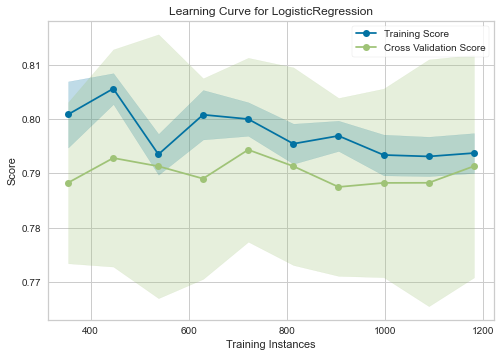

In [117]:
plot_model(lr, plot = 'learning')


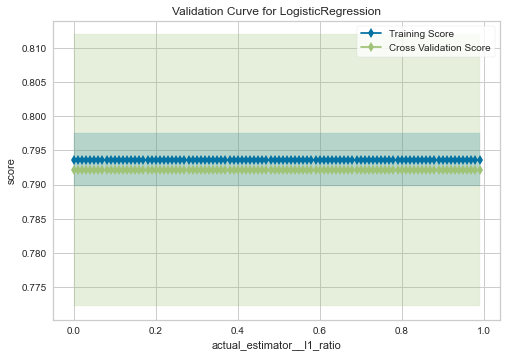

In [118]:
plot_model(lr, plot = 'vc')


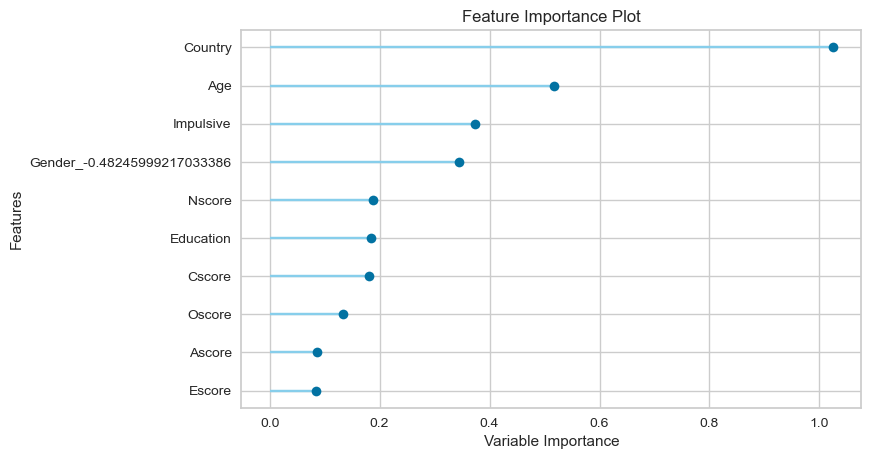

In [119]:
# feature importance
plot_model(lr,plot='feature_all')

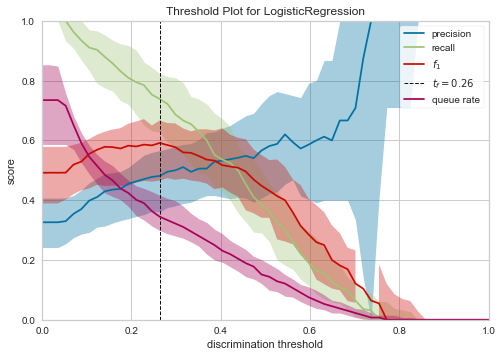

In [121]:
plot_model(lr, plot = 'threshold')


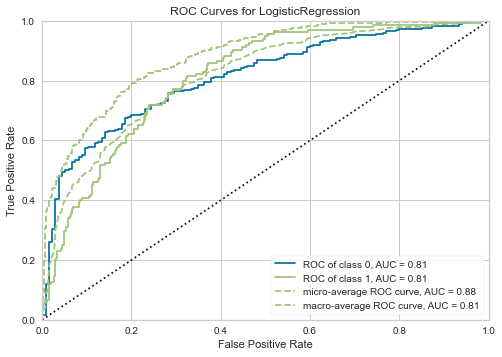

In [122]:
# AUC curve
plot_model(lr, plot = 'auc')


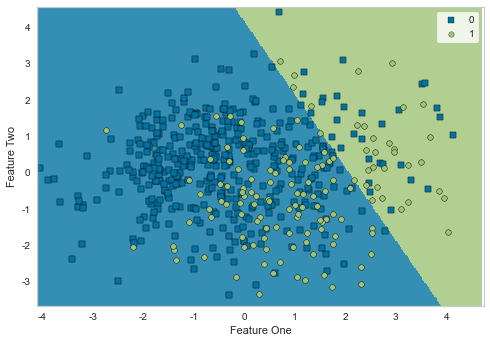

In [123]:
plot_model(lr, plot = 'boundary')


## Amyl

In [126]:
df_binary1

,Age,Gender,Education,Country,Ethnicity,Nscore,Escore,Oscore,Ascore,Cscore,...,User_Crack,User_Ecstasy,User_Heroin,User_Ketamine,User_Legalh,User_LSD,User_Meth,User_Mushrooms,User_Nicotine,User_VSA
ID,,,,,,,,,,,,,,,,,,,,,
1,0.49788,0.48246,-0.05921,0.96082,0.12600,0.31287,-0.57545,-0.58331,-0.91699,-0.00665,...,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user
2,-0.07854,-0.48246,1.98437,0.96082,-0.31685,-0.67825,1.93886,1.43533,0.76096,-0.14277,...,Non-user,User,Non-user,Non-user,Non-user,Non-user,User,Non-user,User,Non-user
3,0.49788,-0.48246,-0.05921,0.96082,-0.31685,-0.46725,0.80523,-0.84732,-1.62090,-1.01450,...,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user
4,-0.95197,0.48246,1.16365,0.96082,-0.31685,-0.14882,-0.80615,-0.01928,0.59042,0.58489,...,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user
5,0.49788,0.48246,1.98437,0.96082,-0.31685,0.73545,-1.63340,-0.45174,-0.30172,1.30612,...,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1884,-0.95197,0.48246,-0.61113,-0.57009,-0.31685,-1.19430,1.74091,1.88511,0.76096,-1.13788,...,Non-user,Non-user,Non-user,Non-user,User,User,Non-user,Non-user,Non-user,User
1885,-0.95197,-0.48246,-0.61113,-0.57009,-0.31685,-0.24649,1.74091,0.58331,0.76096,-1.51840,...,Non-user,Non-user,Non-user,Non-user,User,User,User,User,User,Non-user
1886,-0.07854,0.48246,0.45468,-0.57009,-0.31685,1.13281,-1.37639,-1.27553,-1.77200,-1.38502,...,Non-user,User,Non-user,Non-user,Non-user,Non-user,Non-user,Non-user,User,Non-user


In [139]:
X = df_binary1.iloc[:,0:12]
y = df_binary1.iloc[:,14]
data = pd.concat([X,y],axis=1)

In [141]:
data.iloc[:,-1]

ID
1       Non-user
2       Non-user
3       Non-user
4       Non-user
5       Non-user
          ...   
1884    Non-user
1885    Non-user
1886        User
1887    Non-user
1888    Non-user
Name: User_Amyl, Length: 1877, dtype: object

In [142]:
from pycaret.classification import *
setup_clf = setup(data=data, target = data.columns[-1],feature_selection=True)

,Description,Value
0,session_id,8006
1,Target,User_Amyl
2,Target Type,Binary
3,Label Encoded,"Non-user: 0, User: 1"
4,Original Data,"(1877, 13)"
5,Missing Values,False
6,Numeric Features,11
7,Categorical Features,1
8,Ordinal Features,False
9,High Cardinality Features,False


In [143]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.9277,0.6978,0.0222,0.2000,0.0400,0.0364,0.0621,0.2310
ridge,Ridge Classifier,0.9269,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0130
rf,Random Forest Classifier,0.9269,0.6805,0.0000,0.0000,0.0000,0.0000,0.0000,0.2510
lr,Logistic Regression,0.9261,0.7206,0.0000,0.0000,0.0000,-0.0014,-0.0025,1.3430
lda,Linear Discriminant Analysis,0.9261,0.7199,0.0000,0.0000,0.0000,-0.0014,-0.0025,0.0130
svm,SVM - Linear Kernel,0.9254,0.0000,0.0000,0.0000,0.0000,-0.0028,-0.0049,0.0130
ada,Ada Boost Classifier,0.9231,0.6536,0.0311,0.2333,0.0536,0.0401,0.0644,0.0640
knn,K Neighbors Classifier,0.9223,0.5877,0.0100,0.0500,0.0167,0.0063,0.0065,0.0590
gbc,Gradient Boosting Classifier,0.9223,0.7169,0.0222,0.1333,0.0367,0.0255,0.0397,0.0790
lightgbm,Light Gradient Boosting Machine,0.9193,0.6864,0.0333,0.1500,0.0545,0.0356,0.0465,0.0520


ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=8006, verbose=0,
                     warm_start=False)

In [144]:
top5 = compare_models(sort='Accuracy',n_select=5)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.9277,0.6978,0.0222,0.2000,0.0400,0.0364,0.0621,0.2450
ridge,Ridge Classifier,0.9269,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0080
rf,Random Forest Classifier,0.9269,0.6805,0.0000,0.0000,0.0000,0.0000,0.0000,0.2570
lr,Logistic Regression,0.9261,0.7206,0.0000,0.0000,0.0000,-0.0014,-0.0025,0.0280
lda,Linear Discriminant Analysis,0.9261,0.7199,0.0000,0.0000,0.0000,-0.0014,-0.0025,0.0090
svm,SVM - Linear Kernel,0.9254,0.0000,0.0000,0.0000,0.0000,-0.0028,-0.0049,0.0100
ada,Ada Boost Classifier,0.9231,0.6536,0.0311,0.2333,0.0536,0.0401,0.0644,0.0660
knn,K Neighbors Classifier,0.9223,0.5877,0.0100,0.0500,0.0167,0.0063,0.0065,0.0590
gbc,Gradient Boosting Classifier,0.9223,0.7169,0.0222,0.1333,0.0367,0.0255,0.0397,0.0780
lightgbm,Light Gradient Boosting Machine,0.9193,0.6864,0.0333,0.1500,0.0545,0.0356,0.0465,0.0560


In [146]:
tuned_top5 = [tune_model(i) for i in top5]
blender_top5 = blend_models(estimator_list=tuned_top5)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9242,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.9242,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.9242,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.9313,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.9313,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.9313,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.9313,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.9237,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.9237,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
9,0.9237,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


In [147]:
# 모델 최종 확정, 전체 데이터 학습
final_model = finalize_model(blender_top5)


In [148]:
# 테스트셋 predict
prediction = predict_model(final_model, data=data)


In [149]:
# metric 확인
check_metric(prediction[data.columns[-1]], prediction['Label'], metric = 'Accuracy')


0.9297

In [162]:
et = create_model('et')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9242,0.7877,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.9242,0.5607,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.9167,0.6971,0.0000,0.0000,0.0000,-0.0140,-0.0250
3,0.9389,0.6771,0.1111,1.0000,0.2000,0.1889,0.3229
4,0.9313,0.6198,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.9313,0.6562,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.9389,0.6348,0.1111,1.0000,0.2000,0.1889,0.3229
7,0.9237,0.8533,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.9237,0.6926,0.0000,0.0000,0.0000,0.0000,0.0000
9,0.9237,0.7992,0.0000,0.0000,0.0000,0.0000,0.0000


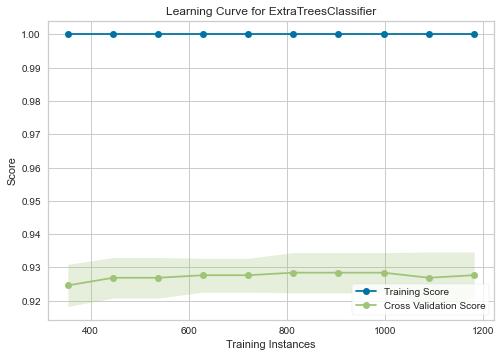

In [163]:
plot_model(et, plot = 'learning')


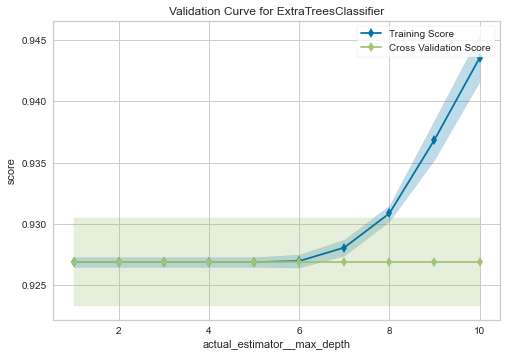

In [165]:
plot_model(et, plot = 'vc')


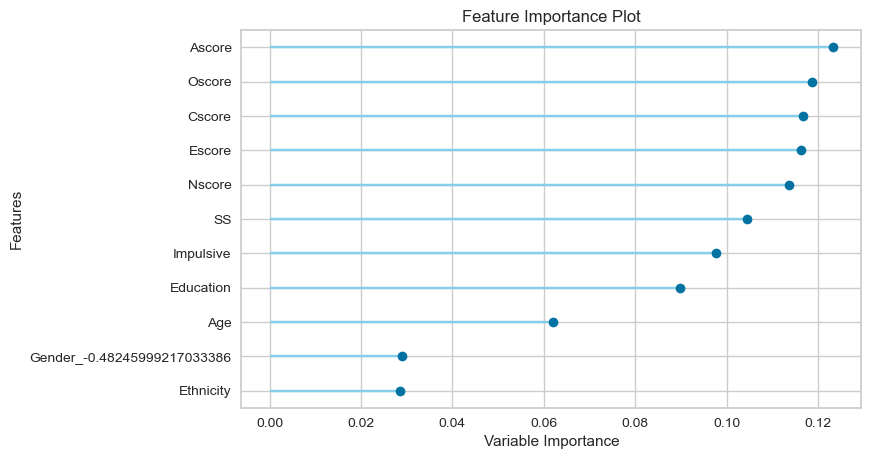

In [166]:
# feature importance
plot_model(et,plot='feature_all')

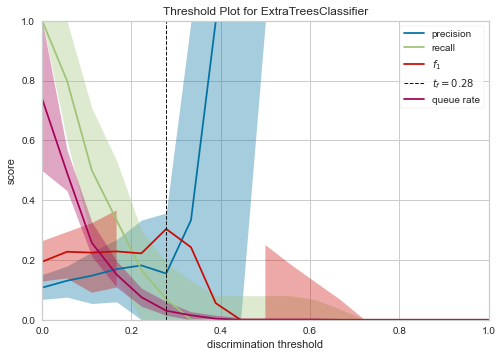

In [167]:
plot_model(et, plot = 'threshold')


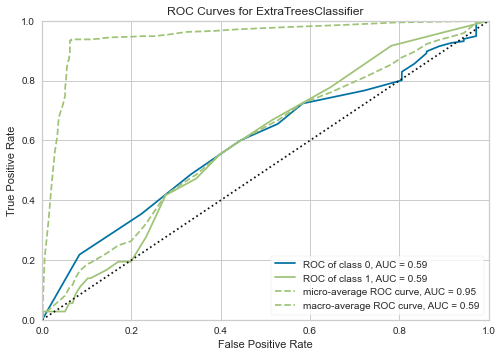

In [169]:
# AUC curve
plot_model(et, plot = 'auc')

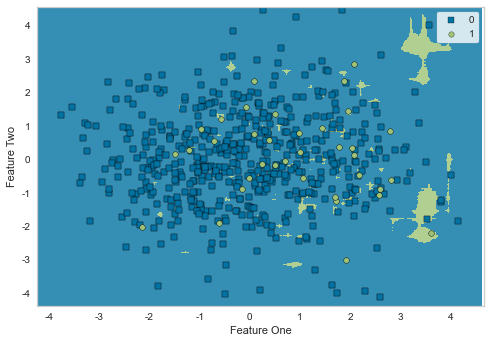

In [170]:
plot_model(et, plot = 'boundary')


## Benzos

In [173]:
X = df_binary1.iloc[:,0:12]
y = df_binary1.iloc[:,15]
data = pd.concat([X,y],axis=1)

In [175]:
data.iloc[:,-1]

ID
1       Non-user
2       Non-user
3       Non-user
4           User
5       Non-user
          ...   
1884    Non-user
1885    Non-user
1886        User
1887    Non-user
1888        User
Name: User_Benzos, Length: 1877, dtype: object

In [176]:
from pycaret.classification import *
setup_clf = setup(data=data, target = data.columns[-1],feature_selection=True)

,Description,Value
0,session_id,7691
1,Target,User_Benzos
2,Target Type,Binary
3,Label Encoded,"Non-user: 0, User: 1"
4,Original Data,"(1877, 13)"
5,Missing Values,False
6,Numeric Features,11
7,Categorical Features,1
8,Ordinal Features,False
9,High Cardinality Features,False


In [177]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.7456,0.7633,0.3725,0.5833,0.4484,0.2946,0.3103,0.0210
lda,Linear Discriminant Analysis,0.7456,0.7635,0.3998,0.5779,0.4653,0.3073,0.3200,0.0110
ridge,Ridge Classifier,0.7433,0.0000,0.3535,0.5813,0.4333,0.2810,0.2989,0.0090
rf,Random Forest Classifier,0.7372,0.7510,0.3344,0.5639,0.4162,0.2605,0.2775,0.2470
ada,Ada Boost Classifier,0.7350,0.7452,0.3938,0.5329,0.4483,0.2818,0.2887,0.0510
et,Extra Trees Classifier,0.7334,0.7518,0.3455,0.5457,0.4193,0.2583,0.2716,0.2390
gbc,Gradient Boosting Classifier,0.7319,0.7491,0.3643,0.5358,0.4275,0.2629,0.2738,0.0850
qda,Quadratic Discriminant Analysis,0.7311,0.7414,0.4324,0.5304,0.4720,0.2954,0.3006,0.0150
knn,K Neighbors Classifier,0.7205,0.6688,0.3479,0.5031,0.4095,0.2350,0.2426,0.0560
lightgbm,Light Gradient Boosting Machine,0.7159,0.7299,0.3535,0.4986,0.4087,0.2304,0.2385,0.0450


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=7691, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [178]:
top5 = compare_models(sort='Accuracy',n_select=5)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.7456,0.7633,0.3725,0.5833,0.4484,0.2946,0.3103,0.0200
lda,Linear Discriminant Analysis,0.7456,0.7635,0.3998,0.5779,0.4653,0.3073,0.3200,0.0110
ridge,Ridge Classifier,0.7433,0.0000,0.3535,0.5813,0.4333,0.2810,0.2989,0.0240
rf,Random Forest Classifier,0.7372,0.7510,0.3344,0.5639,0.4162,0.2605,0.2775,0.2580
ada,Ada Boost Classifier,0.7350,0.7452,0.3938,0.5329,0.4483,0.2818,0.2887,0.0700
et,Extra Trees Classifier,0.7334,0.7518,0.3455,0.5457,0.4193,0.2583,0.2716,0.2450
gbc,Gradient Boosting Classifier,0.7319,0.7491,0.3643,0.5358,0.4275,0.2629,0.2738,0.0930
qda,Quadratic Discriminant Analysis,0.7311,0.7414,0.4324,0.5304,0.4720,0.2954,0.3006,0.0230
knn,K Neighbors Classifier,0.7205,0.6688,0.3479,0.5031,0.4095,0.2350,0.2426,0.0620
lightgbm,Light Gradient Boosting Machine,0.7159,0.7299,0.3535,0.4986,0.4087,0.2304,0.2385,0.0410


In [179]:
tuned_top5 = [tune_model(i) for i in top5]
blender_top5 = blend_models(estimator_list=tuned_top5)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.6970,0.0000,0.2973,0.4400,0.3548,0.1664,0.1719
1,0.7576,0.0000,0.3784,0.6087,0.4667,0.3207,0.3359
2,0.8030,0.0000,0.4054,0.7895,0.5357,0.4267,0.4648
3,0.7481,0.0000,0.5278,0.5429,0.5352,0.3625,0.3626
4,0.7710,0.0000,0.3056,0.6875,0.4231,0.3057,0.3448
5,0.7252,0.0000,0.2432,0.5294,0.3333,0.1891,0.2118
6,0.7328,0.0000,0.3243,0.5455,0.4068,0.2485,0.2625
7,0.7557,0.0000,0.3514,0.6190,0.4483,0.3064,0.3267
8,0.7557,0.0000,0.4595,0.5862,0.5152,0.3551,0.3598
9,0.7099,0.0000,0.4324,0.4848,0.4571,0.2601,0.2609


In [180]:
# 모델 최종 확정, 전체 데이터 학습
final_model = finalize_model(blender_top5)


In [181]:
# 테스트셋 predict
prediction = predict_model(final_model, data=data)


In [182]:
# metric 확인
check_metric(prediction[data.columns[-1]], prediction['Label'], metric = 'Accuracy')


0.7501

In [192]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7197,0.6996,0.3514,0.5000,0.4127,0.2359,0.2423
1,0.7576,0.8097,0.3784,0.6087,0.4667,0.3207,0.3359
2,0.7879,0.7869,0.3784,0.7368,0.5000,0.3826,0.4168
3,0.7252,0.7550,0.5000,0.5000,0.5000,0.3105,0.3105
4,0.7786,0.8383,0.3333,0.7059,0.4528,0.3357,0.3729
5,0.7252,0.7317,0.2432,0.5294,0.3333,0.1891,0.2118
6,0.7405,0.7832,0.3514,0.5652,0.4333,0.2767,0.2899
7,0.7405,0.7582,0.3243,0.5714,0.4138,0.2631,0.2805
8,0.7634,0.7642,0.4324,0.6154,0.5079,0.3584,0.3680
9,0.7176,0.7062,0.4324,0.5000,0.4638,0.2734,0.2747


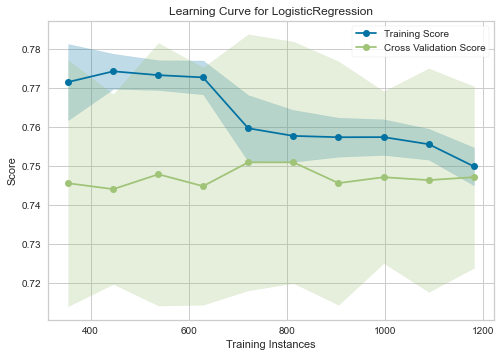

In [193]:
plot_model(lr, plot = 'learning')


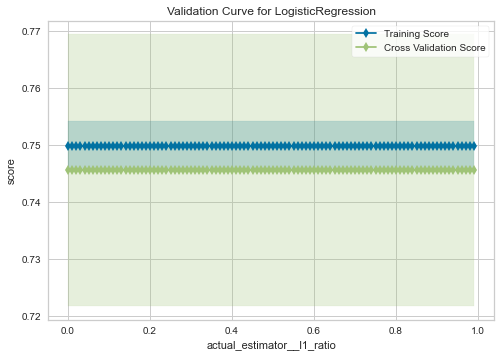

In [194]:
plot_model(lr, plot = 'vc')


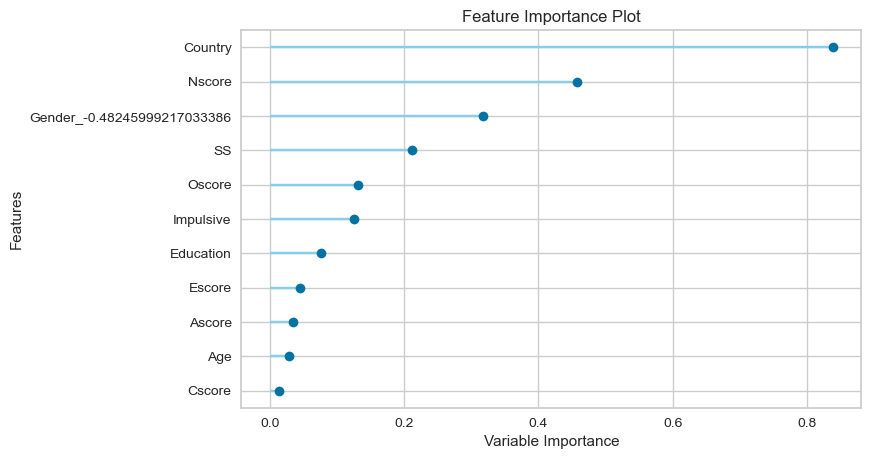

In [195]:
# feature importance
plot_model(lr,plot='feature_all')

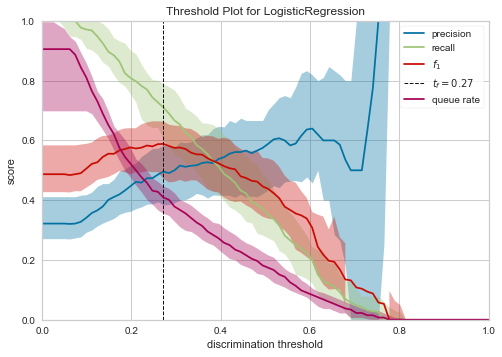

In [196]:
plot_model(lr, plot = 'threshold')


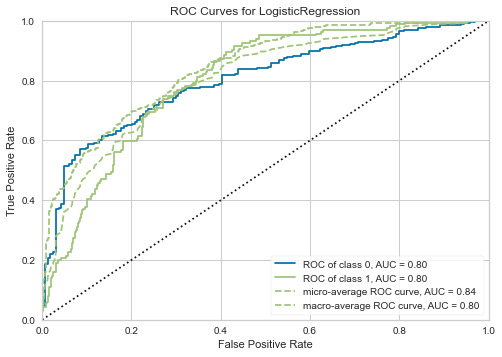

In [197]:
# AUC curve
plot_model(lr, plot = 'auc')

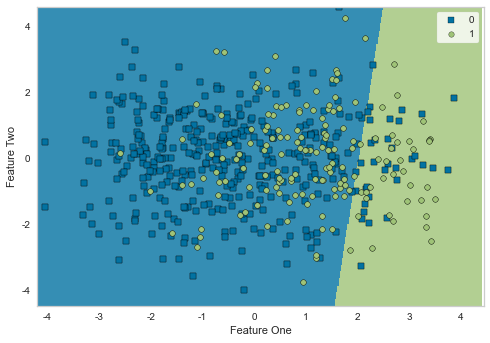

In [198]:
plot_model(lr, plot = 'boundary')


## Caff

In [199]:
X = df_binary1.iloc[:,0:12]
y = df_binary1.iloc[:,16]
data = pd.concat([X,y],axis=1)
data.iloc[:,-1]

ID
1       User
2       User
3       User
4       User
5       User
        ... 
1884    User
1885    User
1886    User
1887    User
1888    User
Name: User_Caff, Length: 1877, dtype: object

In [200]:
from pycaret.classification import *
setup_clf = setup(data=data, target = data.columns[-1],feature_selection=True)

,Description,Value
0,session_id,4154
1,Target,User_Caff
2,Target Type,Binary
3,Label Encoded,"Non-user: 0, User: 1"
4,Original Data,"(1877, 13)"
5,Missing Values,False
6,Numeric Features,11
7,Categorical Features,1
8,Ordinal Features,False
9,High Cardinality Features,False


In [201]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9642,0.6571,1.0000,0.9642,0.9818,0.0000,0.0000,0.0290
ridge,Ridge Classifier,0.9642,0.0000,1.0000,0.9642,0.9818,0.0000,0.0000,0.0260
rf,Random Forest Classifier,0.9642,0.5540,1.0000,0.9642,0.9818,0.0000,0.0000,0.2640
lda,Linear Discriminant Analysis,0.9642,0.6543,1.0000,0.9642,0.9818,0.0000,0.0000,0.0110
lightgbm,Light Gradient Boosting Machine,0.9642,0.5459,1.0000,0.9642,0.9818,0.0000,0.0000,0.0430
knn,K Neighbors Classifier,0.9634,0.5223,0.9992,0.9642,0.9814,-0.0012,-0.0016,0.0580
et,Extra Trees Classifier,0.9634,0.5643,0.9992,0.9642,0.9814,-0.0012,-0.0016,0.2250
svm,SVM - Linear Kernel,0.9619,0.0000,0.9976,0.9641,0.9806,-0.0038,-0.0051,0.0140
ada,Ada Boost Classifier,0.9574,0.5138,0.9929,0.9640,0.9782,-0.0099,-0.0118,0.0570
gbc,Gradient Boosting Classifier,0.9574,0.5253,0.9929,0.9640,0.9782,-0.0101,-0.0120,0.0950


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=4154, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [202]:
top5 = compare_models(sort='Accuracy',n_select=5)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9642,0.6571,1.0000,0.9642,0.9818,0.0000,0.0000,0.0300
ridge,Ridge Classifier,0.9642,0.0000,1.0000,0.9642,0.9818,0.0000,0.0000,0.0270
rf,Random Forest Classifier,0.9642,0.5540,1.0000,0.9642,0.9818,0.0000,0.0000,0.2660
lda,Linear Discriminant Analysis,0.9642,0.6543,1.0000,0.9642,0.9818,0.0000,0.0000,0.0120
lightgbm,Light Gradient Boosting Machine,0.9642,0.5459,1.0000,0.9642,0.9818,0.0000,0.0000,0.0510
knn,K Neighbors Classifier,0.9634,0.5223,0.9992,0.9642,0.9814,-0.0012,-0.0016,0.0590
et,Extra Trees Classifier,0.9634,0.5643,0.9992,0.9642,0.9814,-0.0012,-0.0016,0.2430
svm,SVM - Linear Kernel,0.9619,0.0000,0.9976,0.9641,0.9806,-0.0038,-0.0051,0.0150
ada,Ada Boost Classifier,0.9574,0.5138,0.9929,0.9640,0.9782,-0.0099,-0.0118,0.0660
gbc,Gradient Boosting Classifier,0.9574,0.5253,0.9929,0.9640,0.9782,-0.0101,-0.0120,0.1040


In [203]:
tuned_top5 = [tune_model(i) for i in top5]
blender_top5 = blend_models(estimator_list=tuned_top5)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9621,0.0000,1.0000,0.9621,0.9807,0.0000,0.0000
1,0.9621,0.0000,1.0000,0.9621,0.9807,0.0000,0.0000
2,0.9621,0.0000,1.0000,0.9621,0.9807,0.0000,0.0000
3,0.9695,0.0000,1.0000,0.9695,0.9845,0.0000,0.0000
4,0.9695,0.0000,1.0000,0.9695,0.9845,0.0000,0.0000
5,0.9695,0.0000,1.0000,0.9695,0.9845,0.0000,0.0000
6,0.9618,0.0000,1.0000,0.9618,0.9805,0.0000,0.0000
7,0.9618,0.0000,1.0000,0.9618,0.9805,0.0000,0.0000
8,0.9618,0.0000,1.0000,0.9618,0.9805,0.0000,0.0000
9,0.9618,0.0000,1.0000,0.9618,0.9805,0.0000,0.0000


In [206]:
# 모델 최종 확정, 전체 데이터 학습
final_model = finalize_model(blender_top5)
# 테스트셋 predict
prediction = predict_model(final_model, data=data)
# metric 확인
check_metric(prediction[data.columns[-1]], prediction['Label'], metric = 'Accuracy')



0.9675

In [207]:
ridge = create_model('ridge')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9621,0.0000,1.0000,0.9621,0.9807,0.0000,0.0000
1,0.9621,0.0000,1.0000,0.9621,0.9807,0.0000,0.0000
2,0.9621,0.0000,1.0000,0.9621,0.9807,0.0000,0.0000
3,0.9695,0.0000,1.0000,0.9695,0.9845,0.0000,0.0000
4,0.9695,0.0000,1.0000,0.9695,0.9845,0.0000,0.0000
5,0.9695,0.0000,1.0000,0.9695,0.9845,0.0000,0.0000
6,0.9618,0.0000,1.0000,0.9618,0.9805,0.0000,0.0000
7,0.9618,0.0000,1.0000,0.9618,0.9805,0.0000,0.0000
8,0.9618,0.0000,1.0000,0.9618,0.9805,0.0000,0.0000
9,0.9618,0.0000,1.0000,0.9618,0.9805,0.0000,0.0000


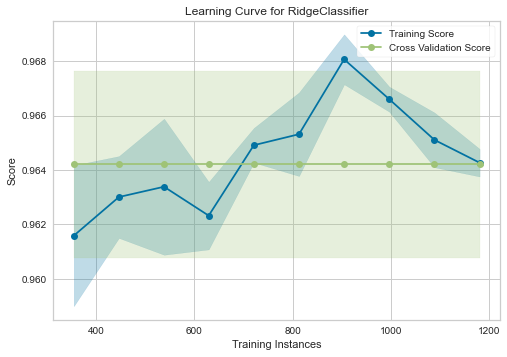

In [208]:
plot_model(ridge, plot = 'learning')


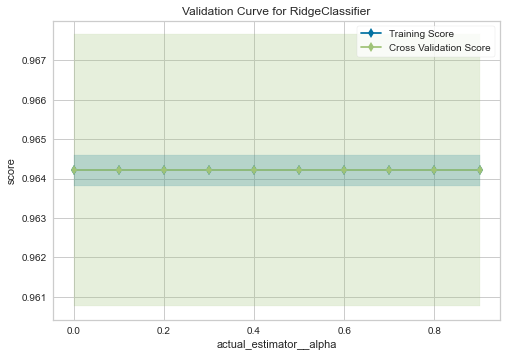

In [209]:
plot_model(ridge, plot = 'vc')


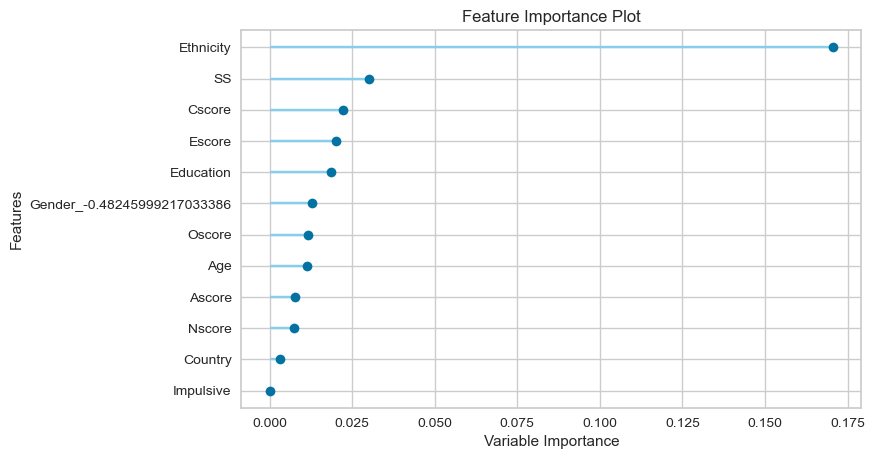

In [210]:
# feature importance
plot_model(ridge,plot='feature_all')

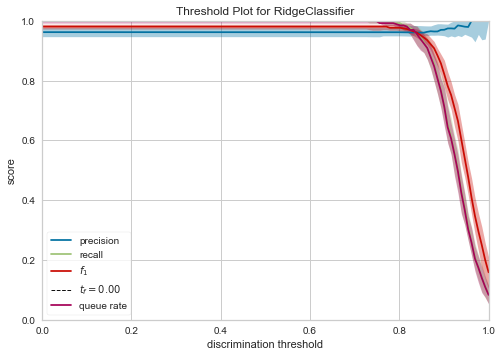

In [211]:
plot_model(ridge, plot = 'threshold')


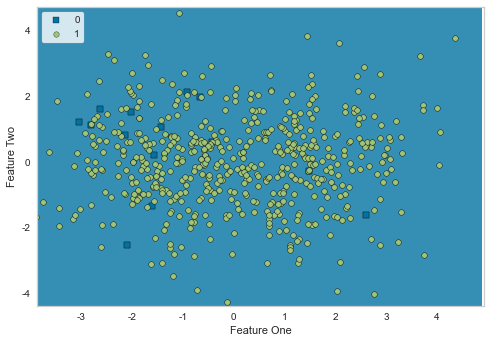

In [213]:
# AUC curve
plot_model(ridge, plot = 'boundary')

In [214]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9621,0.5937,1.0000,0.9621,0.9807,0.0000,0.0000
1,0.9621,0.7874,1.0000,0.9621,0.9807,0.0000,0.0000
2,0.9621,0.6598,1.0000,0.9621,0.9807,0.0000,0.0000
3,0.9695,0.7874,1.0000,0.9695,0.9845,0.0000,0.0000
4,0.9695,0.5453,1.0000,0.9695,0.9845,0.0000,0.0000
5,0.9695,0.6102,1.0000,0.9695,0.9845,0.0000,0.0000
6,0.9618,0.5222,1.0000,0.9618,0.9805,0.0000,0.0000
7,0.9618,0.7556,1.0000,0.9618,0.9805,0.0000,0.0000
8,0.9618,0.6540,1.0000,0.9618,0.9805,0.0000,0.0000
9,0.9618,0.6556,1.0000,0.9618,0.9805,0.0000,0.0000


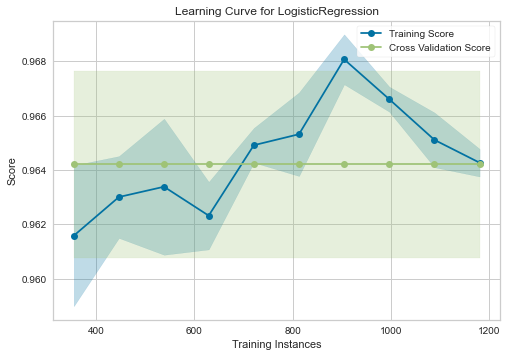

In [215]:
plot_model(lr, plot = 'learning')


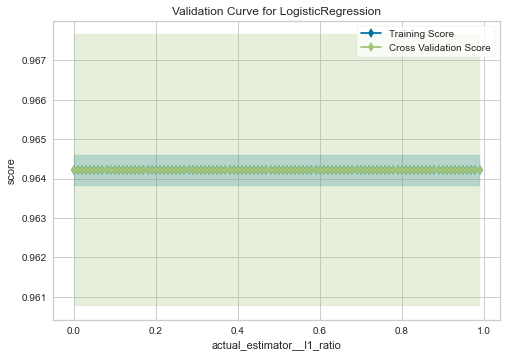

In [216]:
plot_model(lr, plot = 'vc')


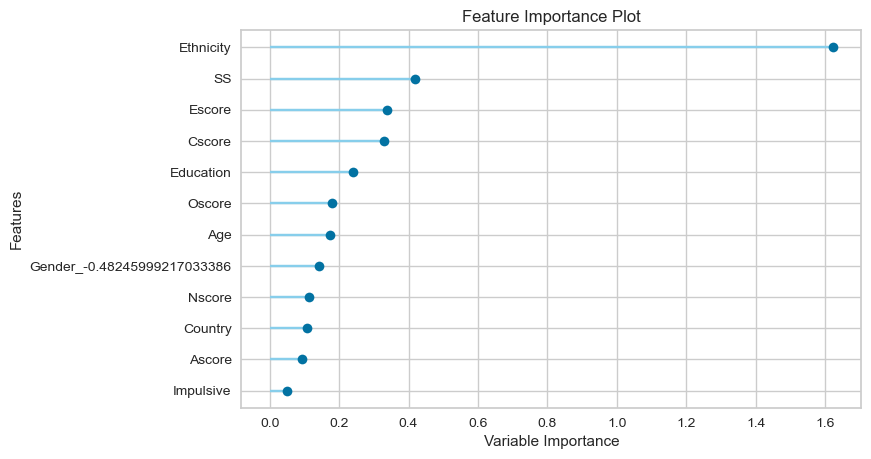

In [218]:
# feature importance
plot_model(lr,plot='feature_all')

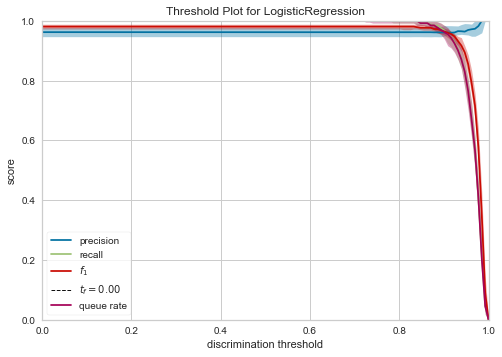

In [219]:
plot_model(lr, plot = 'threshold')

## Cannabis

In [221]:
X = df_binary1.iloc[:,0:12]
y = df_binary1.iloc[:,17]
data = pd.concat([X,y],axis=1)
data.iloc[:,-1]

ID
1       Non-user
2           User
3           User
4       Non-user
5           User
          ...   
1884        User
1885        User
1886        User
1887        User
1888        User
Name: User_Cannabis, Length: 1877, dtype: object

In [222]:
from pycaret.classification import *
setup_clf = setup(data=data, target = data.columns[-1],feature_selection=True)

,Description,Value
0,session_id,7189
1,Target,User_Cannabis
2,Target Type,Binary
3,Label Encoded,"Non-user: 0, User: 1"
4,Original Data,"(1877, 13)"
5,Missing Values,False
6,Numeric Features,11
7,Categorical Features,1
8,Ordinal Features,False
9,High Cardinality Features,False


In [223]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.8051,0.8840,0.8204,0.8144,0.8167,0.6085,0.6096,0.2680
ada,Ada Boost Classifier,0.8021,0.8799,0.7989,0.8247,0.8104,0.6034,0.6054,0.0590
et,Extra Trees Classifier,0.8013,0.8775,0.8075,0.8172,0.8118,0.6013,0.6021,0.2310
lr,Logistic Regression,0.8005,0.8856,0.7930,0.8257,0.8081,0.6004,0.6024,0.0240
ridge,Ridge Classifier,0.7997,0.0000,0.7744,0.8359,0.8035,0.5999,0.6024,0.0280
lda,Linear Discriminant Analysis,0.7990,0.8860,0.7744,0.8347,0.8029,0.5983,0.6008,0.0100
gbc,Gradient Boosting Classifier,0.7967,0.8757,0.8046,0.8112,0.8074,0.5921,0.5929,0.0960
nb,Naive Bayes,0.7929,0.8724,0.7859,0.8178,0.8007,0.5852,0.5870,0.0200
knn,K Neighbors Classifier,0.7906,0.8483,0.7916,0.8107,0.8005,0.5801,0.5811,0.0580
lightgbm,Light Gradient Boosting Machine,0.7898,0.8639,0.8031,0.8019,0.8021,0.5780,0.5786,0.0470


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=7189, verbose=0,
                       warm_start=False)

In [224]:
top5 = compare_models(sort='Accuracy',n_select=5)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.8051,0.8840,0.8204,0.8144,0.8167,0.6085,0.6096,0.2590
ada,Ada Boost Classifier,0.8021,0.8799,0.7989,0.8247,0.8104,0.6034,0.6054,0.0700
et,Extra Trees Classifier,0.8013,0.8775,0.8075,0.8172,0.8118,0.6013,0.6021,0.2610
lr,Logistic Regression,0.8005,0.8856,0.7930,0.8257,0.8081,0.6004,0.6024,0.0240
ridge,Ridge Classifier,0.7997,0.0000,0.7744,0.8359,0.8035,0.5999,0.6024,0.0090
lda,Linear Discriminant Analysis,0.7990,0.8860,0.7744,0.8347,0.8029,0.5983,0.6008,0.0130
gbc,Gradient Boosting Classifier,0.7967,0.8757,0.8046,0.8112,0.8074,0.5921,0.5929,0.1050
nb,Naive Bayes,0.7929,0.8724,0.7859,0.8178,0.8007,0.5852,0.5870,0.0210
knn,K Neighbors Classifier,0.7906,0.8483,0.7916,0.8107,0.8005,0.5801,0.5811,0.0600
lightgbm,Light Gradient Boosting Machine,0.7898,0.8639,0.8031,0.8019,0.8021,0.5780,0.5786,0.0450


In [225]:
tuned_top5 = [tune_model(i) for i in top5]
blender_top5 = blend_models(estimator_list=tuned_top5)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8106,0.0000,0.8000,0.8358,0.8175,0.6209,0.6215
1,0.7803,0.0000,0.8429,0.7662,0.8027,0.5561,0.5593
2,0.7576,0.0000,0.7286,0.7969,0.7612,0.5160,0.5182
3,0.8092,0.0000,0.8261,0.8143,0.8201,0.6169,0.6170
4,0.8015,0.0000,0.7826,0.8308,0.8060,0.6032,0.6043
5,0.8092,0.0000,0.7826,0.8438,0.8120,0.6188,0.6206
6,0.8626,0.0000,0.8551,0.8806,0.8676,0.7249,0.7252
7,0.8321,0.0000,0.8429,0.8429,0.8429,0.6625,0.6625
8,0.7786,0.0000,0.7714,0.8060,0.7883,0.5566,0.5571
9,0.8473,0.0000,0.8714,0.8472,0.8592,0.6926,0.6929


In [226]:
# 모델 최종 확정, 전체 데이터 학습
final_model = finalize_model(blender_top5)
# 테스트셋 predict
prediction = predict_model(final_model, data=data)
# metric 확인
check_metric(prediction[data.columns[-1]], prediction['Label'], metric = 'Accuracy')



0.8284

In [227]:
rf= create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8030,0.8692,0.8286,0.8056,0.8169,0.6039,0.6042
1,0.7652,0.8221,0.8286,0.7532,0.7891,0.5255,0.5286
2,0.7803,0.8865,0.7714,0.8060,0.7883,0.5602,0.5608
3,0.8168,0.8787,0.8551,0.8082,0.8310,0.6313,0.6325
4,0.8015,0.8664,0.7826,0.8308,0.8060,0.6032,0.6043
5,0.7939,0.8947,0.7681,0.8281,0.7970,0.5883,0.5900
6,0.8550,0.9135,0.8696,0.8571,0.8633,0.7089,0.7089
7,0.8015,0.8988,0.8571,0.7895,0.8219,0.5986,0.6012
8,0.7939,0.9000,0.7857,0.8209,0.8029,0.5871,0.5878
9,0.8397,0.9097,0.8571,0.8451,0.8511,0.6775,0.6776


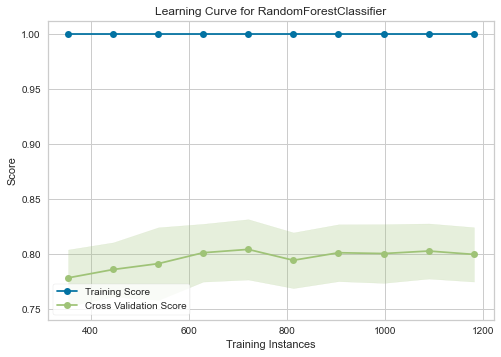

In [228]:
plot_model(rf, plot = 'learning')


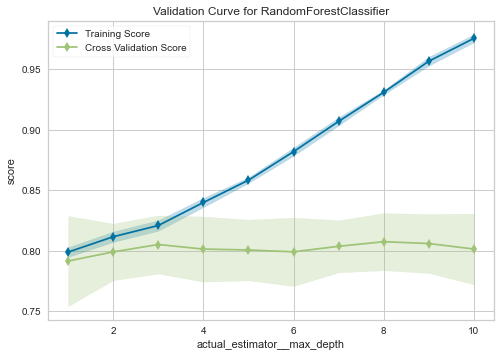

In [229]:
plot_model(rf, plot = 'vc')


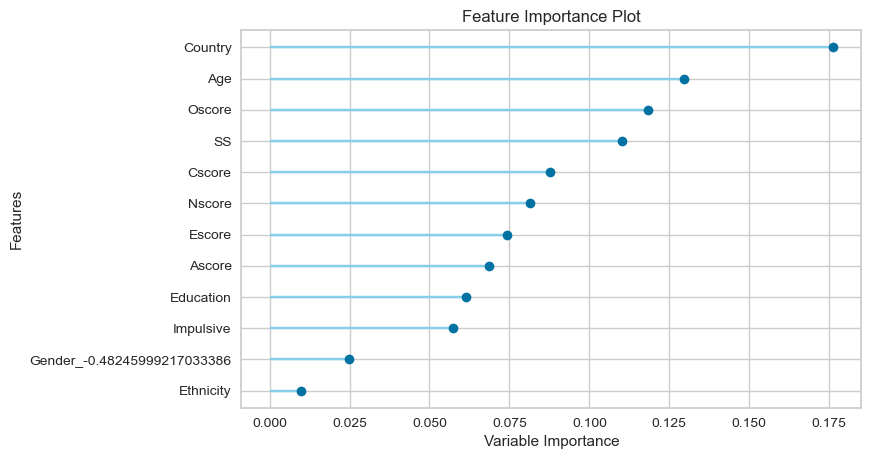

In [230]:
# feature importance
plot_model(rf,plot='feature_all')

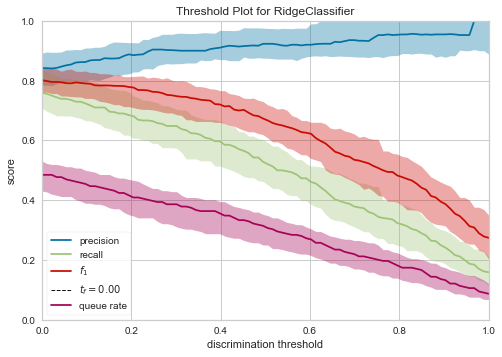

In [231]:

plot_model(ridge,plot='threshold')

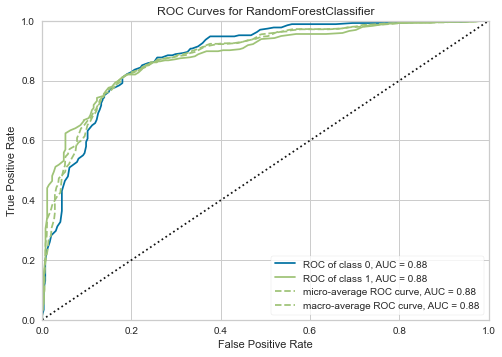

In [236]:
# AUC curve
plot_model(rf, plot = 'auc')

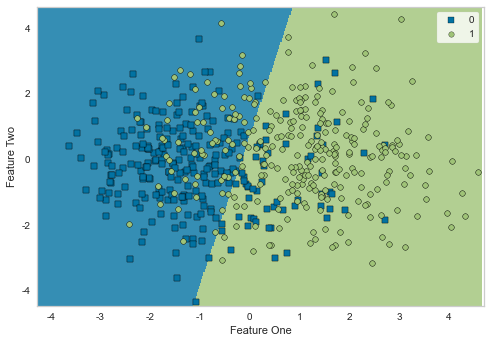

In [237]:

plot_model(ridge, plot = 'boundary')

## Choco

In [238]:
X = df_binary1.iloc[:,0:12]
y = df_binary1.iloc[:,18]
data = pd.concat([X,y],axis=1)
data.iloc[:,-1]

ID
1       User
2       User
3       User
4       User
5       User
        ... 
1884    User
1885    User
1886    User
1887    User
1888    User
Name: User_Choc, Length: 1877, dtype: object

In [239]:
from pycaret.classification import *
setup_clf = setup(data=data, target = data.columns[-1],feature_selection=True)

,Description,Value
0,session_id,6956
1,Target,User_Choc
2,Target Type,Binary
3,Label Encoded,"Non-user: 0, User: 1"
4,Original Data,"(1877, 13)"
5,Missing Values,False
6,Numeric Features,11
7,Categorical Features,1
8,Ordinal Features,False
9,High Cardinality Features,False


In [240]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9741,0.6217,1.0000,0.9741,0.9869,0.0000,0.0000,0.0280
ridge,Ridge Classifier,0.9741,0.0000,1.0000,0.9741,0.9869,0.0000,0.0000,0.0340
rf,Random Forest Classifier,0.9741,0.7167,1.0000,0.9741,0.9869,0.0000,0.0000,0.2760
lda,Linear Discriminant Analysis,0.9741,0.6220,1.0000,0.9741,0.9869,0.0000,0.0000,0.0090
et,Extra Trees Classifier,0.9741,0.6917,0.9992,0.9748,0.9869,0.0381,0.0481,0.2390
knn,K Neighbors Classifier,0.9726,0.6621,0.9984,0.9741,0.9861,-0.0019,-0.0019,0.0560
svm,SVM - Linear Kernel,0.9726,0.0000,0.9984,0.9741,0.9861,-0.0021,-0.0022,0.0180
lightgbm,Light Gradient Boosting Machine,0.9718,0.6709,0.9977,0.9741,0.9857,-0.0032,-0.0035,0.0440
ada,Ada Boost Classifier,0.9695,0.5483,0.9953,0.9740,0.9845,-0.0056,-0.0059,0.0740
gbc,Gradient Boosting Classifier,0.9673,0.5992,0.9930,0.9739,0.9833,-0.0092,-0.0103,0.1000


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=6956, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [241]:
top5 = compare_models(sort='Accuracy',n_select=5)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9741,0.6217,1.0000,0.9741,0.9869,0.0000,0.0000,0.0250
ridge,Ridge Classifier,0.9741,0.0000,1.0000,0.9741,0.9869,0.0000,0.0000,0.0130
rf,Random Forest Classifier,0.9741,0.7167,1.0000,0.9741,0.9869,0.0000,0.0000,0.2610
lda,Linear Discriminant Analysis,0.9741,0.6220,1.0000,0.9741,0.9869,0.0000,0.0000,0.0120
et,Extra Trees Classifier,0.9741,0.6917,0.9992,0.9748,0.9869,0.0381,0.0481,0.2300
knn,K Neighbors Classifier,0.9726,0.6621,0.9984,0.9741,0.9861,-0.0019,-0.0019,0.0610
svm,SVM - Linear Kernel,0.9726,0.0000,0.9984,0.9741,0.9861,-0.0021,-0.0022,0.0120
lightgbm,Light Gradient Boosting Machine,0.9718,0.6709,0.9977,0.9741,0.9857,-0.0032,-0.0035,0.0560
ada,Ada Boost Classifier,0.9695,0.5483,0.9953,0.9740,0.9845,-0.0056,-0.0059,0.0710
gbc,Gradient Boosting Classifier,0.9673,0.5992,0.9930,0.9739,0.9833,-0.0092,-0.0103,0.0970


In [242]:
tuned_top5 = [tune_model(i) for i in top5]
blender_top5 = blend_models(estimator_list=tuned_top5)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9697,0.0000,1.0000,0.9697,0.9846,0.0000,0.0000
1,0.9697,0.0000,1.0000,0.9697,0.9846,0.0000,0.0000
2,0.9697,0.0000,1.0000,0.9697,0.9846,0.0000,0.0000
3,0.9771,0.0000,1.0000,0.9771,0.9884,0.0000,0.0000
4,0.9771,0.0000,1.0000,0.9771,0.9884,0.0000,0.0000
5,0.9771,0.0000,1.0000,0.9771,0.9884,0.0000,0.0000
6,0.9771,0.0000,1.0000,0.9771,0.9884,0.0000,0.0000
7,0.9771,0.0000,1.0000,0.9771,0.9884,0.0000,0.0000
8,0.9771,0.0000,1.0000,0.9771,0.9884,0.0000,0.0000
9,0.9695,0.0000,1.0000,0.9695,0.9845,0.0000,0.0000


In [243]:
# 모델 최종 확정, 전체 데이터 학습
final_model = finalize_model(blender_top5)
# 테스트셋 predict
prediction = predict_model(final_model, data=data)
# metric 확인
check_metric(prediction[data.columns[-1]], prediction['Label'], metric = 'Accuracy')



0.9766

In [244]:
rf= create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9697,0.7822,1.0000,0.9697,0.9846,0.0000,0.0000
1,0.9697,0.6943,1.0000,0.9697,0.9846,0.0000,0.0000
2,0.9697,0.8047,1.0000,0.9697,0.9846,0.0000,0.0000
3,0.9771,0.6641,1.0000,0.9771,0.9884,0.0000,0.0000
4,0.9771,0.8229,1.0000,0.9771,0.9884,0.0000,0.0000
5,0.9771,0.8542,1.0000,0.9771,0.9884,0.0000,0.0000
6,0.9771,0.7122,1.0000,0.9771,0.9884,0.0000,0.0000
7,0.9771,0.6979,1.0000,0.9771,0.9884,0.0000,0.0000
8,0.9771,0.6875,1.0000,0.9771,0.9884,0.0000,0.0000
9,0.9695,0.4469,1.0000,0.9695,0.9845,0.0000,0.0000


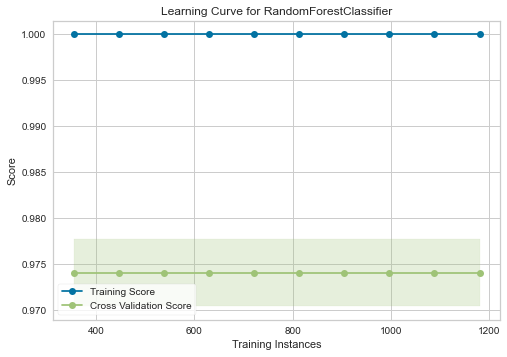

In [245]:
plot_model(rf, plot = 'learning')


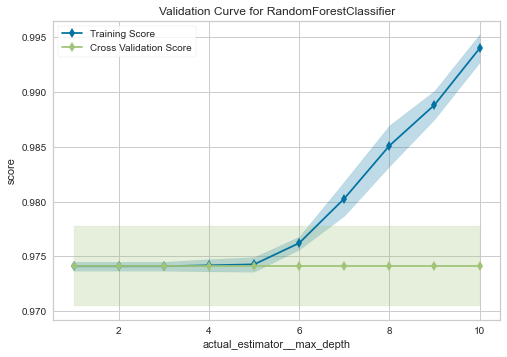

In [246]:
plot_model(rf, plot = 'vc')


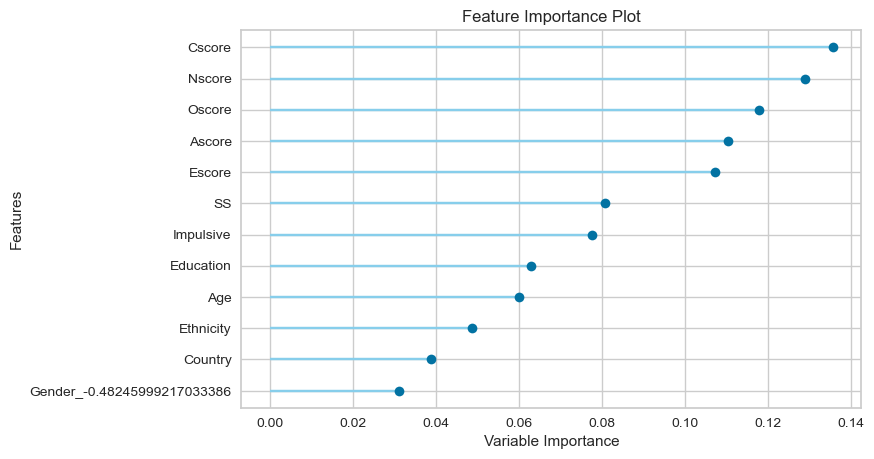

In [247]:
# feature importance
plot_model(rf,plot='feature_all')

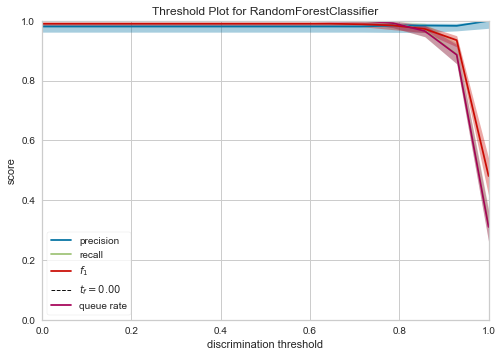

In [250]:

plot_model(rf,plot='threshold')

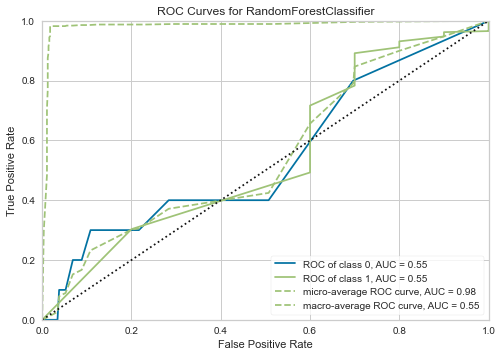

In [249]:

plot_model(rf,plot='auc')

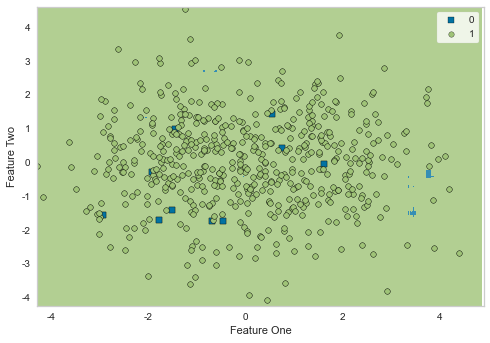

In [251]:

plot_model(rf, plot = 'boundary')

## Coke

In [253]:
X = df_binary1.iloc[:,0:12]
y = df_binary1.iloc[:,19]
data = pd.concat([X,y],axis=1)
data.iloc[:,-1]

ID
1       Non-user
2           User
3       Non-user
4       Non-user
5       Non-user
          ...   
1884    Non-user
1885    Non-user
1886        User
1887    Non-user
1888        User
Name: User_Coke, Length: 1877, dtype: object

In [254]:
from pycaret.classification import *
setup_clf = setup(data=data, target = data.columns[-1],feature_selection=True)

,Description,Value
0,session_id,5650
1,Target,User_Coke
2,Target Type,Binary
3,Label Encoded,"Non-user: 0, User: 1"
4,Original Data,"(1877, 13)"
5,Missing Values,False
6,Numeric Features,11
7,Categorical Features,1
8,Ordinal Features,False
9,High Cardinality Features,False


In [255]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
ridge,Ridge Classifier,0.7867,0.0000,0.0780,0.6233,0.1345,0.0847,0.1505,0.0100
rf,Random Forest Classifier,0.7784,0.7417,0.1670,0.4682,0.2436,0.1465,0.1748,0.2930
lr,Logistic Regression,0.7776,0.7558,0.1667,0.4601,0.2386,0.1426,0.1700,1.8560
lda,Linear Discriminant Analysis,0.7746,0.7562,0.1881,0.4463,0.2581,0.1530,0.1750,0.0140
ada,Ada Boost Classifier,0.7662,0.7142,0.2023,0.4137,0.2665,0.1488,0.1639,0.0980
gbc,Gradient Boosting Classifier,0.7639,0.7105,0.1669,0.3924,0.2314,0.1186,0.1350,0.1040
et,Extra Trees Classifier,0.7639,0.7318,0.1137,0.3627,0.1699,0.0738,0.0928,0.2740
qda,Quadratic Discriminant Analysis,0.7563,0.7331,0.2730,0.4025,0.3213,0.1810,0.1876,0.0250
lightgbm,Light Gradient Boosting Machine,0.7548,0.7187,0.2200,0.3750,0.2753,0.1416,0.1489,0.0740
knn,K Neighbors Classifier,0.7518,0.6955,0.2415,0.3843,0.2936,0.1531,0.1605,0.0800


RidgeClassifier(alpha=1.0, class_weight=None, copy_X=True, fit_intercept=True,
                max_iter=None, normalize=False, random_state=5650,
                solver='auto', tol=0.001)

In [256]:
top5 = compare_models(sort='Accuracy',n_select=5)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
ridge,Ridge Classifier,0.7867,0.0000,0.0780,0.6233,0.1345,0.0847,0.1505,0.0140
rf,Random Forest Classifier,0.7784,0.7417,0.1670,0.4682,0.2436,0.1465,0.1748,0.3230
lr,Logistic Regression,0.7776,0.7558,0.1667,0.4601,0.2386,0.1426,0.1700,0.0250
lda,Linear Discriminant Analysis,0.7746,0.7562,0.1881,0.4463,0.2581,0.1530,0.1750,0.0090
ada,Ada Boost Classifier,0.7662,0.7142,0.2023,0.4137,0.2665,0.1488,0.1639,0.0680
gbc,Gradient Boosting Classifier,0.7639,0.7105,0.1669,0.3924,0.2314,0.1186,0.1350,0.0890
et,Extra Trees Classifier,0.7639,0.7318,0.1137,0.3627,0.1699,0.0738,0.0928,0.2340
qda,Quadratic Discriminant Analysis,0.7563,0.7331,0.2730,0.4025,0.3213,0.1810,0.1876,0.0160
lightgbm,Light Gradient Boosting Machine,0.7548,0.7187,0.2200,0.3750,0.2753,0.1416,0.1489,0.0450
knn,K Neighbors Classifier,0.7518,0.6955,0.2415,0.3843,0.2936,0.1531,0.1605,0.0690


In [257]:
tuned_top5 = [tune_model(i) for i in top5]
blender_top5 = blend_models(estimator_list=tuned_top5)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7879,0.0000,0.0690,0.6667,0.1250,0.0874,0.1646
1,0.8030,0.0000,0.1034,1.0000,0.1875,0.1526,0.2874
2,0.7955,0.0000,0.0357,1.0000,0.0690,0.0551,0.1684
3,0.7786,0.0000,0.0714,0.4000,0.1212,0.0604,0.0905
4,0.7863,0.0000,0.0714,0.5000,0.1250,0.0756,0.1239
5,0.7863,0.0000,0.1429,0.5000,0.2222,0.1406,0.1781
6,0.7557,0.0000,0.0357,0.1667,0.0588,-0.0180,-0.0252
7,0.7786,0.0000,0.0714,0.4000,0.1212,0.0604,0.0905
8,0.7939,0.0000,0.1071,0.6000,0.1818,0.1252,0.1877
9,0.8015,0.0000,0.0714,1.0000,0.1333,0.1079,0.2388


In [258]:
# 모델 최종 확정, 전체 데이터 학습
final_model = finalize_model(blender_top5)
# 테스트셋 predict
prediction = predict_model(final_model, data=data)
# metric 확인
check_metric(prediction[data.columns[-1]], prediction['Label'], metric = 'Accuracy')



0.7874

In [259]:
rg= create_model('ridge')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7879,0.0000,0.0690,0.6667,0.1250,0.0874,0.1646
1,0.8030,0.0000,0.1034,1.0000,0.1875,0.1526,0.2874
2,0.7955,0.0000,0.0357,1.0000,0.0690,0.0551,0.1684
3,0.7786,0.0000,0.0714,0.4000,0.1212,0.0604,0.0905
4,0.7863,0.0000,0.0714,0.5000,0.1250,0.0756,0.1239
5,0.7863,0.0000,0.1429,0.5000,0.2222,0.1406,0.1781
6,0.7557,0.0000,0.0357,0.1667,0.0588,-0.0180,-0.0252
7,0.7786,0.0000,0.0714,0.4000,0.1212,0.0604,0.0905
8,0.7939,0.0000,0.1071,0.6000,0.1818,0.1252,0.1877
9,0.8015,0.0000,0.0714,1.0000,0.1333,0.1079,0.2388


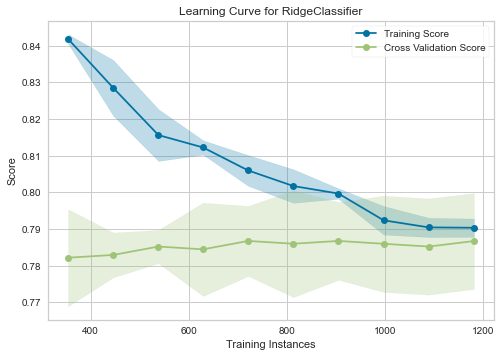

In [260]:
plot_model(rg, plot = 'learning')


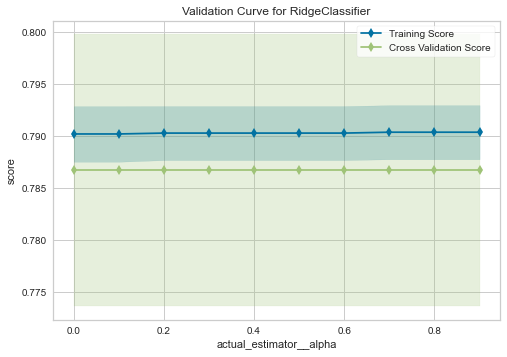

In [261]:
plot_model(rg, plot = 'vc')


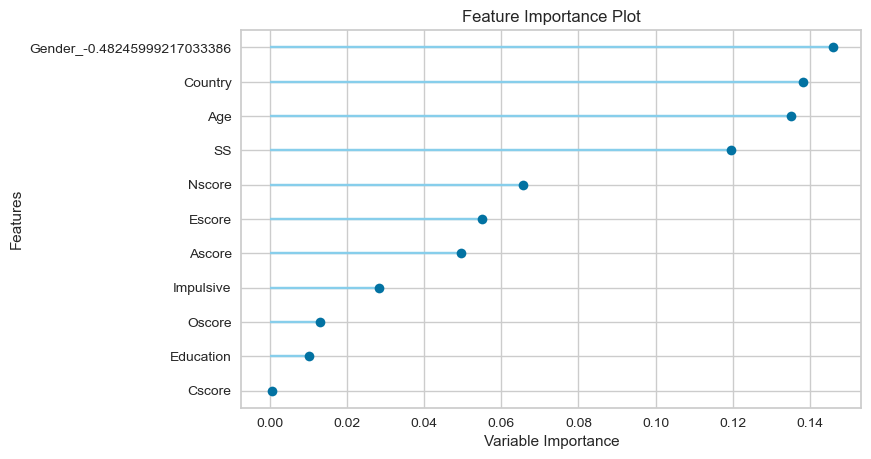

In [262]:
# feature importance
plot_model(rg,plot='feature_all')

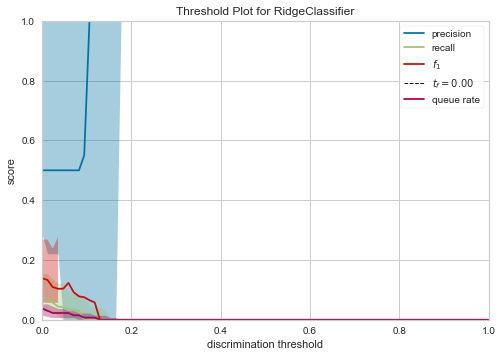

In [263]:

plot_model(rg,plot='threshold')

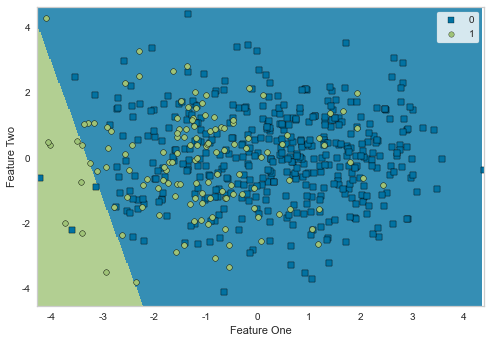

In [265]:

plot_model(rg,plot='boundary')

## Crack

In [266]:
X = df_binary1.iloc[:,0:12]
y = df_binary1.iloc[:,20]
data = pd.concat([X,y],axis=1)
data.iloc[:,-1]

ID
1       Non-user
2       Non-user
3       Non-user
4       Non-user
5       Non-user
          ...   
1884    Non-user
1885    Non-user
1886    Non-user
1887    Non-user
1888    Non-user
Name: User_Crack, Length: 1877, dtype: object

In [267]:
from pycaret.classification import *
setup_clf = setup(data=data, target = data.columns[-1],feature_selection=True)

,Description,Value
0,session_id,4078
1,Target,User_Crack
2,Target Type,Binary
3,Label Encoded,"Non-user: 0, User: 1"
4,Original Data,"(1877, 13)"
5,Missing Values,False
6,Numeric Features,11
7,Categorical Features,1
8,Ordinal Features,False
9,High Cardinality Features,False


In [268]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.9657,0.7812,0.0200,0.1000,0.0333,0.0325,0.0440,0.2470
lr,Logistic Regression,0.9650,0.7839,0.0000,0.0000,0.0000,0.0000,0.0000,0.2720
ridge,Ridge Classifier,0.9650,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0130
rf,Random Forest Classifier,0.9650,0.7968,0.0000,0.0000,0.0000,0.0000,0.0000,0.2600
lda,Linear Discriminant Analysis,0.9650,0.7777,0.0000,0.0000,0.0000,0.0000,0.0000,0.0150
gbc,Gradient Boosting Classifier,0.9635,0.7760,0.0450,0.1000,0.0619,0.0564,0.0607,0.1240
knn,K Neighbors Classifier,0.9634,0.5982,0.0250,0.1000,0.0400,0.0358,0.0454,1.0210
qda,Quadratic Discriminant Analysis,0.9619,0.7217,0.0000,0.0000,0.0000,-0.0046,-0.0055,0.0370
lightgbm,Light Gradient Boosting Machine,0.9619,0.7963,0.0250,0.0500,0.0333,0.0269,0.0272,0.0560
svm,SVM - Linear Kernel,0.9581,0.0000,0.0250,0.1000,0.0400,0.0296,0.0393,0.0160


ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=4078, verbose=0,
                     warm_start=False)

In [269]:
top5 = compare_models(sort='Accuracy',n_select=5)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.9657,0.7812,0.0200,0.1000,0.0333,0.0325,0.0440,0.2450
lr,Logistic Regression,0.9650,0.7839,0.0000,0.0000,0.0000,0.0000,0.0000,0.0350
ridge,Ridge Classifier,0.9650,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0110
rf,Random Forest Classifier,0.9650,0.7968,0.0000,0.0000,0.0000,0.0000,0.0000,0.2800
lda,Linear Discriminant Analysis,0.9650,0.7777,0.0000,0.0000,0.0000,0.0000,0.0000,0.0150
gbc,Gradient Boosting Classifier,0.9635,0.7760,0.0450,0.1000,0.0619,0.0564,0.0607,0.1370
knn,K Neighbors Classifier,0.9634,0.5982,0.0250,0.1000,0.0400,0.0358,0.0454,0.0610
qda,Quadratic Discriminant Analysis,0.9619,0.7217,0.0000,0.0000,0.0000,-0.0046,-0.0055,0.0240
lightgbm,Light Gradient Boosting Machine,0.9619,0.7963,0.0250,0.0500,0.0333,0.0269,0.0272,0.0530
svm,SVM - Linear Kernel,0.9581,0.0000,0.0250,0.1000,0.0400,0.0296,0.0393,0.0470


In [270]:
tuned_top5 = [tune_model(i) for i in top5]
blender_top5 = blend_models(estimator_list=tuned_top5)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9621,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.9621,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.9621,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.9695,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.9695,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.9695,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.9695,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.9618,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.9618,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
9,0.9618,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


In [271]:
# 모델 최종 확정, 전체 데이터 학습
final_model = finalize_model(blender_top5)
# 테스트셋 predict
prediction = predict_model(final_model, data=data)
# metric 확인
check_metric(prediction[data.columns[-1]], prediction['Label'], metric = 'Accuracy')



0.9579

In [272]:
et= create_model('et')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9621,0.5890,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.9621,0.6283,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.9621,0.6646,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.9695,0.8996,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.9695,0.8720,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.9695,0.7874,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.9695,0.7667,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.9618,0.8556,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.9618,0.8619,0.0000,0.0000,0.0000,0.0000,0.0000
9,0.9695,0.8865,0.2000,1.0000,0.3333,0.3247,0.4403


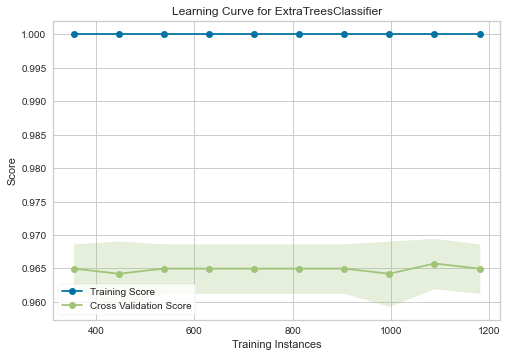

In [273]:
plot_model(et, plot = 'learning')


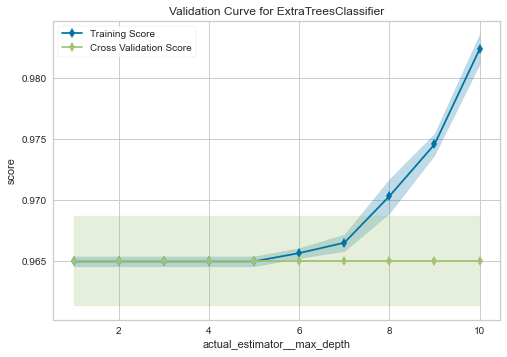

In [274]:
plot_model(et, plot = 'vc')


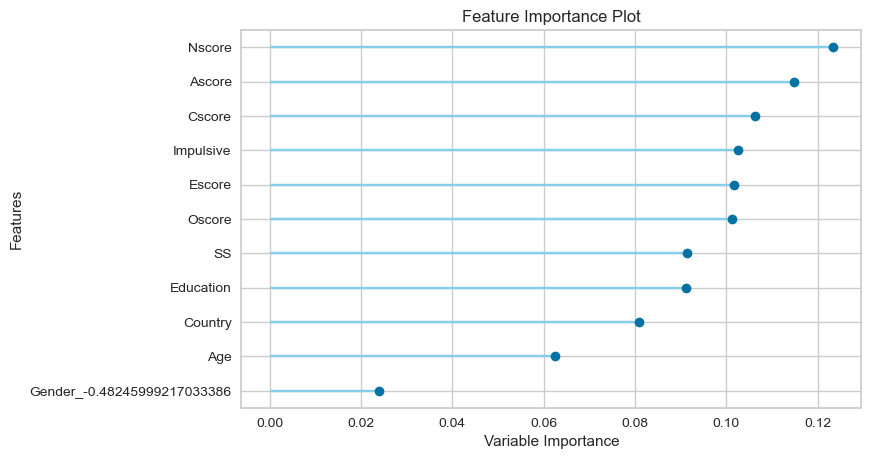

In [276]:
# feature importance
plot_model(et,plot='feature_all')

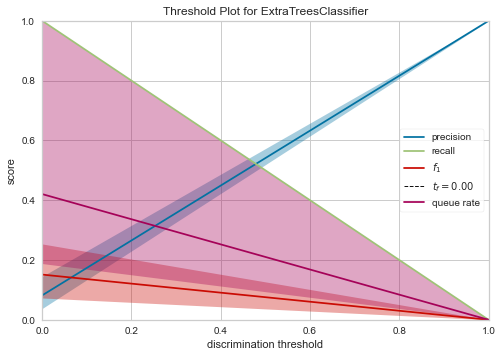

In [277]:

plot_model(et,plot='threshold')

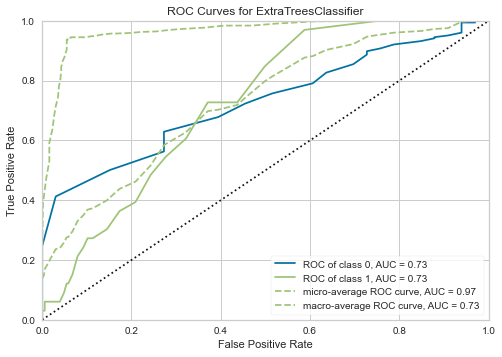

In [278]:

plot_model(et,plot='auc')

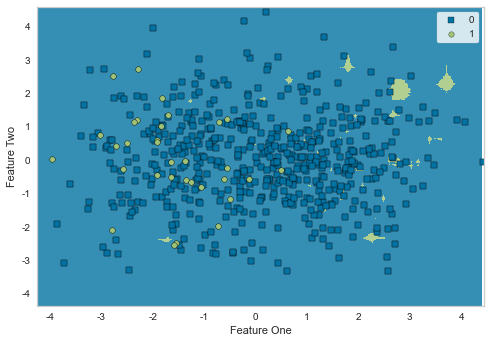

In [280]:

plot_model(et,plot='boundary')

## Ecstasy

In [281]:
X = df_binary1.iloc[:,0:12]
y = df_binary1.iloc[:,21]
data = pd.concat([X,y],axis=1)
data.iloc[:,-1]

ID
1       Non-user
2           User
3       Non-user
4       Non-user
5       Non-user
          ...   
1884    Non-user
1885    Non-user
1886        User
1887        User
1888        User
Name: User_Ecstasy, Length: 1877, dtype: object

In [282]:
from pycaret.classification import *
setup_clf = setup(data=data, target = data.columns[-1],feature_selection=True)

,Description,Value
0,session_id,758
1,Target,User_Ecstasy
2,Target Type,Binary
3,Label Encoded,"Non-user: 0, User: 1"
4,Original Data,"(1877, 13)"
5,Missing Values,False
6,Numeric Features,11
7,Categorical Features,1
8,Ordinal Features,False
9,High Cardinality Features,False


In [283]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lda,Linear Discriminant Analysis,0.7738,0.8212,0.5127,0.6166,0.5577,0.4080,0.4124,0.0090
lr,Logistic Regression,0.7730,0.8214,0.4909,0.6196,0.5460,0.3979,0.4037,0.0300
ridge,Ridge Classifier,0.7723,0.0000,0.4638,0.6272,0.5303,0.3853,0.3945,0.0240
gbc,Gradient Boosting Classifier,0.7684,0.8171,0.5176,0.6027,0.5550,0.4001,0.4034,0.0820
ada,Ada Boost Classifier,0.7677,0.8055,0.5262,0.5960,0.5567,0.4008,0.4035,0.0760
rf,Random Forest Classifier,0.7669,0.8206,0.4746,0.6059,0.5298,0.3788,0.3851,0.2550
qda,Quadratic Discriminant Analysis,0.7661,0.8107,0.5939,0.5825,0.5850,0.4229,0.4252,0.0260
nb,Naive Bayes,0.7631,0.8156,0.6869,0.5648,0.6189,0.4498,0.4550,0.0280
lightgbm,Light Gradient Boosting Machine,0.7600,0.8063,0.4983,0.5823,0.5351,0.3753,0.3784,0.0490
et,Extra Trees Classifier,0.7509,0.8151,0.4691,0.5647,0.5107,0.3463,0.3499,0.2470


LinearDiscriminantAnalysis(n_components=None, priors=None, shrinkage=None,
                           solver='svd', store_covariance=False, tol=0.0001)

In [284]:
top5 = compare_models(sort='Accuracy',n_select=5)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lda,Linear Discriminant Analysis,0.7738,0.8212,0.5127,0.6166,0.5577,0.4080,0.4124,0.0170
lr,Logistic Regression,0.7730,0.8214,0.4909,0.6196,0.5460,0.3979,0.4037,0.0290
ridge,Ridge Classifier,0.7723,0.0000,0.4638,0.6272,0.5303,0.3853,0.3945,0.0220
gbc,Gradient Boosting Classifier,0.7684,0.8171,0.5176,0.6027,0.5550,0.4001,0.4034,0.1160
ada,Ada Boost Classifier,0.7677,0.8055,0.5262,0.5960,0.5567,0.4008,0.4035,0.1010
rf,Random Forest Classifier,0.7669,0.8206,0.4746,0.6059,0.5298,0.3788,0.3851,0.2970
qda,Quadratic Discriminant Analysis,0.7661,0.8107,0.5939,0.5825,0.5850,0.4229,0.4252,0.0260
nb,Naive Bayes,0.7631,0.8156,0.6869,0.5648,0.6189,0.4498,0.4550,0.0300
lightgbm,Light Gradient Boosting Machine,0.7600,0.8063,0.4983,0.5823,0.5351,0.3753,0.3784,0.0420
et,Extra Trees Classifier,0.7509,0.8151,0.4691,0.5647,0.5107,0.3463,0.3499,0.2560


In [285]:
tuned_top5 = [tune_model(i) for i in top5]
blender_top5 = blend_models(estimator_list=tuned_top5)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8182,0.0000,0.5405,0.7407,0.6250,0.5088,0.5198
1,0.7273,0.0000,0.4054,0.5172,0.4545,0.2763,0.2799
2,0.8030,0.0000,0.5135,0.7037,0.5938,0.4679,0.4780
3,0.7863,0.0000,0.5556,0.6250,0.5882,0.4446,0.4460
4,0.7786,0.0000,0.4444,0.6400,0.5246,0.3864,0.3973
5,0.8092,0.0000,0.6389,0.6571,0.6479,0.5170,0.5171
6,0.7710,0.0000,0.5135,0.6129,0.5588,0.4058,0.4087
7,0.7939,0.0000,0.4865,0.6923,0.5714,0.4411,0.4530
8,0.7481,0.0000,0.3784,0.5833,0.4590,0.3044,0.3165
9,0.7328,0.0000,0.4595,0.5312,0.4928,0.3127,0.3142


In [286]:
# 모델 최종 확정, 전체 데이터 학습
final_model = finalize_model(blender_top5)
# 테스트셋 predict
prediction = predict_model(final_model, data=data)
# metric 확인
check_metric(prediction[data.columns[-1]], prediction['Label'], metric = 'Accuracy')



0.7757

In [287]:
lda= create_model('lda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7955,0.8782,0.5405,0.6667,0.5970,0.4620,0.4665
1,0.7273,0.7576,0.4324,0.5161,0.4706,0.2888,0.2909
2,0.8182,0.8913,0.5676,0.7241,0.6364,0.5175,0.5243
3,0.7939,0.8339,0.5833,0.6364,0.6087,0.4692,0.4700
4,0.7786,0.7871,0.4444,0.6400,0.5246,0.3864,0.3973
5,0.8015,0.8351,0.6667,0.6316,0.6486,0.5105,0.5109
6,0.7481,0.7976,0.4865,0.5625,0.5217,0.3520,0.3537
7,0.7863,0.8577,0.4865,0.6667,0.5625,0.4256,0.4349
8,0.7557,0.8140,0.4324,0.5926,0.5000,0.3436,0.3510
9,0.7328,0.7596,0.4865,0.5294,0.5070,0.3242,0.3248


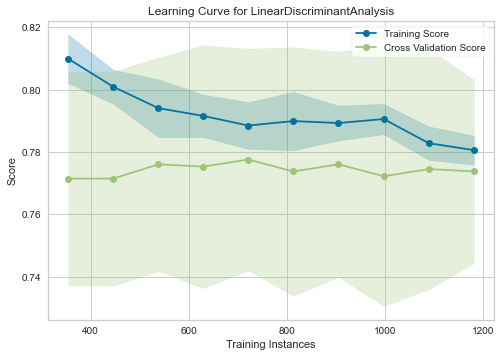

In [288]:
plot_model(lda, plot = 'learning')


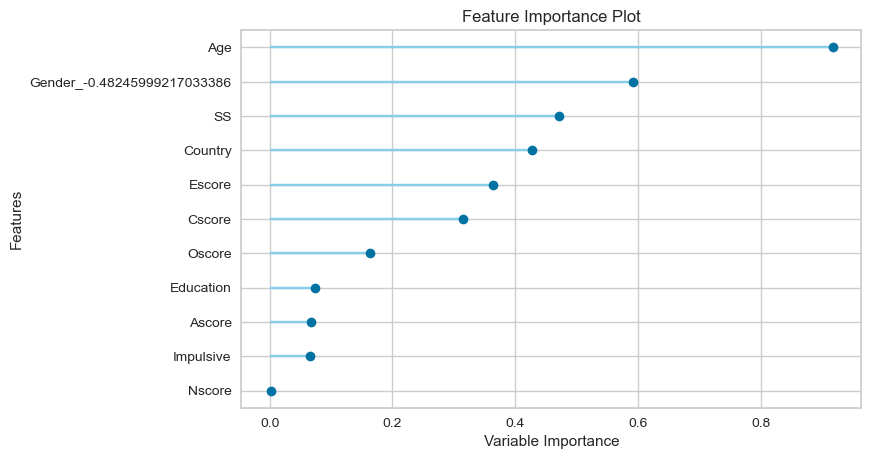

In [291]:
# feature importance
plot_model(lda,plot='feature_all')


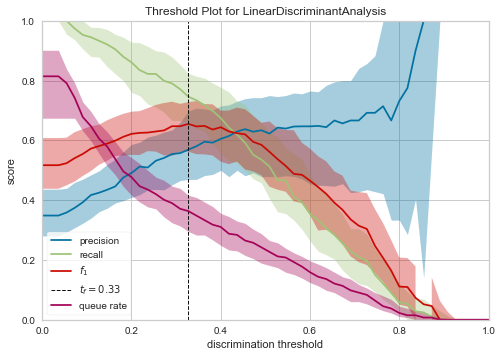

In [292]:

plot_model(lda,plot='threshold')

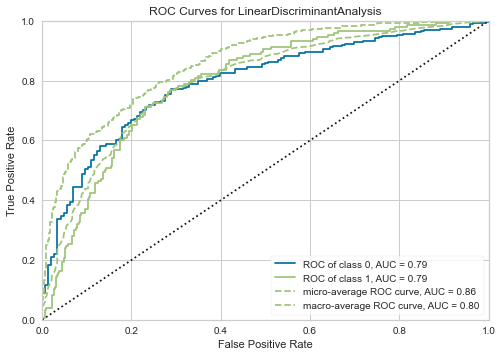

In [293]:

plot_model(lda,plot='auc')

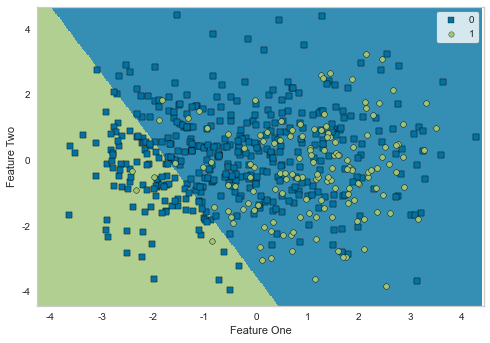

In [294]:

plot_model(lda,plot='boundary')

## Heroin

In [295]:
X = df_binary1.iloc[:,0:12]
y = df_binary1.iloc[:,22]
data = pd.concat([X,y],axis=1)
data.iloc[:,-1]

ID
1       Non-user
2       Non-user
3       Non-user
4       Non-user
5       Non-user
          ...   
1884    Non-user
1885    Non-user
1886    Non-user
1887    Non-user
1888    Non-user
Name: User_Heroin, Length: 1877, dtype: object

In [296]:
from pycaret.classification import *
setup_clf = setup(data=data, target = data.columns[-1],feature_selection=True)

,Description,Value
0,session_id,7007
1,Target,User_Heroin
2,Target Type,Binary
3,Label Encoded,"Non-user: 0, User: 1"
4,Original Data,"(1877, 13)"
5,Missing Values,False
6,Numeric Features,11
7,Categorical Features,1
8,Ordinal Features,False
9,High Cardinality Features,False


In [298]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9345,0.8099,0.0000,0.0000,0.0000,0.0000,0.0000,0.0320
ridge,Ridge Classifier,0.9345,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0330
lda,Linear Discriminant Analysis,0.9345,0.8103,0.0000,0.0000,0.0000,0.0000,0.0000,0.0150
rf,Random Forest Classifier,0.9330,0.7535,0.0000,0.0000,0.0000,-0.0028,-0.0047,0.2560
et,Extra Trees Classifier,0.9322,0.7739,0.0000,0.0000,0.0000,-0.0039,-0.0055,0.2430
knn,K Neighbors Classifier,0.9254,0.5947,0.0125,0.1000,0.0222,0.0062,0.0162,0.0630
svm,SVM - Linear Kernel,0.9254,0.0000,0.0375,0.0200,0.0261,0.0157,0.0151,0.0130
gbc,Gradient Boosting Classifier,0.9246,0.7723,0.0125,0.1000,0.0222,0.0043,0.0110,0.0930
lightgbm,Light Gradient Boosting Machine,0.9239,0.7440,0.0361,0.1700,0.0558,0.0341,0.0495,0.0520
ada,Ada Boost Classifier,0.9200,0.7544,0.0681,0.1243,0.0870,0.0594,0.0612,0.0640


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=7007, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [299]:
top5 = compare_models(sort='Accuracy',n_select=5)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9345,0.8099,0.0000,0.0000,0.0000,0.0000,0.0000,0.0310
ridge,Ridge Classifier,0.9345,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0380
lda,Linear Discriminant Analysis,0.9345,0.8103,0.0000,0.0000,0.0000,0.0000,0.0000,0.0150
rf,Random Forest Classifier,0.9330,0.7535,0.0000,0.0000,0.0000,-0.0028,-0.0047,0.3140
et,Extra Trees Classifier,0.9322,0.7739,0.0000,0.0000,0.0000,-0.0039,-0.0055,0.2710
knn,K Neighbors Classifier,0.9254,0.5947,0.0125,0.1000,0.0222,0.0062,0.0162,0.0610
svm,SVM - Linear Kernel,0.9254,0.0000,0.0375,0.0200,0.0261,0.0157,0.0151,0.0190
gbc,Gradient Boosting Classifier,0.9246,0.7723,0.0125,0.1000,0.0222,0.0043,0.0110,0.1000
lightgbm,Light Gradient Boosting Machine,0.9239,0.7440,0.0361,0.1700,0.0558,0.0341,0.0495,0.0530
ada,Ada Boost Classifier,0.9200,0.7544,0.0681,0.1243,0.0870,0.0594,0.0612,0.0820


In [300]:
tuned_top5 = [tune_model(i) for i in top5]
blender_top5 = blend_models(estimator_list=tuned_top5)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9318,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.9318,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.9318,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.9389,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.9389,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.9389,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.9389,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.9313,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.9313,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
9,0.9313,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


In [ ]:
# 모델 최종 확정, 전체 데이터 학습
final_model = finalize_model(blender_top5)
# 테스트셋 predict
prediction = predict_model(final_model, data=data)
# metric 확인
check_metric(prediction[data.columns[-1]], prediction['Label'], metric = 'Accuracy')



In [301]:
lr= create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9318,0.8320,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.9318,0.8582,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.9318,0.8455,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.9389,0.8069,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.9389,0.7307,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.9389,0.7602,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.9389,0.8547,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.9313,0.8251,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.9313,0.7951,0.0000,0.0000,0.0000,0.0000,0.0000
9,0.9313,0.7905,0.0000,0.0000,0.0000,0.0000,0.0000


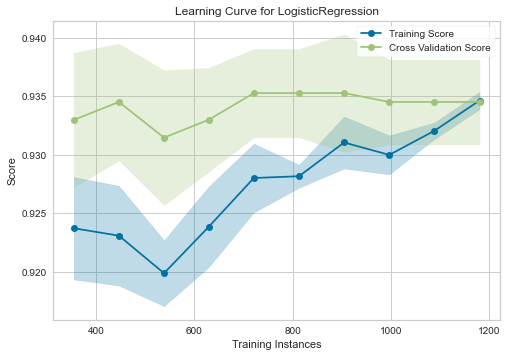

In [302]:
plot_model(lr, plot = 'learning')


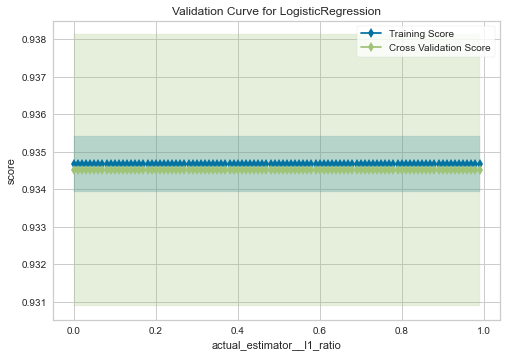

In [304]:
plot_model(lr, plot = 'vc')


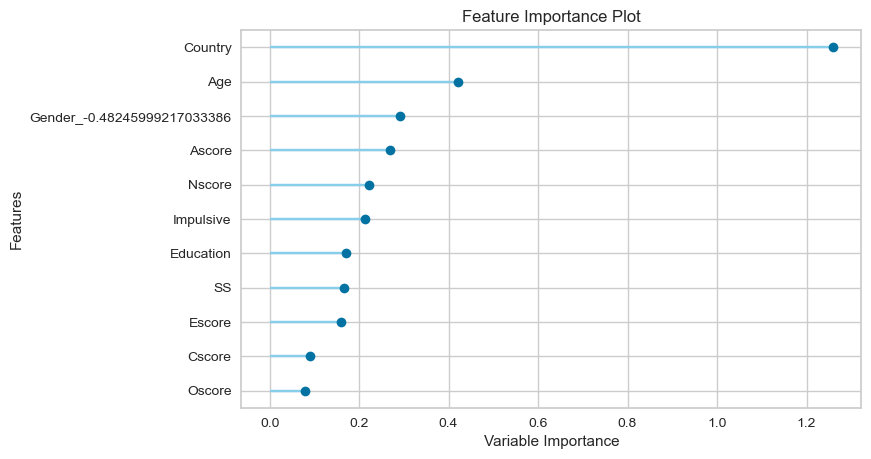

In [306]:
plot_model(lr, plot = 'feature_all')


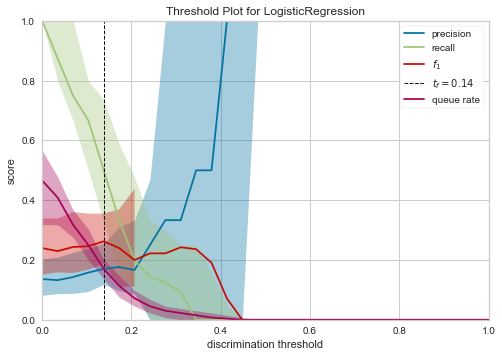

In [307]:
plot_model(lr, plot = 'threshold')


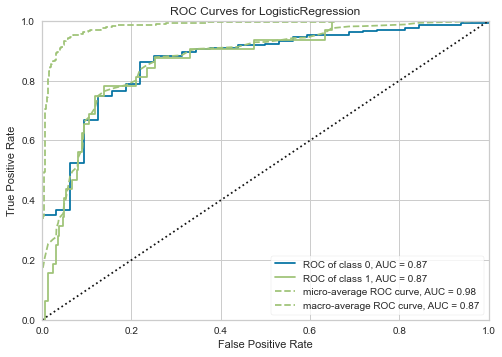

In [308]:
plot_model(lr, plot = 'auc')


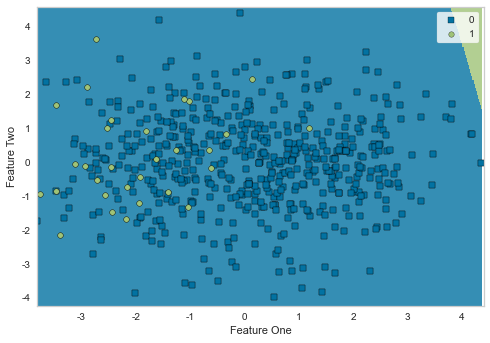

In [309]:
plot_model(lr, plot = 'boundary')


## Ketamine

In [310]:
drug1

,Age,Gender,Education,Country,Ethnicity,Nscore,Escore,Oscore,Ascore,Cscore,...,Ecstasy,Heroin,Ketamine,Legalh,LSD,Meth,Mushrooms,Nicotine,Semer,VSA
ID,,,,,,,,,,,,,,,,,,,,,
1,0.49788,0.48246,-0.05921,0.96082,0.12600,0.31287,-0.57545,-0.58331,-0.91699,-0.00665,...,0,0,0,0,0,0,0,2,0,0
2,-0.07854,-0.48246,1.98437,0.96082,-0.31685,-0.67825,1.93886,1.43533,0.76096,-0.14277,...,4,0,2,0,2,3,0,4,0,0
3,0.49788,-0.48246,-0.05921,0.96082,-0.31685,-0.46725,0.80523,-0.84732,-1.62090,-1.01450,...,0,0,0,0,0,0,1,0,0,0
4,-0.95197,0.48246,1.16365,0.96082,-0.31685,-0.14882,-0.80615,-0.01928,0.59042,0.58489,...,0,0,2,0,0,0,0,2,0,0
5,0.49788,0.48246,1.98437,0.96082,-0.31685,0.73545,-1.63340,-0.45174,-0.30172,1.30612,...,1,0,0,1,0,0,2,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1884,-0.95197,0.48246,-0.61113,-0.57009,-0.31685,-1.19430,1.74091,1.88511,0.76096,-1.13788,...,0,0,0,3,3,0,0,0,0,5
1885,-0.95197,-0.48246,-0.61113,-0.57009,-0.31685,-0.24649,1.74091,0.58331,0.76096,-1.51840,...,2,0,0,3,5,4,4,5,0,0
1886,-0.07854,0.48246,0.45468,-0.57009,-0.31685,1.13281,-1.37639,-1.27553,-1.77200,-1.38502,...,4,0,2,0,2,0,2,6,0,0


In [311]:
X = df_binary1.iloc[:,0:12]
y = df_binary1.iloc[:,23]
data = pd.concat([X,y],axis=1)
data.iloc[:,-1]

ID
1       Non-user
2       Non-user
3       Non-user
4       Non-user
5       Non-user
          ...   
1884    Non-user
1885    Non-user
1886    Non-user
1887    Non-user
1888    Non-user
Name: User_Ketamine, Length: 1877, dtype: object

In [312]:
from pycaret.classification import *
setup_clf = setup(data=data, target = data.columns[-1],feature_selection=True)

,Description,Value
0,session_id,6018
1,Target,User_Ketamine
2,Target Type,Binary
3,Label Encoded,"Non-user: 0, User: 1"
4,Original Data,"(1877, 13)"
5,Missing Values,False
6,Numeric Features,11
7,Categorical Features,1
8,Ordinal Features,False
9,High Cardinality Features,False


In [313]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.8964,0.7708,0.0368,0.4000,0.0667,0.0581,0.1076,0.2450
lr,Logistic Regression,0.8941,0.7683,0.0071,0.1000,0.0133,0.0106,0.0223,0.2600
ridge,Ridge Classifier,0.8941,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0210
lda,Linear Discriminant Analysis,0.8941,0.7625,0.0000,0.0000,0.0000,0.0000,0.0000,0.0160
rf,Random Forest Classifier,0.8926,0.7689,0.0077,0.1000,0.0143,0.0087,0.0174,0.2700
gbc,Gradient Boosting Classifier,0.8865,0.7707,0.0511,0.2202,0.0802,0.0535,0.0681,0.0870
knn,K Neighbors Classifier,0.8858,0.6936,0.0868,0.3125,0.1286,0.0930,0.1152,1.2890
ada,Ada Boost Classifier,0.8850,0.7104,0.0643,0.2000,0.0953,0.0637,0.0723,0.0670
qda,Quadratic Discriminant Analysis,0.8782,0.7712,0.1659,0.3737,0.2251,0.1685,0.1877,0.0250
lightgbm,Light Gradient Boosting Machine,0.8766,0.7461,0.0720,0.2700,0.1055,0.0608,0.0791,0.0540


ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=6018, verbose=0,
                     warm_start=False)

In [314]:
top5 = compare_models(sort='Accuracy',n_select=5)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,0.8964,0.7708,0.0368,0.4000,0.0667,0.0581,0.1076,0.2440
lr,Logistic Regression,0.8941,0.7683,0.0071,0.1000,0.0133,0.0106,0.0223,0.0330
ridge,Ridge Classifier,0.8941,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0100
lda,Linear Discriminant Analysis,0.8941,0.7625,0.0000,0.0000,0.0000,0.0000,0.0000,0.0110
rf,Random Forest Classifier,0.8926,0.7689,0.0077,0.1000,0.0143,0.0087,0.0174,0.2760
gbc,Gradient Boosting Classifier,0.8865,0.7707,0.0511,0.2202,0.0802,0.0535,0.0681,0.1060
knn,K Neighbors Classifier,0.8858,0.6936,0.0868,0.3125,0.1286,0.0930,0.1152,0.0590
ada,Ada Boost Classifier,0.8850,0.7104,0.0643,0.2000,0.0953,0.0637,0.0723,0.0780
qda,Quadratic Discriminant Analysis,0.8782,0.7712,0.1659,0.3737,0.2251,0.1685,0.1877,0.0160
lightgbm,Light Gradient Boosting Machine,0.8766,0.7461,0.0720,0.2700,0.1055,0.0608,0.0791,0.0460


In [315]:
tuned_top5 = [tune_model(i) for i in top5]
blender_top5 = blend_models(estimator_list=tuned_top5)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8939,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.8939,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.8939,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.9008,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.8931,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.8931,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.8931,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.8931,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.8931,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
9,0.8931,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


In [317]:
# 모델 최종 확정, 전체 데이터 학습
final_model = finalize_model(blender_top5)
# 테스트셋 predict
prediction = predict_model(final_model, data=data)
# metric 확인
check_metric(prediction[data.columns[-1]], prediction['Label'], metric = 'Accuracy')



LinAlgError: The leading minor of order 2 of B is not positive definite. The factorization of B could not be completed and no eigenvalues or eigenvectors were computed.

In [318]:
et= create_model('et')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8864,0.6880,0.0000,0.0000,0.0000,-0.0143,-0.0301
1,0.9015,0.8211,0.0714,1.0000,0.1333,0.1209,0.2537
2,0.9015,0.7479,0.0714,1.0000,0.1333,0.1209,0.2537
3,0.9160,0.8145,0.1538,1.0000,0.2667,0.2467,0.3751
4,0.8931,0.7961,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.8931,0.7610,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.9008,0.7891,0.0714,1.0000,0.1333,0.1208,0.2535
7,0.8931,0.6673,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.8931,0.8333,0.0000,0.0000,0.0000,0.0000,0.0000
9,0.8855,0.7894,0.0000,0.0000,0.0000,-0.0145,-0.0303


## Legalh

In [319]:
X = df_binary1.iloc[:,0:12]
y = df_binary1.iloc[:,24]
data = pd.concat([X,y],axis=1)
data.iloc[:,-1]

ID
1       Non-user
2       Non-user
3       Non-user
4       Non-user
5       Non-user
          ...   
1884        User
1885        User
1886    Non-user
1887        User
1888        User
Name: User_Legalh, Length: 1877, dtype: object

In [320]:
from pycaret.classification import *
setup_clf = setup(data=data, target = data.columns[-1],feature_selection=True)

,Description,Value
0,session_id,7769
1,Target,User_Legalh
2,Target Type,Binary
3,Label Encoded,"Non-user: 0, User: 1"
4,Original Data,"(1877, 13)"
5,Missing Values,False
6,Numeric Features,11
7,Categorical Features,1
8,Ordinal Features,False
9,High Cardinality Features,False


In [321]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lda,Linear Discriminant Analysis,0.8104,0.8613,0.6816,0.6865,0.6830,0.5479,0.5488,0.0100
ridge,Ridge Classifier,0.8066,0.0000,0.6565,0.6871,0.6701,0.5336,0.5349,0.0160
lr,Logistic Regression,0.8058,0.8620,0.6362,0.6957,0.6626,0.5270,0.5295,0.0290
nb,Naive Bayes,0.7944,0.8582,0.7472,0.6383,0.6871,0.5359,0.5407,0.0220
et,Extra Trees Classifier,0.7944,0.8511,0.5986,0.6820,0.6364,0.4942,0.4970,0.2830
gbc,Gradient Boosting Classifier,0.7937,0.8478,0.6089,0.6760,0.6390,0.4955,0.4980,0.1090
ada,Ada Boost Classifier,0.7921,0.8382,0.6087,0.6745,0.6379,0.4930,0.4957,0.1030
qda,Quadratic Discriminant Analysis,0.7852,0.8498,0.6638,0.6400,0.6508,0.4960,0.4969,0.0340
svm,SVM - Linear Kernel,0.7845,0.0000,0.6890,0.6339,0.6581,0.5015,0.5045,0.0400
rf,Random Forest Classifier,0.7845,0.8467,0.5659,0.6711,0.6127,0.4652,0.4693,0.2840


LinearDiscriminantAnalysis(n_components=None, priors=None, shrinkage=None,
                           solver='svd', store_covariance=False, tol=0.0001)

In [322]:
top5 = compare_models(sort='Accuracy',n_select=5)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lda,Linear Discriminant Analysis,0.8104,0.8613,0.6816,0.6865,0.6830,0.5479,0.5488,0.0120
ridge,Ridge Classifier,0.8066,0.0000,0.6565,0.6871,0.6701,0.5336,0.5349,0.0200
lr,Logistic Regression,0.8058,0.8620,0.6362,0.6957,0.6626,0.5270,0.5295,0.0240
nb,Naive Bayes,0.7944,0.8582,0.7472,0.6383,0.6871,0.5359,0.5407,0.0230
et,Extra Trees Classifier,0.7944,0.8511,0.5986,0.6820,0.6364,0.4942,0.4970,0.2400
gbc,Gradient Boosting Classifier,0.7937,0.8478,0.6089,0.6760,0.6390,0.4955,0.4980,0.0930
ada,Ada Boost Classifier,0.7921,0.8382,0.6087,0.6745,0.6379,0.4930,0.4957,0.0620
qda,Quadratic Discriminant Analysis,0.7852,0.8498,0.6638,0.6400,0.6508,0.4960,0.4969,0.0180
svm,SVM - Linear Kernel,0.7845,0.0000,0.6890,0.6339,0.6581,0.5015,0.5045,0.0170
rf,Random Forest Classifier,0.7845,0.8467,0.5659,0.6711,0.6127,0.4652,0.4693,0.2540


In [323]:
tuned_top5 = [tune_model(i) for i in top5]
blender_top5 = blend_models(estimator_list=tuned_top5)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7424,0.0000,0.5000,0.5882,0.5405,0.3632,0.3655
1,0.8182,0.0000,0.7500,0.6818,0.7143,0.5814,0.5828
2,0.8106,0.0000,0.6000,0.7273,0.6575,0.5283,0.5330
3,0.8168,0.0000,0.6154,0.7273,0.6667,0.5416,0.5451
4,0.8244,0.0000,0.6667,0.7222,0.6933,0.5706,0.5715
5,0.7634,0.0000,0.5897,0.6053,0.5974,0.4299,0.4299
6,0.8092,0.0000,0.7179,0.6667,0.6914,0.5535,0.5543
7,0.8397,0.0000,0.7250,0.7436,0.7342,0.6194,0.6196
8,0.8321,0.0000,0.7500,0.7143,0.7317,0.6096,0.6100
9,0.8168,0.0000,0.6750,0.7105,0.6923,0.5620,0.5624


In [324]:
# 모델 최종 확정, 전체 데이터 학습
final_model = finalize_model(blender_top5)
# 테스트셋 predict
prediction = predict_model(final_model, data=data)
# metric 확인
check_metric(prediction[data.columns[-1]], prediction['Label'], metric = 'Accuracy')



0.7842

In [325]:
lda= create_model('lda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7500,0.7995,0.5250,0.6000,0.5600,0.3865,0.3882
1,0.8258,0.8875,0.7750,0.6889,0.7294,0.6016,0.6038
2,0.8258,0.8978,0.6750,0.7297,0.7013,0.5786,0.5794
3,0.8092,0.8317,0.6410,0.6944,0.6667,0.5333,0.5341
4,0.8321,0.8907,0.6923,0.7297,0.7105,0.5924,0.5928
5,0.7557,0.7742,0.5897,0.5897,0.5897,0.4158,0.4158
6,0.8015,0.8880,0.7179,0.6512,0.6829,0.5390,0.5403
7,0.8473,0.8871,0.7500,0.7500,0.7500,0.6401,0.6401
8,0.8397,0.8783,0.7750,0.7209,0.7470,0.6299,0.6308
9,0.8168,0.8780,0.6750,0.7105,0.6923,0.5620,0.5624


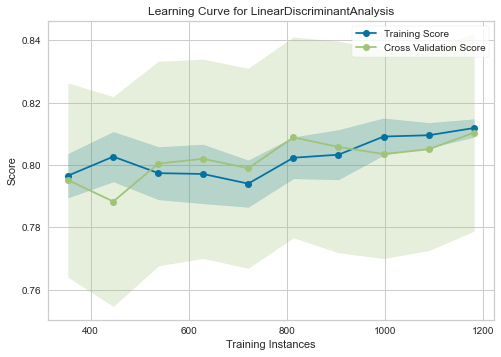

In [326]:
plot_model(lda, plot = 'learning')

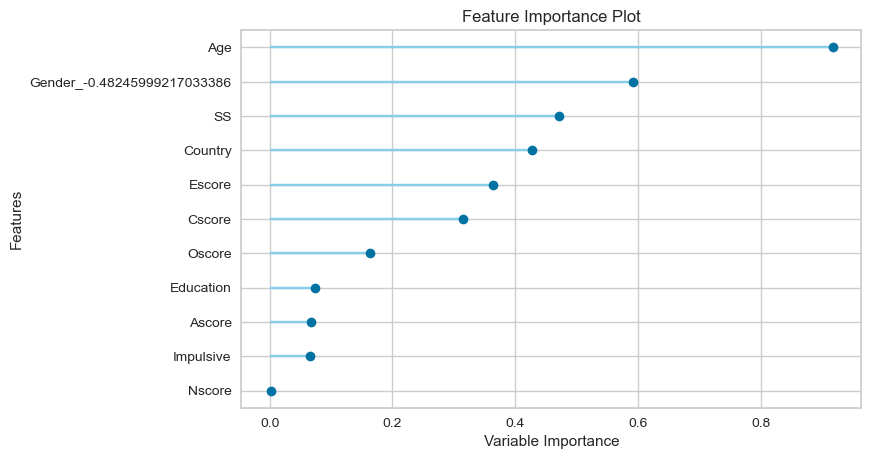

In [328]:
plot_model(lda, plot = 'feature_all')

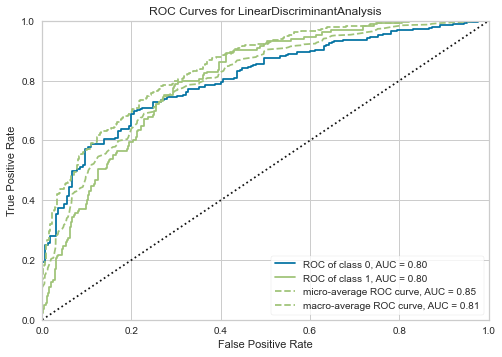

In [329]:
plot_model(lda, plot = 'auc')

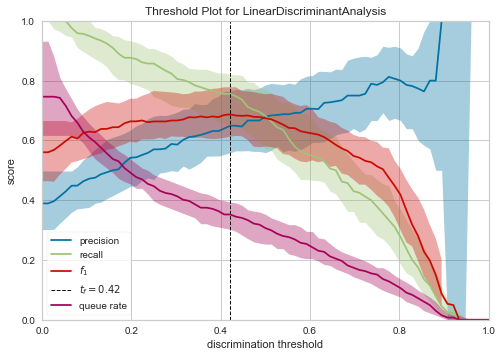

In [330]:
plot_model(lda, plot = 'threshold')

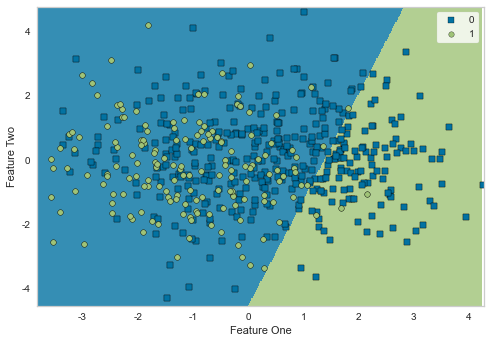

In [331]:
plot_model(lr, plot = 'boundary')

## LSD

In [332]:
X = df_binary1.iloc[:,0:12]
y = df_binary1.iloc[:,25]
data = pd.concat([X,y],axis=1)
data.iloc[:,-1]

ID
1       Non-user
2       Non-user
3       Non-user
4       Non-user
5       Non-user
          ...   
1884        User
1885        User
1886    Non-user
1887        User
1888        User
Name: User_LSD, Length: 1877, dtype: object

In [333]:
from pycaret.classification import *
setup_clf = setup(data=data, target = data.columns[-1],feature_selection=True)

,Description,Value
0,session_id,2972
1,Target,User_LSD
2,Target Type,Binary
3,Label Encoded,"Non-user: 0, User: 1"
4,Original Data,"(1877, 13)"
5,Missing Values,False
6,Numeric Features,11
7,Categorical Features,1
8,Ordinal Features,False
9,High Cardinality Features,False


In [334]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lda,Linear Discriminant Analysis,0.8523,0.8829,0.6097,0.6360,0.6193,0.5282,0.5304,0.0130
lr,Logistic Regression,0.8485,0.8854,0.5483,0.6435,0.5873,0.4961,0.5012,0.0350
qda,Quadratic Discriminant Analysis,0.8439,0.8766,0.6252,0.6065,0.6098,0.5132,0.5172,0.0310
ada,Ada Boost Classifier,0.8409,0.8555,0.5328,0.6125,0.5653,0.4697,0.4736,0.1020
gbc,Gradient Boosting Classifier,0.8401,0.8767,0.5369,0.6032,0.5650,0.4687,0.4713,0.1200
rf,Random Forest Classifier,0.8393,0.8802,0.4947,0.6176,0.5443,0.4498,0.4562,0.3110
ridge,Ridge Classifier,0.8378,0.0000,0.4178,0.6488,0.5051,0.4139,0.4299,0.0260
et,Extra Trees Classifier,0.8355,0.8729,0.4983,0.5954,0.5402,0.4422,0.4456,0.2380
lightgbm,Light Gradient Boosting Machine,0.8310,0.8676,0.5407,0.5743,0.5521,0.4494,0.4524,0.0500
knn,K Neighbors Classifier,0.8294,0.8369,0.5365,0.5810,0.5547,0.4500,0.4524,0.0580


LinearDiscriminantAnalysis(n_components=None, priors=None, shrinkage=None,
                           solver='svd', store_covariance=False, tol=0.0001)

In [350]:
top5 = compare_models(sort='Accuracy',n_select=5)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.8340,0.8269,0.2373,0.5831,0.3261,0.2541,0.2900,0.2820
lr,Logistic Regression,0.8271,0.8288,0.2158,0.5261,0.3000,0.2234,0.2538,0.0250
ridge,Ridge Classifier,0.8256,0.0000,0.0433,0.4500,0.0768,0.0561,0.1059,0.0150
lda,Linear Discriminant Analysis,0.8233,0.8278,0.2710,0.5049,0.3466,0.2572,0.2759,0.0120
et,Extra Trees Classifier,0.8233,0.8258,0.2197,0.4918,0.2937,0.2146,0.2384,0.2790
ada,Ada Boost Classifier,0.8225,0.8016,0.2973,0.5036,0.3653,0.2722,0.2879,0.0610
lightgbm,Light Gradient Boosting Machine,0.8225,0.8049,0.3362,0.4931,0.3946,0.2971,0.3065,0.0650
gbc,Gradient Boosting Classifier,0.8218,0.8038,0.2841,0.4823,0.3497,0.2588,0.2727,0.0800
knn,K Neighbors Classifier,0.8065,0.7557,0.2498,0.4360,0.3078,0.2069,0.2222,0.0620
qda,Quadratic Discriminant Analysis,0.8065,0.8093,0.3960,0.4589,0.4178,0.3041,0.3091,0.0180


In [336]:
tuned_top5 = [tune_model(i) for i in top5]
blender_top5 = blend_models(estimator_list=tuned_top5)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8409,0.8649,0.5185,0.6364,0.5714,0.4750,0.4788
1,0.8485,0.8382,0.6923,0.6000,0.6429,0.5473,0.5496
2,0.8409,0.8970,0.6923,0.5806,0.6316,0.5311,0.5345
3,0.8550,0.8938,0.6154,0.6400,0.6275,0.5374,0.5376
4,0.7939,0.8289,0.4231,0.4783,0.4490,0.3228,0.3237
5,0.8779,0.9253,0.6538,0.7083,0.6800,0.6047,0.6054
6,0.8931,0.9476,0.6538,0.7727,0.7083,0.6435,0.6468
7,0.8779,0.9040,0.6923,0.6923,0.6923,0.6161,0.6161
8,0.8702,0.9172,0.7308,0.6552,0.6909,0.6091,0.6105
9,0.8321,0.8736,0.4231,0.6111,0.5000,0.4031,0.4129


In [337]:
# 모델 최종 확정, 전체 데이터 학습
final_model = finalize_model(blender_top5)
# 테스트셋 predict
prediction = predict_model(final_model, data=data)
# metric 확인
check_metric(prediction[data.columns[-1]], prediction['Label'], metric = 'Accuracy')



0.8466

In [338]:
lda= create_model('lda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8106,0.8617,0.4815,0.5417,0.5098,0.3929,0.3940
1,0.8561,0.8385,0.7308,0.6129,0.6667,0.5758,0.5794
2,0.8333,0.8937,0.6538,0.5667,0.6071,0.5021,0.5041
3,0.8550,0.8934,0.6154,0.6400,0.6275,0.5374,0.5376
4,0.7863,0.8161,0.4231,0.4583,0.4400,0.3082,0.3086
5,0.8550,0.9103,0.6154,0.6400,0.6275,0.5374,0.5376
6,0.8931,0.9385,0.6538,0.7727,0.7083,0.6435,0.6468
7,0.8855,0.8872,0.6923,0.7200,0.7059,0.6348,0.6350
8,0.9008,0.9176,0.7692,0.7407,0.7547,0.6925,0.6927
9,0.8473,0.8718,0.4615,0.6667,0.5455,0.4573,0.4685


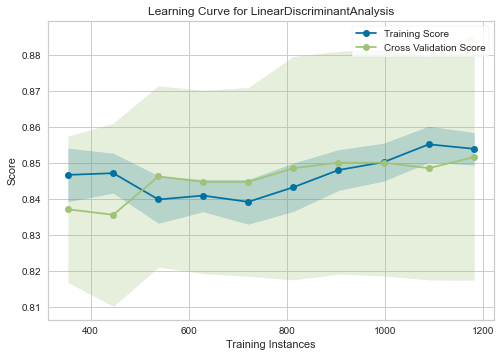

In [339]:
plot_model(lda, plot = 'learning')

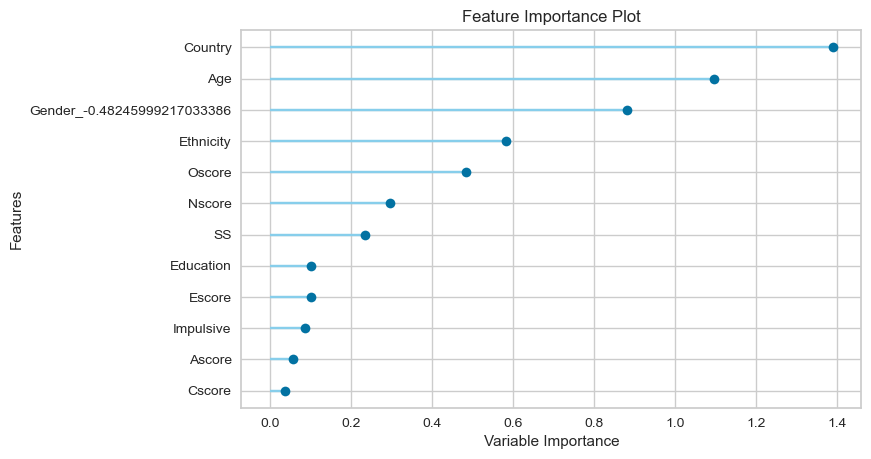

In [342]:
plot_model(lda, plot = 'feature_all')

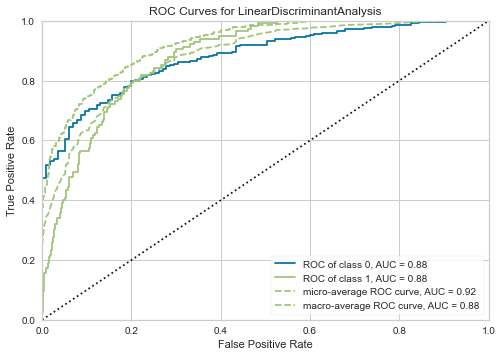

In [343]:
plot_model(lda, plot = 'auc')

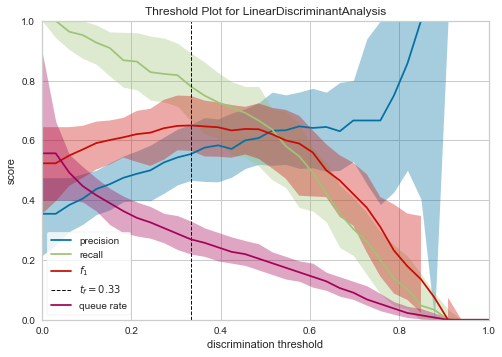

In [344]:
plot_model(lda, plot = 'threshold')

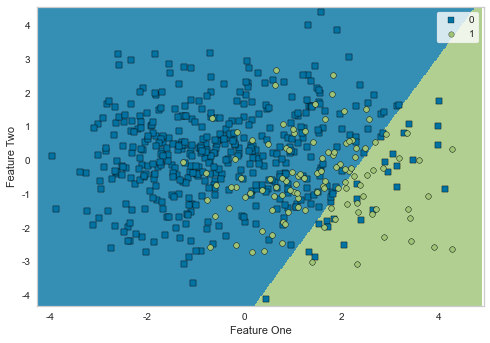

In [345]:
plot_model(lda, plot = 'boundary')

In [346]:
drug1

,Age,Gender,Education,Country,Ethnicity,Nscore,Escore,Oscore,Ascore,Cscore,...,Ecstasy,Heroin,Ketamine,Legalh,LSD,Meth,Mushrooms,Nicotine,Semer,VSA
ID,,,,,,,,,,,,,,,,,,,,,
1,0.49788,0.48246,-0.05921,0.96082,0.12600,0.31287,-0.57545,-0.58331,-0.91699,-0.00665,...,0,0,0,0,0,0,0,2,0,0
2,-0.07854,-0.48246,1.98437,0.96082,-0.31685,-0.67825,1.93886,1.43533,0.76096,-0.14277,...,4,0,2,0,2,3,0,4,0,0
3,0.49788,-0.48246,-0.05921,0.96082,-0.31685,-0.46725,0.80523,-0.84732,-1.62090,-1.01450,...,0,0,0,0,0,0,1,0,0,0
4,-0.95197,0.48246,1.16365,0.96082,-0.31685,-0.14882,-0.80615,-0.01928,0.59042,0.58489,...,0,0,2,0,0,0,0,2,0,0
5,0.49788,0.48246,1.98437,0.96082,-0.31685,0.73545,-1.63340,-0.45174,-0.30172,1.30612,...,1,0,0,1,0,0,2,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1884,-0.95197,0.48246,-0.61113,-0.57009,-0.31685,-1.19430,1.74091,1.88511,0.76096,-1.13788,...,0,0,0,3,3,0,0,0,0,5
1885,-0.95197,-0.48246,-0.61113,-0.57009,-0.31685,-0.24649,1.74091,0.58331,0.76096,-1.51840,...,2,0,0,3,5,4,4,5,0,0
1886,-0.07854,0.48246,0.45468,-0.57009,-0.31685,1.13281,-1.37639,-1.27553,-1.77200,-1.38502,...,4,0,2,0,2,0,2,6,0,0


## Meth

In [347]:
X = df_binary1.iloc[:,0:12]
y = df_binary1.iloc[:,26]
data = pd.concat([X,y],axis=1)
data.iloc[:,-1]

ID
1       Non-user
2           User
3       Non-user
4       Non-user
5       Non-user
          ...   
1884    Non-user
1885        User
1886    Non-user
1887    Non-user
1888    Non-user
Name: User_Meth, Length: 1877, dtype: object

In [348]:
from pycaret.classification import *
setup_clf = setup(data=data, target = data.columns[-1],feature_selection=True)

,Description,Value
0,session_id,8887
1,Target,User_Meth
2,Target Type,Binary
3,Label Encoded,"Non-user: 0, User: 1"
4,Original Data,"(1877, 13)"
5,Missing Values,False
6,Numeric Features,11
7,Categorical Features,1
8,Ordinal Features,False
9,High Cardinality Features,False


In [349]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.8340,0.8269,0.2373,0.5831,0.3261,0.2541,0.2900,0.3100
lr,Logistic Regression,0.8271,0.8288,0.2158,0.5261,0.3000,0.2234,0.2538,0.0370
ridge,Ridge Classifier,0.8256,0.0000,0.0433,0.4500,0.0768,0.0561,0.1059,0.0150
lda,Linear Discriminant Analysis,0.8233,0.8278,0.2710,0.5049,0.3466,0.2572,0.2759,0.0120
et,Extra Trees Classifier,0.8233,0.8258,0.2197,0.4918,0.2937,0.2146,0.2384,0.2540
ada,Ada Boost Classifier,0.8225,0.8016,0.2973,0.5036,0.3653,0.2722,0.2879,0.0640
lightgbm,Light Gradient Boosting Machine,0.8225,0.8049,0.3362,0.4931,0.3946,0.2971,0.3065,0.0440
gbc,Gradient Boosting Classifier,0.8218,0.8038,0.2841,0.4823,0.3497,0.2588,0.2727,0.0900
knn,K Neighbors Classifier,0.8065,0.7557,0.2498,0.4360,0.3078,0.2069,0.2222,0.0610
qda,Quadratic Discriminant Analysis,0.8065,0.8093,0.3960,0.4589,0.4178,0.3041,0.3091,0.0270


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=8887, verbose=0,
                       warm_start=False)

In [351]:
top5 = compare_models(sort='Accuracy',n_select=5)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.8340,0.8269,0.2373,0.5831,0.3261,0.2541,0.2900,0.2730
lr,Logistic Regression,0.8271,0.8288,0.2158,0.5261,0.3000,0.2234,0.2538,0.0250
ridge,Ridge Classifier,0.8256,0.0000,0.0433,0.4500,0.0768,0.0561,0.1059,0.0240
lda,Linear Discriminant Analysis,0.8233,0.8278,0.2710,0.5049,0.3466,0.2572,0.2759,0.0110
et,Extra Trees Classifier,0.8233,0.8258,0.2197,0.4918,0.2937,0.2146,0.2384,0.2620
ada,Ada Boost Classifier,0.8225,0.8016,0.2973,0.5036,0.3653,0.2722,0.2879,0.0610
lightgbm,Light Gradient Boosting Machine,0.8225,0.8049,0.3362,0.4931,0.3946,0.2971,0.3065,0.0540
gbc,Gradient Boosting Classifier,0.8218,0.8038,0.2841,0.4823,0.3497,0.2588,0.2727,0.1000
knn,K Neighbors Classifier,0.8065,0.7557,0.2498,0.4360,0.3078,0.2069,0.2222,0.0560
qda,Quadratic Discriminant Analysis,0.8065,0.8093,0.3960,0.4589,0.4178,0.3041,0.3091,0.0220


In [352]:
tuned_top5 = [tune_model(i) for i in top5]
blender_top5 = blend_models(estimator_list=tuned_top5)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8561,0.0000,0.2609,0.7500,0.3871,0.3265,0.3855
1,0.8030,0.0000,0.0417,0.2500,0.0714,0.0205,0.0312
2,0.8333,0.0000,0.1667,0.6667,0.2667,0.2092,0.2743
3,0.8321,0.0000,0.1304,0.6000,0.2143,0.1617,0.2222
4,0.8092,0.0000,0.1739,0.4000,0.2424,0.1522,0.1696
5,0.8168,0.0000,0.1739,0.4444,0.2500,0.1678,0.1919
6,0.8321,0.0000,0.1739,0.5714,0.2667,0.2012,0.2472
7,0.8168,0.0000,0.0435,0.3333,0.0769,0.0379,0.0635
8,0.8168,0.0000,0.0000,0.0000,0.0000,-0.0148,-0.0405
9,0.8473,0.0000,0.2174,0.7143,0.3333,0.2738,0.3364


In [353]:
# 모델 최종 확정, 전체 데이터 학습
final_model = finalize_model(blender_top5)
# 테스트셋 predict
prediction = predict_model(final_model, data=data)
# metric 확인
check_metric(prediction[data.columns[-1]], prediction['Label'], metric = 'Accuracy')



0.8615

In [354]:
rf= create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8485,0.8199,0.2609,0.6667,0.3750,0.3071,0.3512
1,0.7727,0.7978,0.1250,0.2500,0.1667,0.0517,0.0559
2,0.8258,0.8526,0.2917,0.5385,0.3784,0.2873,0.3056
3,0.8702,0.8555,0.3043,0.8750,0.4516,0.3970,0.4688
4,0.8244,0.7967,0.3913,0.5000,0.4390,0.3368,0.3403
5,0.8321,0.8188,0.2609,0.5455,0.3529,0.2700,0.2944
6,0.8626,0.8700,0.3043,0.7778,0.4375,0.3759,0.4299
7,0.8168,0.8492,0.0870,0.4000,0.1429,0.0855,0.1175
8,0.8244,0.8029,0.0435,0.5000,0.0800,0.0534,0.1062
9,0.8626,0.8060,0.3043,0.7778,0.4375,0.3759,0.4299


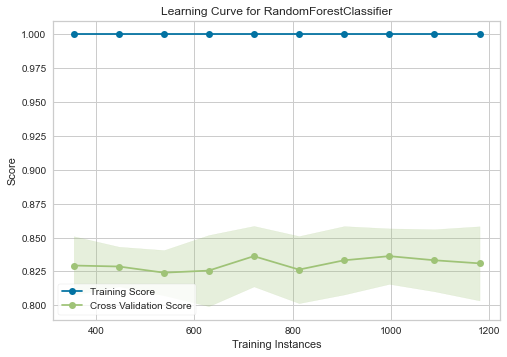

In [355]:
plot_model(rf,plot='learning')

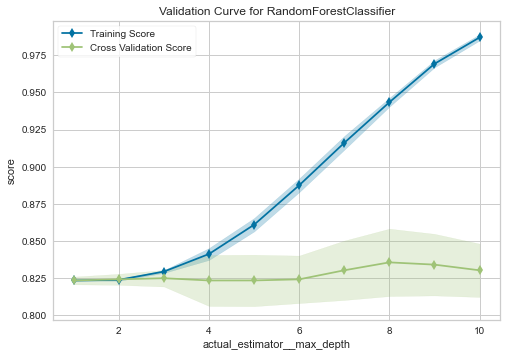

In [356]:
plot_model(rf,plot='vc')

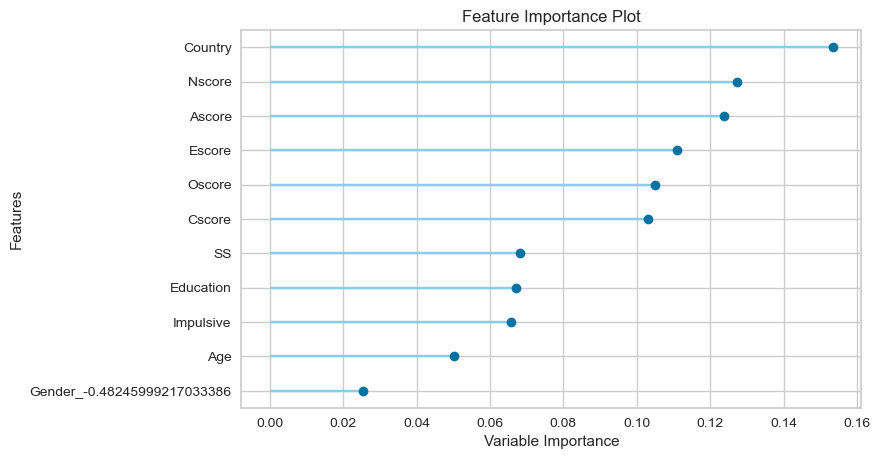

In [357]:
plot_model(rf,plot='feature_all')

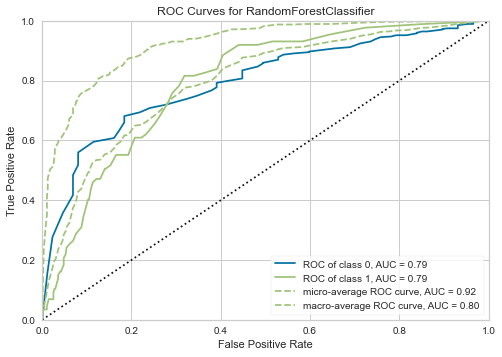

In [358]:
plot_model(rf,plot='auc')

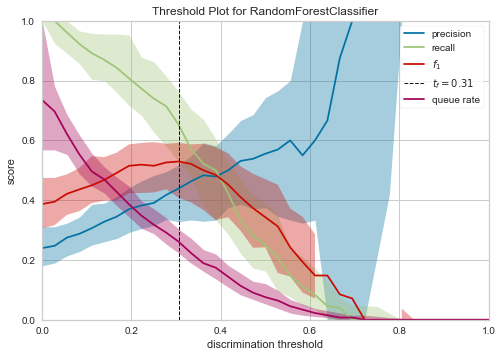

In [359]:
plot_model(rf,plot='threshold')


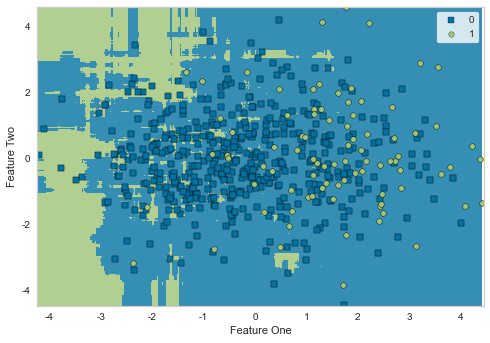

In [360]:
plot_model(rf,plot='boundary')

## Mushrooms

In [361]:
X = df_binary1.iloc[:,0:12]
y = df_binary1.iloc[:,27]
data = pd.concat([X,y],axis=1)
data.iloc[:,-1]

ID
1       Non-user
2       Non-user
3       Non-user
4       Non-user
5       Non-user
          ...   
1884    Non-user
1885        User
1886    Non-user
1887        User
1888        User
Name: User_Mushrooms, Length: 1877, dtype: object

In [363]:
from pycaret.classification import *
setup_clf = setup(data=data, target = data.columns[-1],feature_selection=True)

,Description,Value
0,session_id,5192
1,Target,User_Mushrooms
2,Target Type,Binary
3,Label Encoded,"Non-user: 0, User: 1"
4,Original Data,"(1877, 13)"
5,Missing Values,False
6,Numeric Features,11
7,Categorical Features,1
8,Ordinal Features,False
9,High Cardinality Features,False


In [364]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.8316,0.8709,0.5097,0.6399,0.5640,0.4624,0.4686,0.0430
lda,Linear Discriminant Analysis,0.8294,0.8704,0.5728,0.6145,0.5887,0.4822,0.4851,0.0100
ridge,Ridge Classifier,0.8278,0.0000,0.4606,0.6403,0.5320,0.4315,0.4418,0.0230
gbc,Gradient Boosting Classifier,0.8255,0.8583,0.5203,0.6196,0.5593,0.4532,0.4592,0.0830
rf,Random Forest Classifier,0.8248,0.8593,0.4534,0.6338,0.5199,0.4193,0.4316,0.2450
et,Extra Trees Classifier,0.8233,0.8645,0.4780,0.6189,0.5314,0.4271,0.4361,0.2380
qda,Quadratic Discriminant Analysis,0.8218,0.8578,0.6190,0.5868,0.5986,0.4849,0.4878,0.0160
knn,K Neighbors Classifier,0.8187,0.8221,0.5379,0.5927,0.5616,0.4482,0.4504,0.0580
ada,Ada Boost Classifier,0.8118,0.8293,0.4889,0.5800,0.5276,0.4121,0.4159,0.0620
nb,Naive Bayes,0.8096,0.8574,0.7063,0.5496,0.6163,0.4926,0.5010,0.0230


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=5192, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [365]:
top5 = compare_models(sort='Accuracy',n_select=5)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.8316,0.8709,0.5097,0.6399,0.5640,0.4624,0.4686,0.0310
lda,Linear Discriminant Analysis,0.8294,0.8704,0.5728,0.6145,0.5887,0.4822,0.4851,0.0130
ridge,Ridge Classifier,0.8278,0.0000,0.4606,0.6403,0.5320,0.4315,0.4418,0.0320
gbc,Gradient Boosting Classifier,0.8255,0.8583,0.5203,0.6196,0.5593,0.4532,0.4592,0.1380
rf,Random Forest Classifier,0.8248,0.8593,0.4534,0.6338,0.5199,0.4193,0.4316,0.2970
et,Extra Trees Classifier,0.8233,0.8645,0.4780,0.6189,0.5314,0.4271,0.4361,0.2410
qda,Quadratic Discriminant Analysis,0.8218,0.8578,0.6190,0.5868,0.5986,0.4849,0.4878,0.0240
knn,K Neighbors Classifier,0.8187,0.8221,0.5379,0.5927,0.5616,0.4482,0.4504,0.0570
ada,Ada Boost Classifier,0.8118,0.8293,0.4889,0.5800,0.5276,0.4121,0.4159,0.0800
nb,Naive Bayes,0.8096,0.8574,0.7063,0.5496,0.6163,0.4926,0.5010,0.0270


In [366]:
top5 = compare_models(sort='Accuracy',n_select=5)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.8316,0.8709,0.5097,0.6399,0.5640,0.4624,0.4686,0.0300
lda,Linear Discriminant Analysis,0.8294,0.8704,0.5728,0.6145,0.5887,0.4822,0.4851,0.0120
ridge,Ridge Classifier,0.8278,0.0000,0.4606,0.6403,0.5320,0.4315,0.4418,0.0310
gbc,Gradient Boosting Classifier,0.8255,0.8583,0.5203,0.6196,0.5593,0.4532,0.4592,0.1020
rf,Random Forest Classifier,0.8248,0.8593,0.4534,0.6338,0.5199,0.4193,0.4316,0.2880
et,Extra Trees Classifier,0.8233,0.8645,0.4780,0.6189,0.5314,0.4271,0.4361,0.2370
qda,Quadratic Discriminant Analysis,0.8218,0.8578,0.6190,0.5868,0.5986,0.4849,0.4878,0.0270
knn,K Neighbors Classifier,0.8187,0.8221,0.5379,0.5927,0.5616,0.4482,0.4504,0.0640
ada,Ada Boost Classifier,0.8118,0.8293,0.4889,0.5800,0.5276,0.4121,0.4159,0.0820
nb,Naive Bayes,0.8096,0.8574,0.7063,0.5496,0.6163,0.4926,0.5010,0.0320


In [367]:
tuned_top5 = [tune_model(i) for i in top5]
blender_top5 = blend_models(estimator_list=tuned_top5)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8485,0.0000,0.5172,0.7143,0.6000,0.5095,0.5196
1,0.8561,0.0000,0.6552,0.6786,0.6667,0.5749,0.5751
2,0.8485,0.0000,0.5862,0.6800,0.6296,0.5350,0.5374
3,0.8168,0.0000,0.4138,0.6316,0.5000,0.3938,0.4069
4,0.8626,0.0000,0.6897,0.6897,0.6897,0.6014,0.6014
5,0.8626,0.0000,0.5862,0.7391,0.6538,0.5696,0.5755
6,0.8321,0.0000,0.5714,0.6154,0.5926,0.4870,0.4875
7,0.7786,0.0000,0.2500,0.4667,0.3256,0.2074,0.2219
8,0.8168,0.0000,0.5714,0.5714,0.5714,0.4549,0.4549
9,0.8397,0.0000,0.5357,0.6522,0.5882,0.4899,0.4935


In [368]:
# 모델 최종 확정, 전체 데이터 학습
final_model = finalize_model(blender_top5)
# 테스트셋 predict
prediction = predict_model(final_model, data=data)
# metric 확인
check_metric(prediction[data.columns[-1]], prediction['Label'], metric = 'Accuracy')



0.8263

In [369]:
lr= create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8485,0.8554,0.5172,0.7143,0.6000,0.5095,0.5196
1,0.8561,0.9073,0.6552,0.6786,0.6667,0.5749,0.5751
2,0.8561,0.8684,0.5517,0.7273,0.6275,0.5403,0.5482
3,0.8092,0.8807,0.3793,0.6111,0.4681,0.3595,0.3747
4,0.8397,0.8780,0.5862,0.6538,0.6182,0.5171,0.5183
5,0.8626,0.8780,0.5862,0.7391,0.6538,0.5696,0.5755
6,0.8244,0.8339,0.5357,0.6000,0.5660,0.4564,0.4576
7,0.7863,0.8370,0.2857,0.5000,0.3636,0.2465,0.2605
8,0.8092,0.8620,0.5357,0.5556,0.5455,0.4247,0.4248
9,0.8244,0.9081,0.4643,0.6190,0.5306,0.4253,0.4320


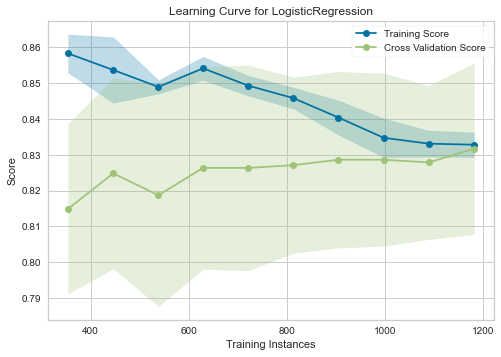

In [370]:
plot_model(lr,plot='learning')

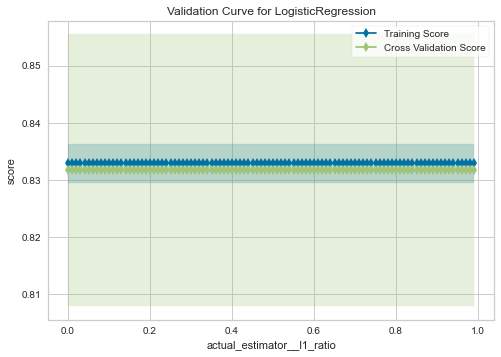

In [373]:
plot_model(lr,plot='vc')

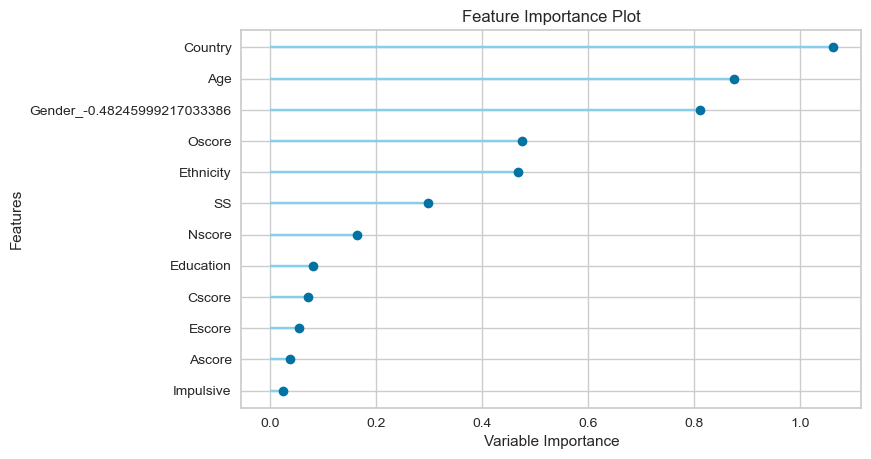

In [374]:
plot_model(lr,plot='feature_all')

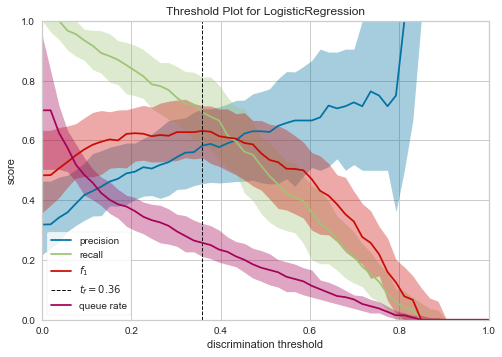

In [375]:
plot_model(lr,plot='threshold')

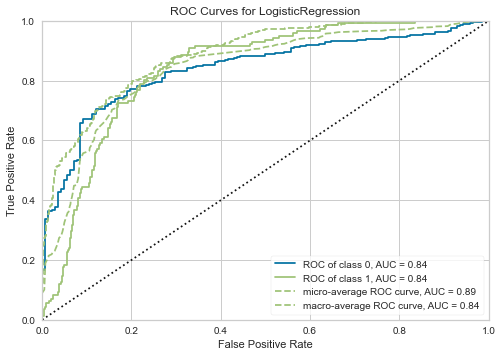

In [377]:
plot_model(lr,plot='auc')

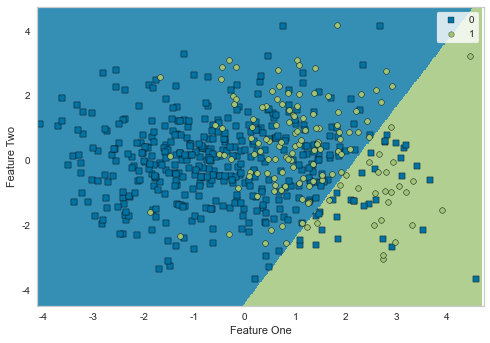

In [378]:
plot_model(lr,plot='boundary')

## Nicotine

In [379]:
X = df_binary1.iloc[:,0:12]
y = df_binary1.iloc[:,28]
data = pd.concat([X,y],axis=1)
data.iloc[:,-1]

ID
1       Non-user
2           User
3       Non-user
4       Non-user
5       Non-user
          ...   
1884    Non-user
1885        User
1886        User
1887        User
1888        User
Name: User_Nicotine, Length: 1877, dtype: object

In [380]:
from pycaret.classification import *
setup_clf = setup(data=data, target = data.columns[-1],feature_selection=True)

,Description,Value
0,session_id,1152
1,Target,User_Nicotine
2,Target Type,Binary
3,Label Encoded,"Non-user: 0, User: 1"
4,Original Data,"(1877, 13)"
5,Missing Values,False
6,Numeric Features,11
7,Categorical Features,1
8,Ordinal Features,False
9,High Cardinality Features,False


In [381]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.7128,0.7734,0.7905,0.7352,0.7605,0.4025,0.4069,0.2820
lda,Linear Discriminant Analysis,0.7120,0.7724,0.7615,0.7470,0.7536,0.4070,0.4080,0.0120
ridge,Ridge Classifier,0.7113,0.0000,0.7615,0.7459,0.7530,0.4053,0.4063,0.0200
et,Extra Trees Classifier,0.7090,0.7622,0.7774,0.7362,0.7552,0.3967,0.3994,0.2630
lr,Logistic Regression,0.7075,0.7728,0.7667,0.7388,0.7520,0.3954,0.3966,0.0280
qda,Quadratic Discriminant Analysis,0.7060,0.7586,0.7496,0.7442,0.7461,0.3966,0.3978,0.0210
nb,Naive Bayes,0.7052,0.7683,0.7127,0.7627,0.7362,0.4027,0.4046,0.0250
gbc,Gradient Boosting Classifier,0.7014,0.7492,0.7667,0.7307,0.7478,0.3820,0.3836,0.1380
lightgbm,Light Gradient Boosting Machine,0.6938,0.7392,0.7733,0.7207,0.7446,0.3627,0.3665,0.0590
ada,Ada Boost Classifier,0.6892,0.7486,0.7483,0.7259,0.7356,0.3582,0.3603,0.0780


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=1152, verbose=0,
                       warm_start=False)

In [382]:
top5 = compare_models(sort='Accuracy',n_select=5)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.7128,0.7734,0.7905,0.7352,0.7605,0.4025,0.4069,0.3020
lda,Linear Discriminant Analysis,0.7120,0.7724,0.7615,0.7470,0.7536,0.4070,0.4080,0.0140
ridge,Ridge Classifier,0.7113,0.0000,0.7615,0.7459,0.7530,0.4053,0.4063,0.0270
et,Extra Trees Classifier,0.7090,0.7622,0.7774,0.7362,0.7552,0.3967,0.3994,0.2480
lr,Logistic Regression,0.7075,0.7728,0.7667,0.7388,0.7520,0.3954,0.3966,0.0260
qda,Quadratic Discriminant Analysis,0.7060,0.7586,0.7496,0.7442,0.7461,0.3966,0.3978,0.0270
nb,Naive Bayes,0.7052,0.7683,0.7127,0.7627,0.7362,0.4027,0.4046,0.0220
gbc,Gradient Boosting Classifier,0.7014,0.7492,0.7667,0.7307,0.7478,0.3820,0.3836,0.0940
lightgbm,Light Gradient Boosting Machine,0.6938,0.7392,0.7733,0.7207,0.7446,0.3627,0.3665,0.0560
ada,Ada Boost Classifier,0.6892,0.7486,0.7483,0.7259,0.7356,0.3582,0.3603,0.0710


In [383]:
tuned_top5 = [tune_model(i) for i in top5]
blender_top5 = blend_models(estimator_list=tuned_top5)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7652,0.0000,0.7368,0.8358,0.7832,0.5292,0.5342
1,0.7348,0.0000,0.7632,0.7733,0.7682,0.4585,0.4586
2,0.7803,0.0000,0.7895,0.8219,0.8054,0.5534,0.5540
3,0.6794,0.0000,0.7067,0.7260,0.7162,0.3479,0.3481
4,0.6870,0.0000,0.7105,0.7397,0.7248,0.3623,0.3627
5,0.7176,0.0000,0.6842,0.8000,0.7376,0.4358,0.4421
6,0.7634,0.0000,0.8026,0.7922,0.7974,0.5130,0.5131
7,0.6870,0.0000,0.7237,0.7333,0.7285,0.3591,0.3592
8,0.6947,0.0000,0.8026,0.7093,0.7531,0.3571,0.3618
9,0.7023,0.0000,0.6974,0.7681,0.7310,0.3994,0.4018


In [384]:
# 모델 최종 확정, 전체 데이터 학습
final_model = finalize_model(blender_top5)
# 테스트셋 predict
prediction = predict_model(final_model, data=data)
# metric 확인
check_metric(prediction[data.columns[-1]], prediction['Label'], metric = 'Accuracy')



0.7379

In [385]:
rf= create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7348,0.8124,0.7237,0.7971,0.7586,0.4660,0.4687
1,0.7045,0.7836,0.8289,0.7079,0.7636,0.3762,0.3846
2,0.7652,0.8564,0.8947,0.7473,0.8144,0.5017,0.5170
3,0.7176,0.7211,0.8000,0.7317,0.7643,0.4137,0.4163
4,0.6565,0.7300,0.7237,0.6962,0.7097,0.2895,0.2898
5,0.7099,0.7488,0.7500,0.7500,0.7500,0.4045,0.4045
6,0.7481,0.7921,0.8289,0.7590,0.7925,0.4736,0.4766
7,0.6794,0.7635,0.7632,0.7073,0.7342,0.3318,0.3333
8,0.6870,0.7545,0.8289,0.6923,0.7545,0.3324,0.3428
9,0.7252,0.7720,0.7632,0.7632,0.7632,0.4359,0.4359


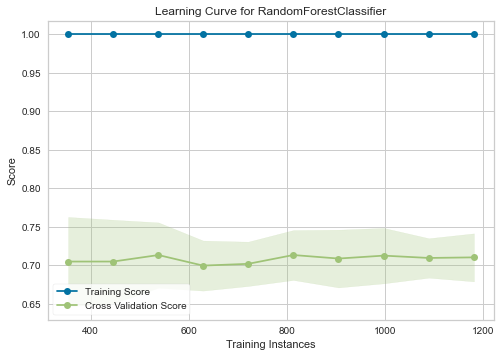

In [387]:
plot_model(rf,plot='learning')

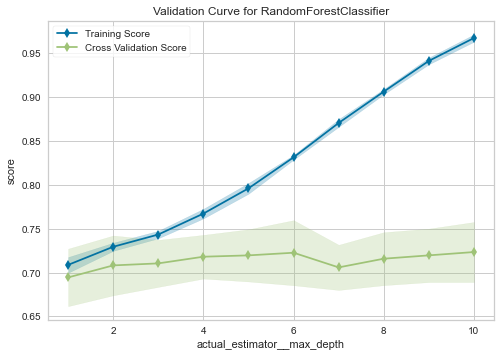

In [388]:
plot_model(rf,plot='vc')

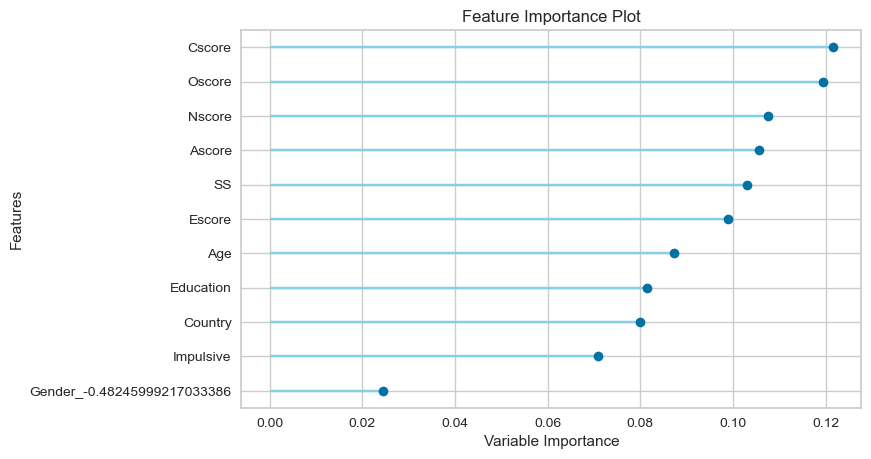

In [389]:
plot_model(rf,plot='feature_all')

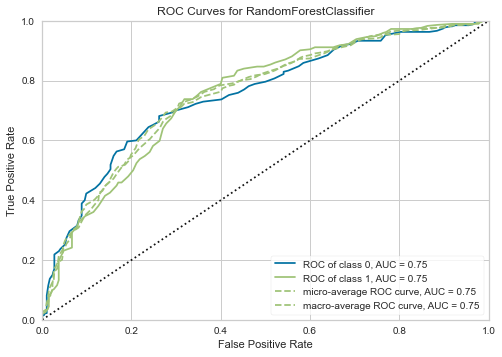

In [390]:
plot_model(rf,plot='auc')

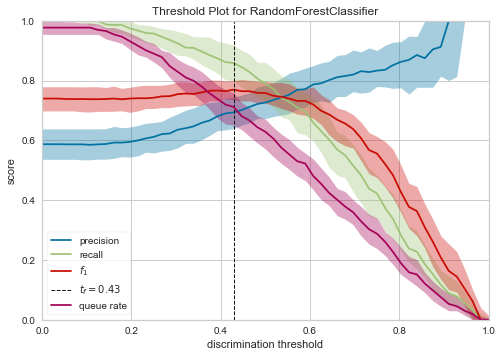

In [391]:
plot_model(rf,plot='threshold')

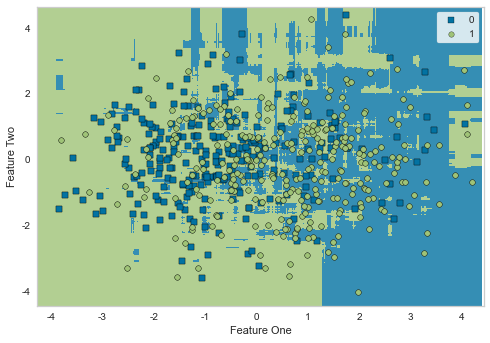

In [392]:
plot_model(rf,plot='boundary')

## VSA

In [393]:
X = df_binary1.iloc[:,0:12]
y = df_binary1.iloc[:,29]
data = pd.concat([X,y],axis=1)
data.iloc[:,-1]

ID
1       Non-user
2       Non-user
3       Non-user
4       Non-user
5       Non-user
          ...   
1884        User
1885    Non-user
1886    Non-user
1887    Non-user
1888    Non-user
Name: User_VSA, Length: 1877, dtype: object

In [394]:
from pycaret.classification import *
setup_clf = setup(data=data, target = data.columns[-1],feature_selection=True)

,Description,Value
0,session_id,8415
1,Target,User_VSA
2,Target Type,Binary
3,Label Encoded,"Non-user: 0, User: 1"
4,Original Data,"(1877, 13)"
5,Missing Values,False
6,Numeric Features,11
7,Categorical Features,1
8,Ordinal Features,False
9,High Cardinality Features,False


In [396]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
ridge,Ridge Classifier,0.9490,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0220
lr,Logistic Regression,0.9482,0.7986,0.0000,0.0000,0.0000,-0.0013,-0.0019,0.0290
lda,Linear Discriminant Analysis,0.9482,0.7923,0.0000,0.0000,0.0000,-0.0013,-0.0019,0.0100
rf,Random Forest Classifier,0.9475,0.7570,0.0000,0.0000,0.0000,-0.0024,-0.0029,0.2680
et,Extra Trees Classifier,0.9459,0.7869,0.0000,0.0000,0.0000,-0.0051,-0.0068,0.2410
svm,SVM - Linear Kernel,0.9429,0.0000,0.0167,0.0200,0.0182,0.0082,0.0057,0.0170
lightgbm,Light Gradient Boosting Machine,0.9414,0.7520,0.0000,0.0000,0.0000,-0.0123,-0.0164,0.0440
knn,K Neighbors Classifier,0.9399,0.5849,0.0000,0.0000,0.0000,-0.0138,-0.0166,0.0610
gbc,Gradient Boosting Classifier,0.9399,0.7570,0.0143,0.0500,0.0222,0.0075,0.0087,0.0930
ada,Ada Boost Classifier,0.9376,0.7266,0.0286,0.1333,0.0450,0.0265,0.0383,0.0600


RidgeClassifier(alpha=1.0, class_weight=None, copy_X=True, fit_intercept=True,
                max_iter=None, normalize=False, random_state=8415,
                solver='auto', tol=0.001)

In [397]:
top5 = compare_models(sort='Accuracy',n_select=5)


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
ridge,Ridge Classifier,0.9490,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0140
lr,Logistic Regression,0.9482,0.7986,0.0000,0.0000,0.0000,-0.0013,-0.0019,0.0260
lda,Linear Discriminant Analysis,0.9482,0.7923,0.0000,0.0000,0.0000,-0.0013,-0.0019,0.0080
rf,Random Forest Classifier,0.9475,0.7570,0.0000,0.0000,0.0000,-0.0024,-0.0029,0.2700
et,Extra Trees Classifier,0.9459,0.7869,0.0000,0.0000,0.0000,-0.0051,-0.0068,0.2650
svm,SVM - Linear Kernel,0.9429,0.0000,0.0167,0.0200,0.0182,0.0082,0.0057,0.0360
lightgbm,Light Gradient Boosting Machine,0.9414,0.7520,0.0000,0.0000,0.0000,-0.0123,-0.0164,0.0450
knn,K Neighbors Classifier,0.9399,0.5849,0.0000,0.0000,0.0000,-0.0138,-0.0166,0.0600
gbc,Gradient Boosting Classifier,0.9399,0.7570,0.0143,0.0500,0.0222,0.0075,0.0087,0.0930
ada,Ada Boost Classifier,0.9376,0.7266,0.0286,0.1333,0.0450,0.0265,0.0383,0.0640


In [398]:
tuned_top5 = [tune_model(i) for i in top5]
blender_top5 = blend_models(estimator_list=tuned_top5)


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9470,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.9470,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.9470,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.9542,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.9542,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.9542,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.9466,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.9466,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.9466,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
9,0.9466,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


In [399]:
# 모델 최종 확정, 전체 데이터 학습
final_model = finalize_model(blender_top5)
# 테스트셋 predict
prediction = predict_model(final_model, data=data)
# metric 확인
check_metric(prediction[data.columns[-1]], prediction['Label'], metric = 'Accuracy')



0.9505

In [400]:
rg= create_model('ridge')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9470,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.9470,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.9470,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.9542,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
4,0.9542,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
5,0.9542,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.9466,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
7,0.9466,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
8,0.9466,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
9,0.9466,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000


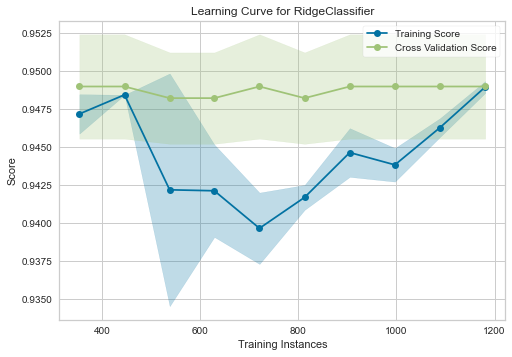

In [404]:
plot_model(rg,plot='learning')

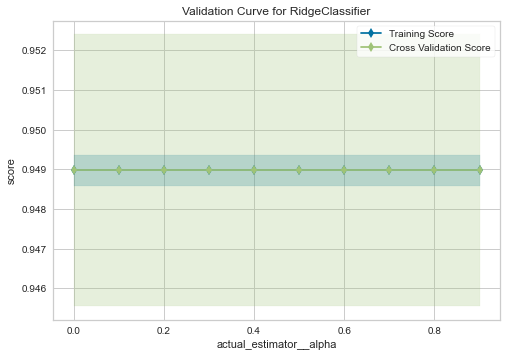

In [405]:
plot_model(rg,plot='vc')

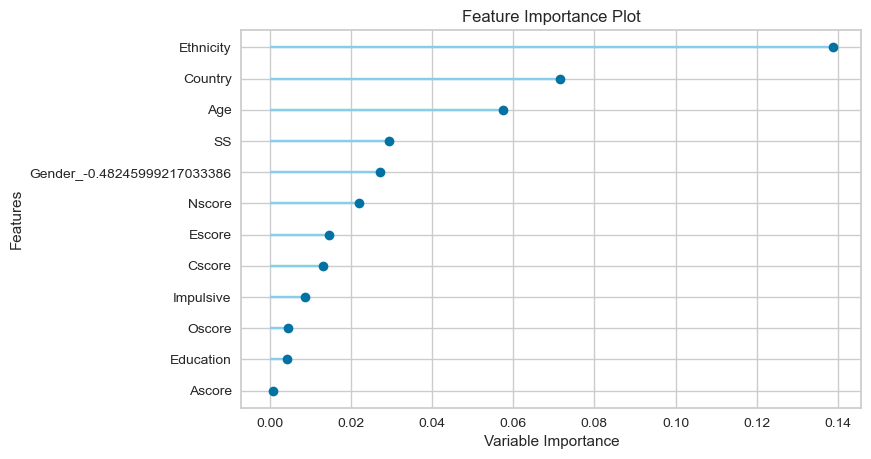

In [407]:
plot_model(rg,plot='feature_all')

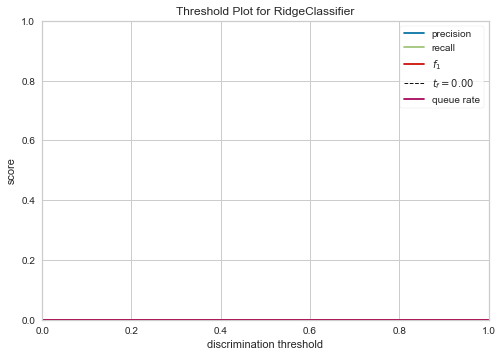

In [410]:
plot_model(rg,plot='threshold')

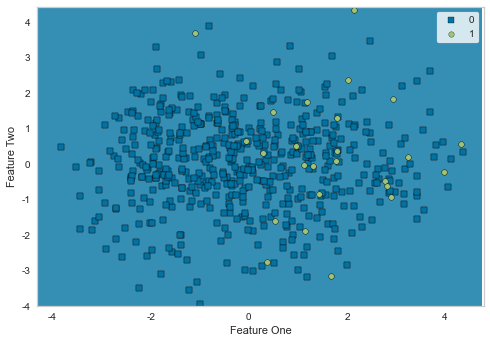

In [411]:
plot_model(rg,plot='boundary')